### First Delivery - Exploratory Data Analysis
Group 22

|      |     Student Name     |     Student ID     | 
|---   |         ---          |           ---          |
| 1    |      João Rodrigues        |       20241037         | 
| 2    |      Martim António        |        20240601        | 
| 3    |      Susana Reis        |       20240567         |
| 4    |      Victor Pita        |       20240596         | 

In [1]:
import pandas as pd 
import numpy as np  
import seaborn as sns
import category_encoders as ce
from math import ceil
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import DBSCAN
from minisom import MiniSom
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
import matplotlib.cm as cm
from matplotlib.patches import RegularPolygon
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('DM2425_ABCDEats_DATASET.csv')

In [3]:
df = data.copy()

In [4]:
df.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,...,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,...,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,...,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,...,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,...,0,0,0,0,0,0,0,0,0,0


In [5]:
df.shape

(31888, 56)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31888 entries, 0 to 31887
Data columns (total 56 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               31888 non-null  object 
 1   customer_region           31888 non-null  object 
 2   customer_age              31161 non-null  float64
 3   vendor_count              31888 non-null  int64  
 4   product_count             31888 non-null  int64  
 5   is_chain                  31888 non-null  int64  
 6   first_order               31782 non-null  float64
 7   last_order                31888 non-null  int64  
 8   last_promo                31888 non-null  object 
 9   payment_method            31888 non-null  object 
 10  CUI_American              31888 non-null  float64
 11  CUI_Asian                 31888 non-null  float64
 12  CUI_Beverages             31888 non-null  float64
 13  CUI_Cafe                  31888 non-null  float64
 14  CUI_Ch

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,31161.0,27.506499,7.160898,15.0,23.0,26.0,31.00,80.00
vendor_count,31888.0,3.102609,2.771587,0.0,1.0,2.0,4.00,41.00
product_count,31888.0,5.668245,6.957287,0.0,2.0,3.0,7.00,269.00
is_chain,31888.0,2.818866,3.977529,0.0,1.0,2.0,3.00,83.00
first_order,31782.0,28.478604,24.109086,0.0,7.0,22.0,45.00,90.00
last_order,31888.0,63.675521,23.226123,0.0,49.0,70.0,83.00,90.00
CUI_American,31888.0,4.880438,11.654018,0.0,0.0,0.0,5.66,280.21
CUI_Asian,31888.0,9.960451,23.564351,0.0,0.0,0.0,11.83,896.71
CUI_Beverages,31888.0,2.300633,8.479734,0.0,0.0,0.0,0.00,229.22
CUI_Cafe,31888.0,0.801163,6.427132,0.0,0.0,0.0,0.00,326.10


In [8]:
df.select_dtypes(include=['object'])

,customer_id,customer_region,last_promo,payment_method
0,1b8f824d5e,2360,DELIVERY,DIGI
1,5d272b9dcb,8670,DISCOUNT,DIGI
2,f6d1b2ba63,4660,DISCOUNT,CASH
3,180c632ed8,4660,DELIVERY,DIGI
4,4eb37a6705,4660,-,DIGI
...,...,...,...,...
31883,f4e366c281,8670,FREEBIE,DIGI
31884,f6b6709018,8670,DELIVERY,DIGI
31885,f74ad8ce3f,8670,-,DIGI
31886,f7b19c0241,8670,DISCOUNT,DIGI


In [9]:
#there are '-' values in customer_region meaning some customers are missing region
df['customer_region'].unique()

array(['2360', '8670', '4660', '2440', '-', '4140', '2490', '8370',
       '8550'], dtype=object)

In [10]:
#there are '-' values in last_promo meaning 
df['last_promo'].unique()

array(['DELIVERY', 'DISCOUNT', '-', 'FREEBIE'], dtype=object)

In [11]:
cui_columns = [col for col in df.columns if col.startswith('CUI_')]
dow_columns = [col for col in df.columns if col.startswith('DOW_')]
hr_columns = [col for col in df.columns if col.startswith('HR_')]

# Graphics for exploratory analysis

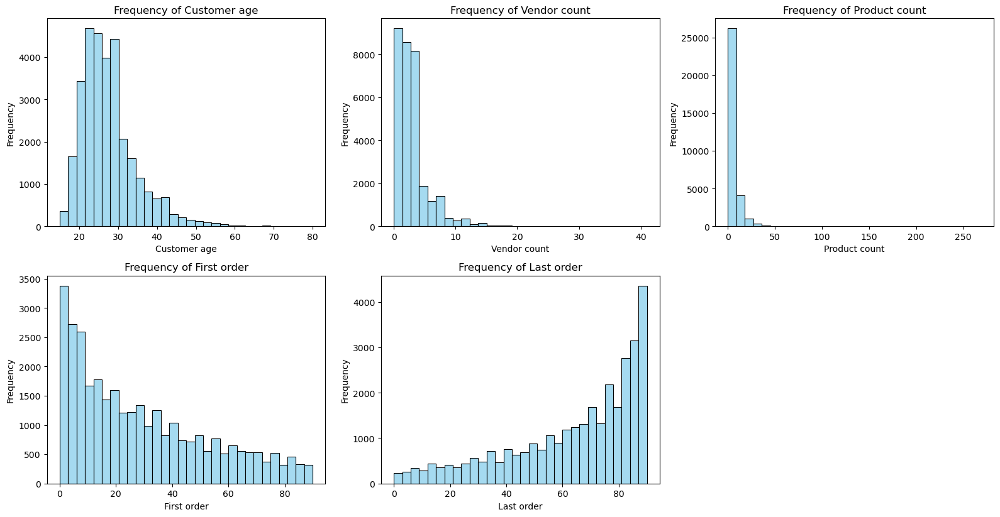

In [12]:
variables = ['customer_age', 'vendor_count', 'product_count', 'first_order', 'last_order']
plt.figure(figsize=(16, 12))

for idx, var in enumerate(variables):
    plt.subplot(3, 3, idx + 1)
    sns.histplot(df[var].dropna(), bins=30, kde=False, color='skyblue')
    plt.title(f'Frequency of {var.replace("_", " ").capitalize()}')
    plt.xlabel(var.replace('_', ' ').capitalize())
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

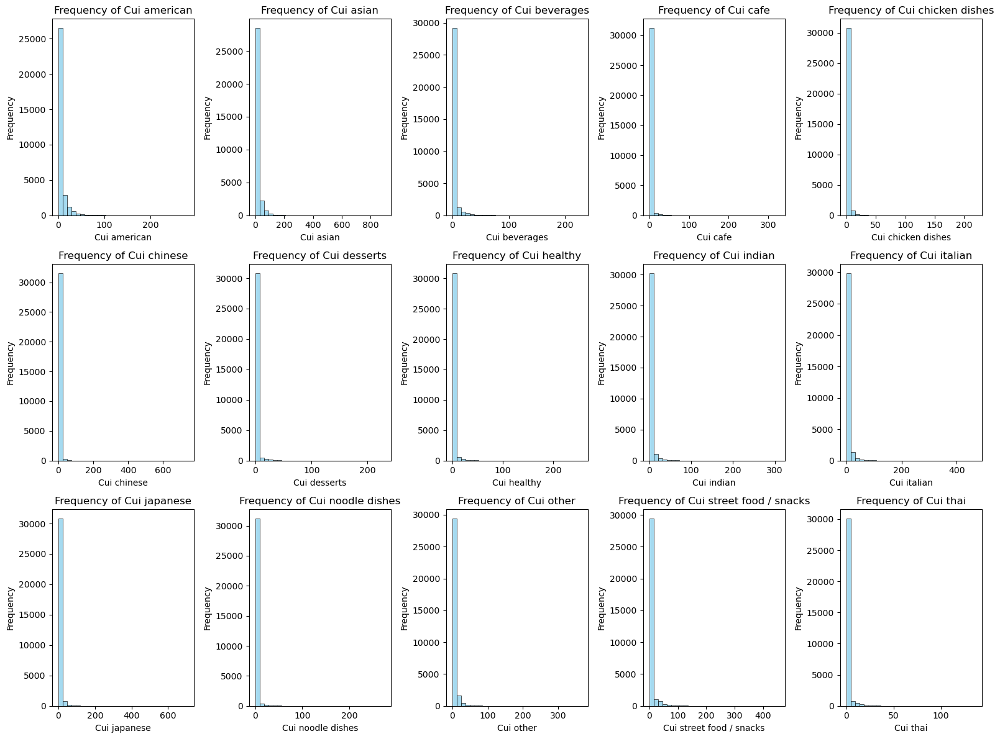

In [13]:
plt.figure(figsize=(16, 12))

for idx, var in enumerate(cui_columns):
    plt.subplot(3, 5, idx + 1)
    sns.histplot(df[var].dropna(), bins=30, kde=False, color='skyblue')
    plt.title(f'Frequency of {var.replace("_", " ").capitalize()}')
    plt.xlabel(var.replace('_', ' ').capitalize())
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

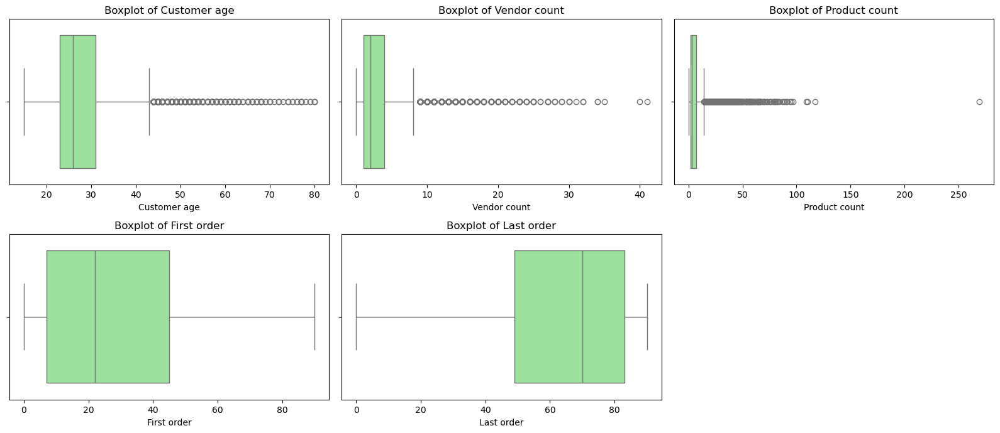

In [14]:
plt.figure(figsize=(16, 10))

for idx, var in enumerate(variables):
    plt.subplot(3, 3, idx + 1)
    sns.boxplot(x=df[var], color='lightgreen')
    plt.title(f'Boxplot of {var.replace("_", " ").capitalize()}')
    plt.xlabel(var.replace('_', ' ').capitalize())

plt.tight_layout()
plt.show()                                

### Categorical variables graphics

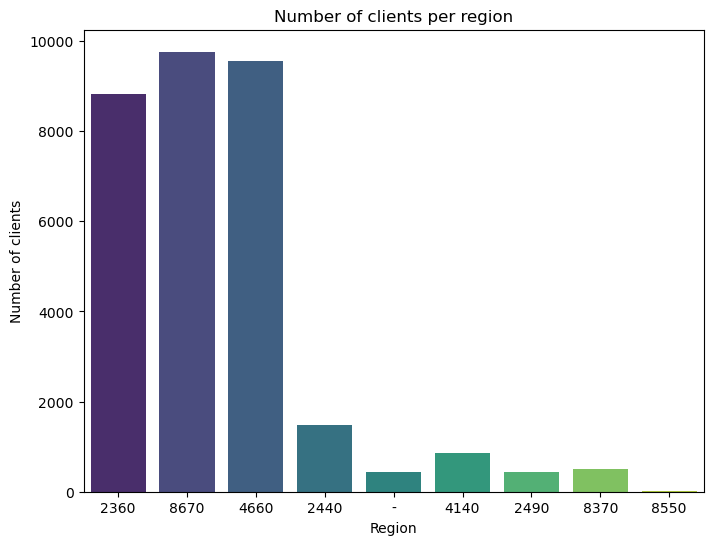

In [15]:
plt.figure(figsize=(8, 6))
sns.countplot(x='customer_region', data=df, hue='customer_region', palette='viridis', legend=False)
plt.title('Number of clients per region')
plt.xlabel('Region')
plt.ylabel('Number of clients')
plt.show()

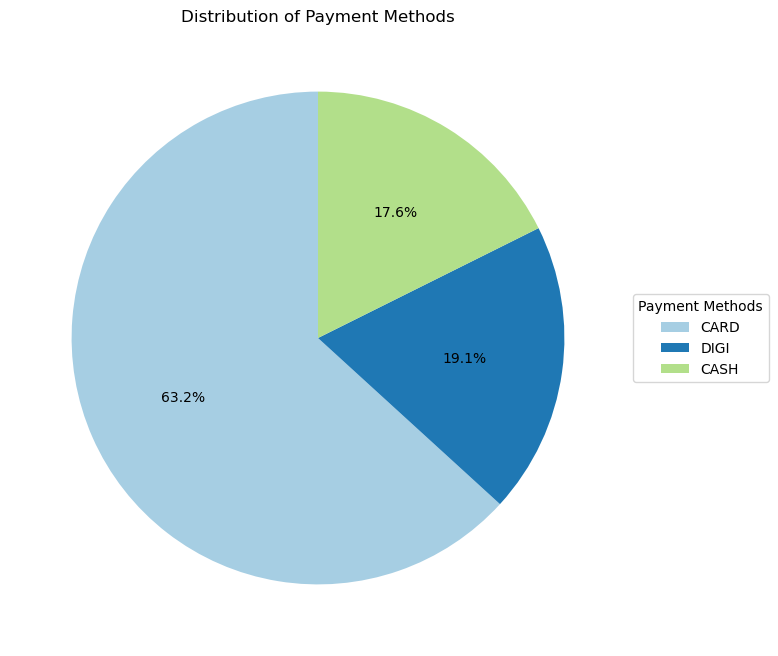

In [16]:
payment_counts = df['payment_method'].value_counts()

# Plot a pie chart
plt.figure(figsize=(8, 8), facecolor='white')
plt.pie(payment_counts, labels=None, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.legend(payment_counts.index, title="Payment Methods", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('Distribution of Payment Methods')
plt.show()

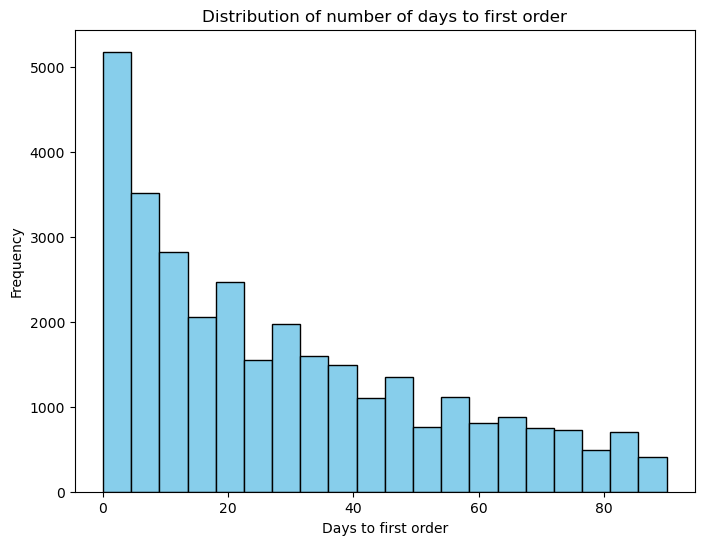

In [17]:
plt.figure(figsize=(8, 6))
plt.hist(df['first_order'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of number of days to first order')
plt.xlabel('Days to first order')
plt.ylabel('Frequency')
plt.show()

### CUI Graphics

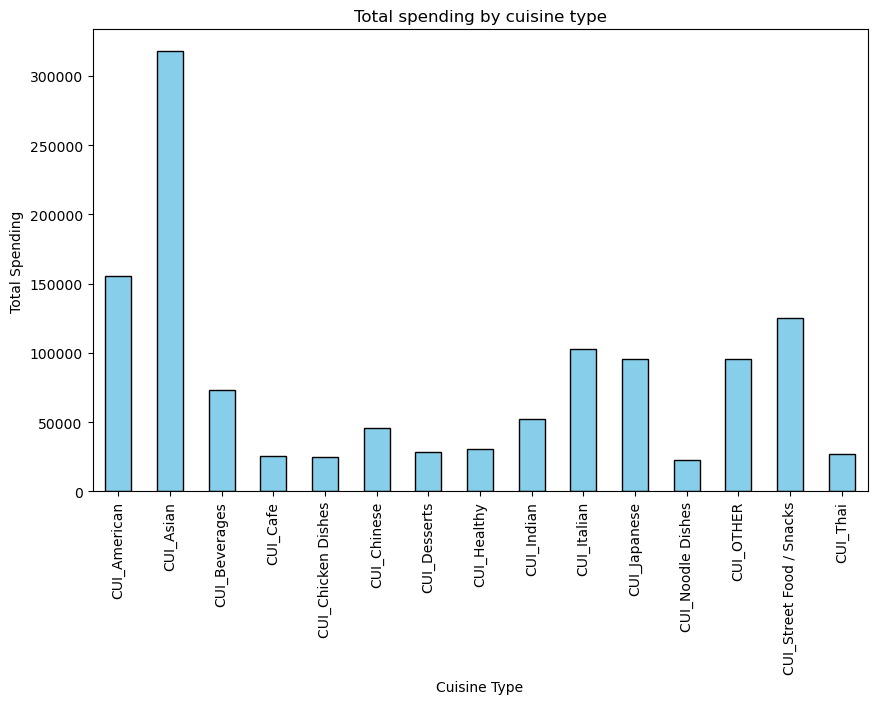

In [18]:
sum_spend = df[cui_columns].sum()

plt.figure(figsize=(10, 6))
sum_spend.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Total spending by cuisine type')
plt.xlabel('Cuisine Type')
plt.ylabel('Total Spending')
plt.show()

### DOW Graphics

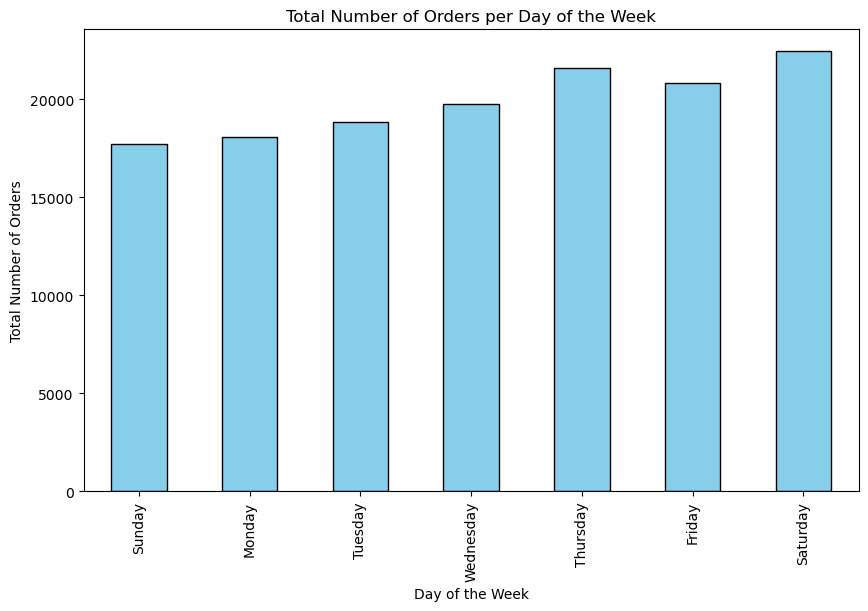

In [19]:
total_orders_per_day = df[dow_columns].sum()

plt.figure(figsize=(10, 6))
total_orders_per_day.index = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']  # Rename index for clarity
total_orders_per_day.plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Day of the Week')
plt.ylabel('Total Number of Orders')
plt.title('Total Number of Orders per Day of the Week')
plt.show()


### HR Graphics

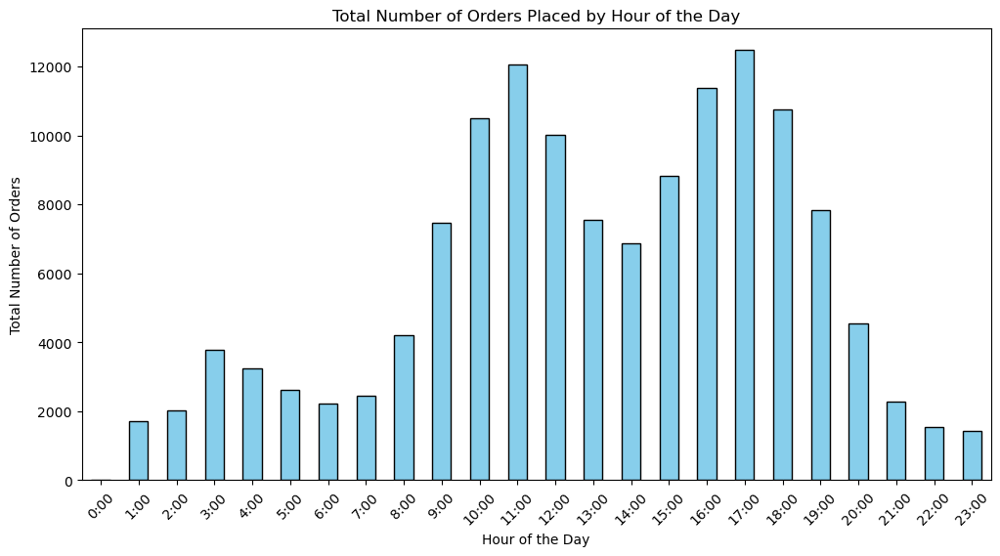

In [20]:
total_orders_per_hour = df[hr_columns].sum()

plt.figure(figsize=(12, 6))
total_orders_per_hour.plot(kind='bar', color='skyblue', edgecolor='black')
plt.xticks(ticks=range(24), labels=[f'{i}:00' for i in range(24)], rotation=45)
plt.xlabel('Hour of the Day')
plt.ylabel('Total Number of Orders')
plt.title('Total Number of Orders Placed by Hour of the Day')
plt.show()


### Correlation Heat Map

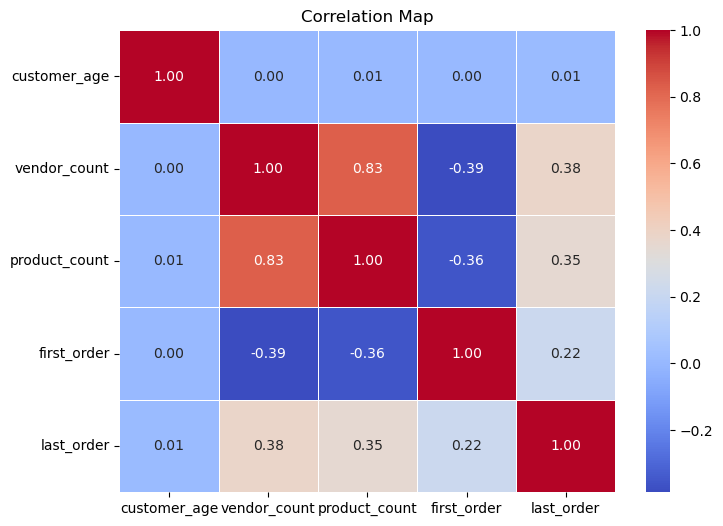

In [21]:

cols_map = ['customer_age', 'vendor_count', 'product_count', 'first_order', 'last_order']
correlation_matrix = df[cols_map].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Correlation Map')
plt.show()


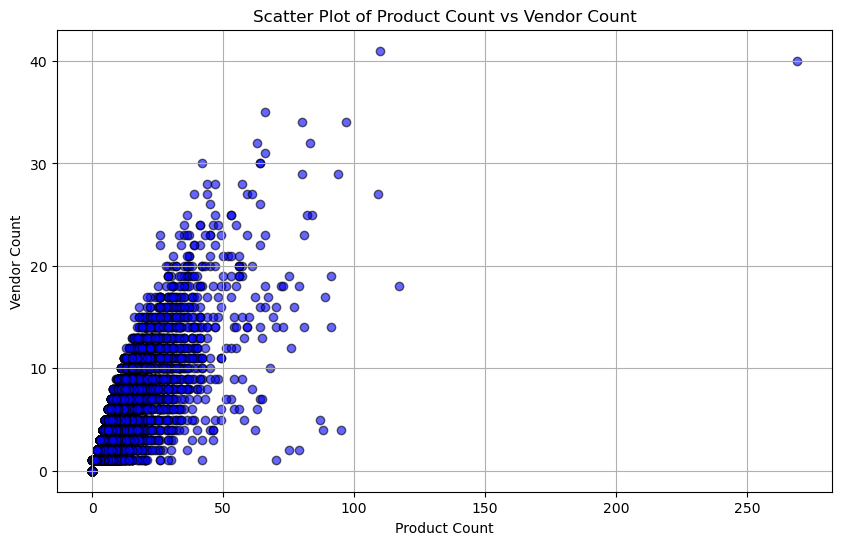

In [22]:
plt.figure(figsize=(10, 6))
plt.scatter(df['product_count'], df['vendor_count'], alpha=0.6, color='blue', edgecolor='black')
plt.title('Scatter Plot of Product Count vs Vendor Count')
plt.xlabel('Product Count')
plt.ylabel('Vendor Count')
plt.grid(True)
plt.show()

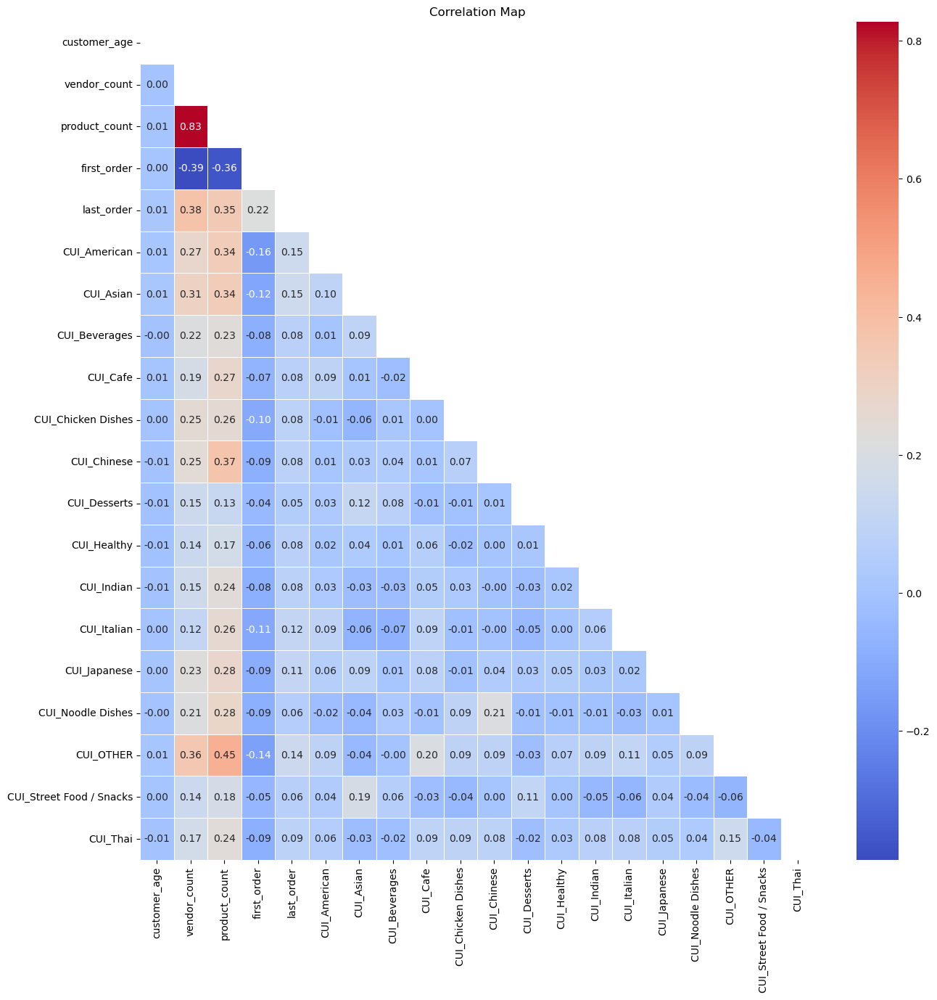

In [23]:
correlation_matrix = df[cols_map+cui_columns].corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
plt.figure(figsize=(15,15))
sns.heatmap(correlation_matrix,mask=mask, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Correlation Map')
plt.show()

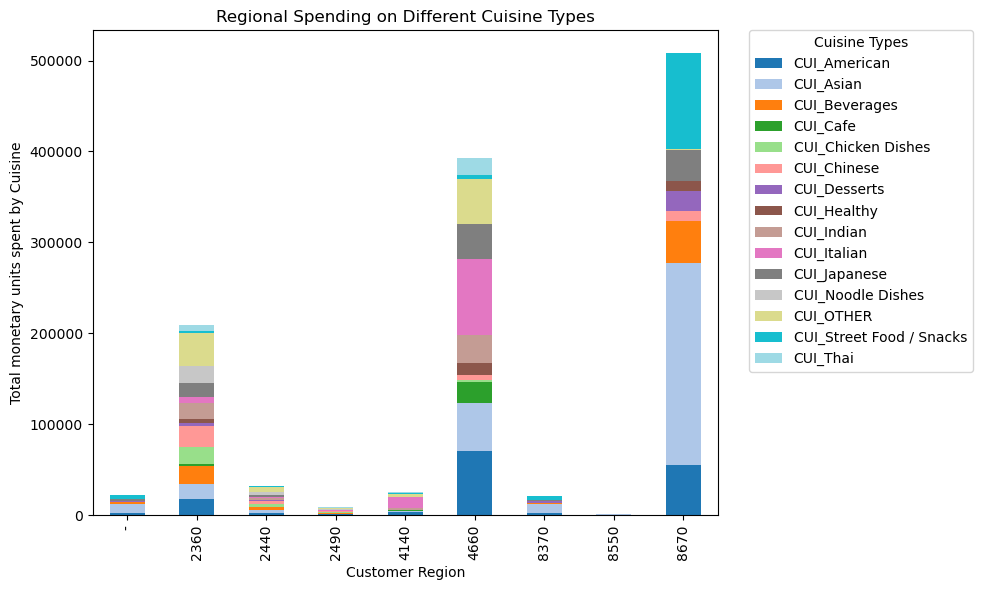

In [24]:
data_CUI = df.groupby('customer_region')[cui_columns].sum()

data_CUI.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20') #we use tab20 to be able to easily visualize each variable
plt.title("Regional Spending on Different Cuisine Types")
plt.xlabel("Customer Region")
plt.ylabel("Total monetary units spent by Cuisine")
plt.legend(title="Cuisine Types",bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

# Missing Values

In [25]:
df.isna().sum()

customer_id                    0
customer_region                0
customer_age                 727
vendor_count                   0
product_count                  0
is_chain                       0
first_order                  106
last_order                     0
last_promo                     0
payment_method                 0
CUI_American                   0
CUI_Asian                      0
CUI_Beverages                  0
CUI_Cafe                       0
CUI_Chicken Dishes             0
CUI_Chinese                    0
CUI_Desserts                   0
CUI_Healthy                    0
CUI_Indian                     0
CUI_Italian                    0
CUI_Japanese                   0
CUI_Noodle Dishes              0
CUI_OTHER                      0
CUI_Street Food / Snacks       0
CUI_Thai                       0
DOW_0                          0
DOW_1                          0
DOW_2                          0
DOW_3                          0
DOW_4                          0
DOW_5     

In [26]:
df[df['customer_age'].isna()]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,...,1,0,0,0,0,0,0,0,0,0
27,8e8652bdc8,4660,NaN,2,3,2,0.0,6,DISCOUNT,DIGI,...,0,2,0,0,0,0,0,0,0,0
37,6137fa5620,8670,NaN,2,2,2,0.0,8,DISCOUNT,CARD,...,1,0,0,0,0,0,0,0,0,0
69,2a90e9da84,4660,NaN,2,2,1,0.0,17,-,CARD,...,0,1,0,0,0,1,0,0,0,0
73,a67d3108cb,8670,NaN,2,2,1,0.0,17,-,CARD,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31488,46aa9dfeb0,8670,NaN,1,2,0,87.0,87,DELIVERY,DIGI,...,0,0,0,0,0,0,0,0,0,0
31572,29207a92c8,2360,NaN,1,1,1,88.0,88,-,CASH,...,0,0,0,0,0,0,0,0,0,0
31762,d7bf721199,2360,NaN,1,1,1,89.0,89,-,DIGI,...,1,0,0,0,0,0,0,0,0,0
31877,ee49f4eb0a,2440,NaN,1,1,1,NaN,0,DELIVERY,CARD,...,0,0,0,1,0,0,0,0,0,0


In [27]:
df[df['first_order'].isna()]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31782,0366fbb035,8670,24.0,1,1,0,NaN,0,-,DIGI,...,0,0,0,0,0,0,0,0,0,0
31783,039d7c8a20,4660,23.0,1,1,0,NaN,0,DELIVERY,DIGI,...,0,0,1,0,0,0,0,0,0,0
31784,04c9d25c93,8670,27.0,1,1,1,NaN,0,DISCOUNT,CASH,...,0,0,0,0,0,0,0,0,0,0
31785,09118ae9e7,8670,36.0,1,1,0,NaN,0,-,CARD,...,0,0,0,0,0,0,0,0,0,0
31786,0d1f298bbd,4660,22.0,1,1,1,NaN,0,DISCOUNT,CASH,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31883,f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,...,0,0,0,0,0,0,0,0,0,0
31884,f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,...,0,0,1,0,0,0,0,0,0,0
31885,f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,...,0,0,0,0,0,0,0,0,0,0
31886,f7b19c0241,8670,34.0,1,1,0,NaN,0,DISCOUNT,DIGI,...,0,0,0,0,0,0,0,0,0,0


In [28]:
#are Nan first_order rows of people who never ordered anything?
df[df['first_order'].isna() & (df['product_count'] == 0)]


,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23


In [29]:
#It's weird that there are people with a product_count of 0 but a first_order registered
df[df['product_count'] == 0 & (df['first_order'] >= 0)]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
1449,4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,...,0,0,0,0,0,0,0,0,0,0
1476,c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,...,0,0,0,0,0,0,0,0,0,0
1488,f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,...,0,0,0,0,0,0,0,0,0,0
2486,c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,...,0,0,0,0,0,0,0,0,0,0
3391,1b7c34738e,8670,24.0,0,0,0,3.0,3,-,CASH,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31553,0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,...,0,0,0,0,0,0,0,0,0,0
31667,0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,...,0,0,0,0,0,0,0,0,0,0
31680,28ed1f1e3f,8670,20.0,0,0,0,89.0,89,DELIVERY,DIGI,...,0,0,0,0,0,0,0,0,0,0
31695,4c06e104de,8670,25.0,0,0,1,89.0,89,-,CASH,...,0,0,0,0,0,0,0,0,0,0


# Duplicated Values

In [30]:
df[df.duplicated(keep=False)]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
3355,b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,...,0,0,0,0,0,0,0,0,0,0
3379,b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,...,0,0,0,0,0,0,0,0,0,0
7867,24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,...,0,1,0,1,0,0,0,0,0,0
7887,24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,...,0,1,0,1,0,0,0,0,0,0
16227,671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,...,0,0,0,1,0,1,0,0,0,0
16230,671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,...,0,0,0,1,0,1,0,0,0,0
20855,742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,...,0,0,0,0,0,0,0,0,0,0
20907,742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,...,0,0,0,0,0,0,0,0,0,0
24328,df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,...,0,0,0,0,0,0,0,0,0,0
24329,df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,...,0,0,0,0,0,0,0,0,0,0


# New features

In [31]:
#Number of days since costumers last order
df['recency'] = df['last_order'].max()- df['last_order']

In [32]:
# Sum the values across the DOW columns to get total orders per client
df['total_orders'] = df[dow_columns].sum(axis=1)

In [33]:
# Sum the values across the CUI columns to get total spent per client
df['total_spent'] = df[cui_columns].sum(axis=1)

In [34]:
#Average spent per order per client
df['avg_per_order'] = df['total_spent'] / df['total_orders']

In [35]:
df.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,recency,total_orders,total_spent,avg_per_order
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,...,2,0,0,0,0,0,89,2,28.88,14.440
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,...,0,0,0,0,0,0,89,2,19.21,9.605
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,...,0,0,0,0,0,0,89,2,9.20,4.600
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,...,0,0,0,0,0,0,88,2,31.56,15.780
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,...,0,0,0,0,0,0,88,2,55.44,27.720


## Graphical representation of new features

## Recency

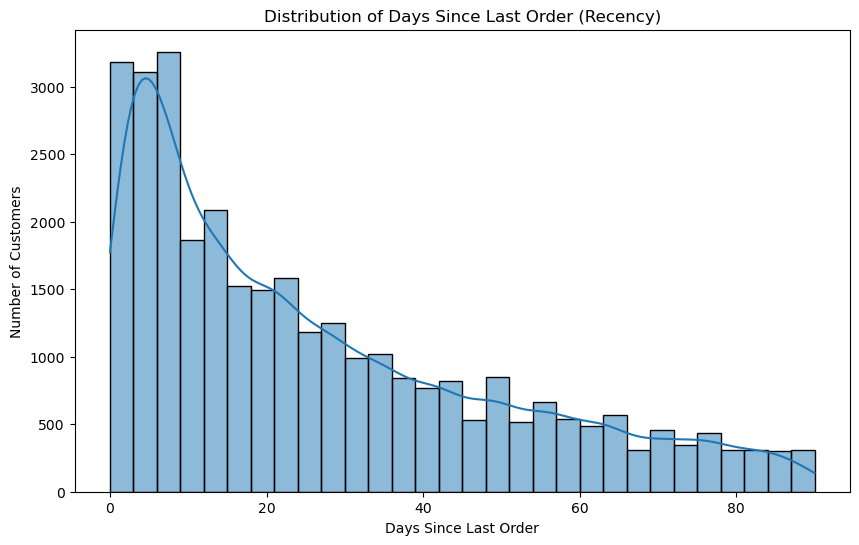

In [36]:
plt.figure(figsize=(10, 6))
sns.histplot(df['recency'], bins=30, kde=True)
plt.title("Distribution of Days Since Last Order (Recency)")
plt.xlabel("Days Since Last Order")
plt.ylabel("Number of Customers")
plt.show()

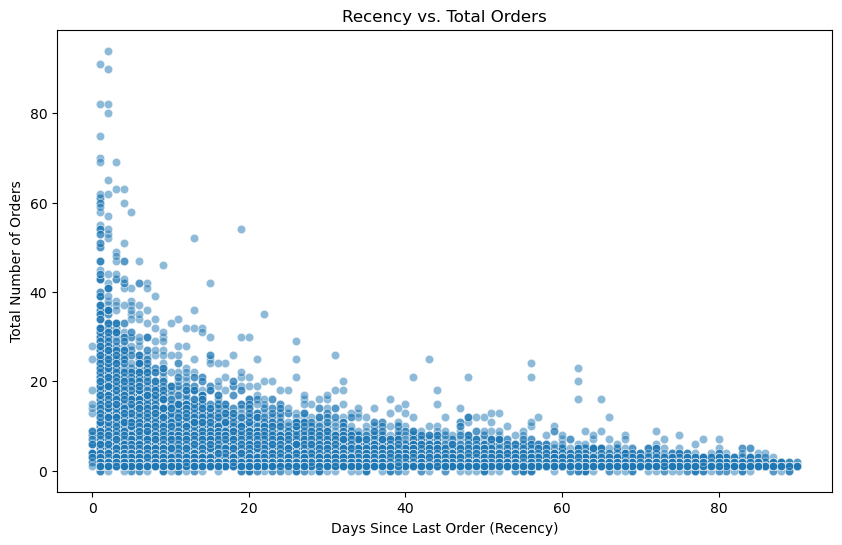

In [37]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='recency', y='total_orders', data=df, alpha=0.5)
plt.title("Recency vs. Total Orders")
plt.xlabel("Days Since Last Order (Recency)")
plt.ylabel("Total Number of Orders")
plt.show()

This could help reveal if recent customers are more frequent buyers. Clusters could indicate groups of similar purchasing behavior.

## Average spend per order

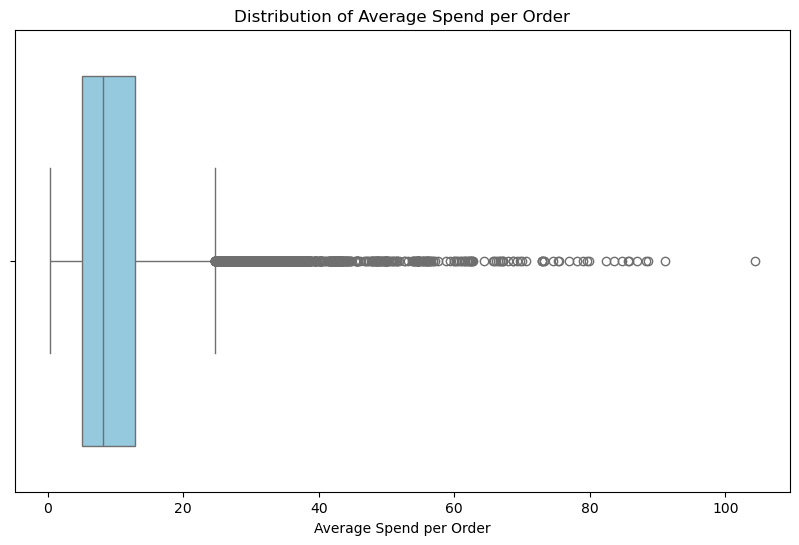

In [38]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['avg_per_order'], color='skyblue')
plt.title("Distribution of Average Spend per Order")
plt.xlabel("Average Spend per Order")
plt.show()

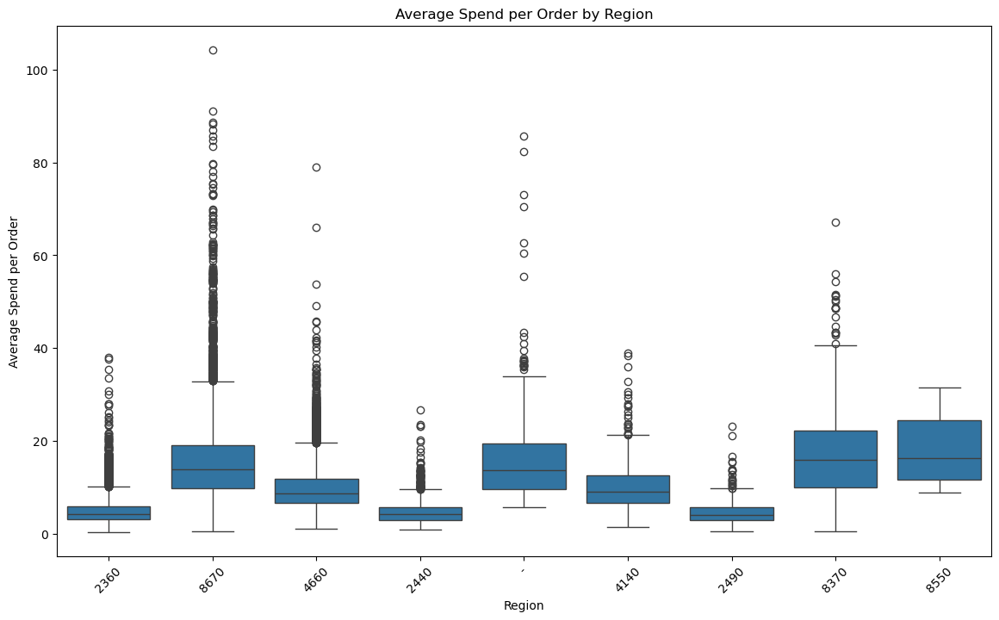

In [39]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='customer_region', y='avg_per_order', data=df)
plt.title("Average Spend per Order by Region")
plt.xlabel("Region")
plt.ylabel("Average Spend per Order")
plt.xticks(rotation=45)
plt.show()

## Total Money Spent

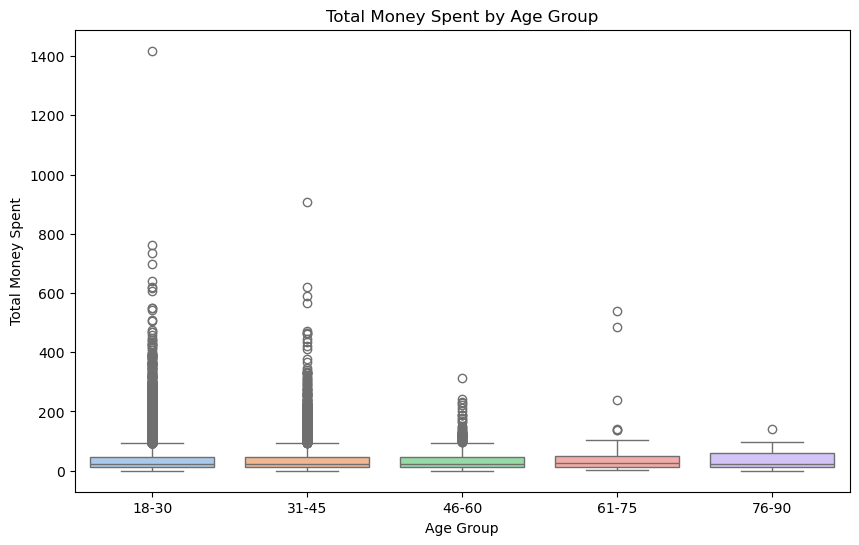

In [40]:
df['age_group'] = pd.cut(df['customer_age'], bins=[18, 30, 45, 60, 75, 90], labels=['18-30', '31-45', '46-60', '61-75', '76-90'])

plt.figure(figsize=(10, 6))
sns.boxplot(x='age_group', y='total_spent',data=df, palette='pastel')
plt.title("Total Money Spent by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Total Money Spent")
plt.show()

## Total Orders

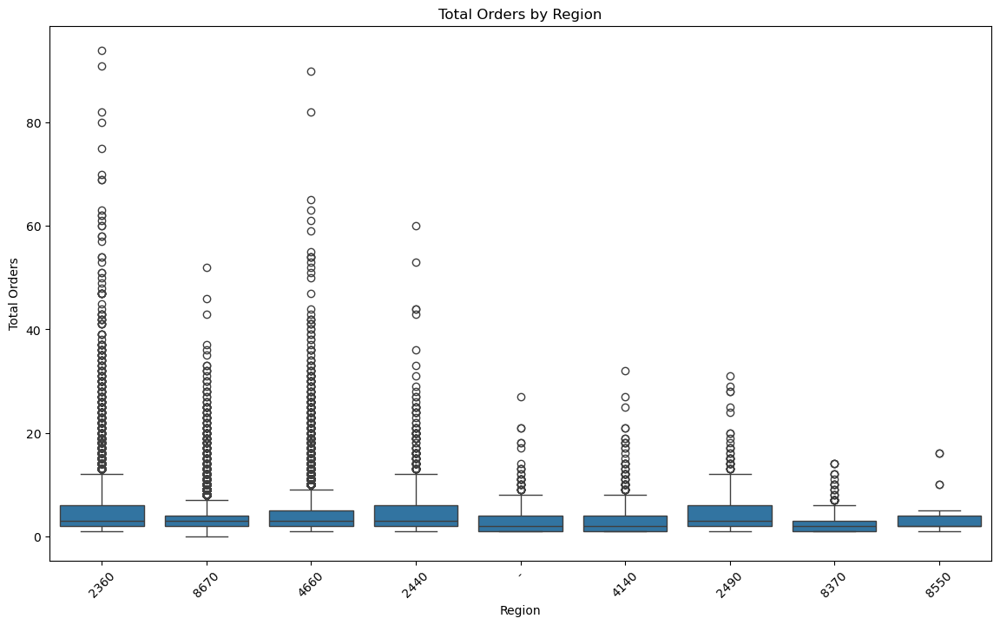

In [41]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='customer_region', y='total_orders', data=df)
plt.title("Total Orders by Region")
plt.xlabel("Region")
plt.ylabel("Total Orders")
plt.xticks(rotation=45)
plt.show()

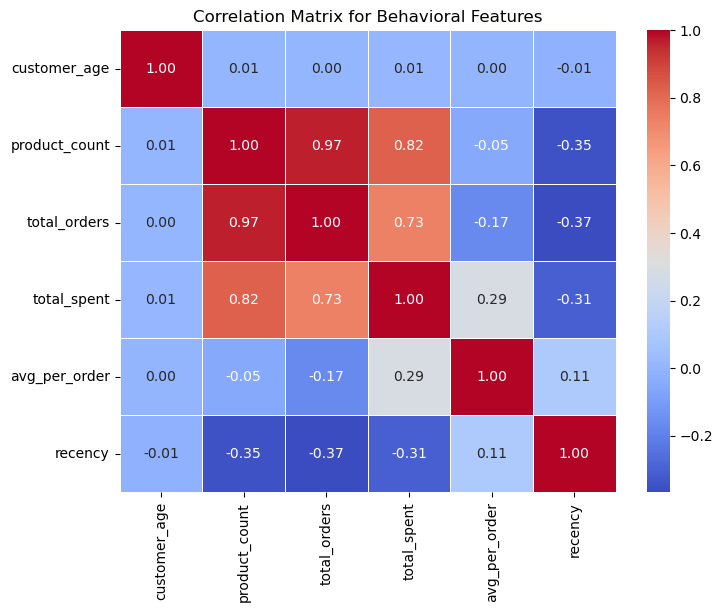

In [42]:
#Selecting columns relevant to customer behavior
behavior_columns = ['customer_age', 'product_count','total_orders', 'total_spent', 'avg_per_order', 'recency']
behavior_corr = df[behavior_columns].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(behavior_corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Matrix for Behavioral Features")
plt.yticks(rotation=0)
plt.show()

# Data Pre-processing

## Duplicates

In [43]:
# See the rows that have duplicated values and their duplicates
df[df.duplicated(keep=False)]

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_19,HR_20,HR_21,HR_22,HR_23,recency,total_orders,total_spent,avg_per_order,age_group
3355,b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,...,0,0,0,0,0,1,10,93.43,9.343000,18-30
3379,b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,...,0,0,0,0,0,1,10,93.43,9.343000,18-30
7867,24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,...,0,0,0,0,0,5,5,81.25,16.250000,18-30
7887,24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,...,0,0,0,0,0,5,5,81.25,16.250000,18-30
16227,671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,...,1,0,0,0,0,24,4,86.71,21.677500,18-30
16230,671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,...,1,0,0,0,0,24,4,86.71,21.677500,18-30
20855,742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,...,0,0,0,0,0,55,1,31.57,31.570000,18-30
20907,742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,...,0,0,0,0,0,55,1,31.57,31.570000,18-30
24328,df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,...,0,0,0,0,0,38,2,36.12,18.060000,18-30
24329,df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,...,0,0,0,0,0,38,2,36.12,18.060000,18-30


In [44]:
df.drop_duplicates(inplace = True)
df.shape

(31875, 61)

In [45]:
df.set_index('customer_id', inplace=True)

In [46]:
df.drop(columns=['age_group'], inplace=True)

## New features - parte 2 

In [47]:
# -------------------- CUI Columns --------------------
cui_columns = [col for col in df.columns if col.startswith('CUI_')]
df['favorite_cuisine'] = df[cui_columns].idxmax(axis=1)
# -------------------- DOW Columns --------------------
# Identify DOW columns
dow_columns = [col for col in df.columns if col.startswith('DOW_')]

# Aggregate Days: Weekdays and Weekends
df['weekday_orders'] = df[['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4']].sum(axis=1)
df['weekend_orders'] = df[['DOW_5', 'DOW_6']].sum(axis=1)


# Calculate Proportions: weekend_order_ratio
df['weekend_order_ratio'] = df['weekend_orders'] / (df['weekday_orders'] + df['weekend_orders'])

df['favorite_day_of_week'] = df[dow_columns].idxmax(axis=1).str.split('_').str[1].astype(int)
# -------------------- HR Columns --------------------
hr_columns = [col for col in df.columns if col.startswith('HR_')]
# Aggregate Hours: Morning, Afternoon, Evening, Night
df['morning_orders'] = df[['HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11']].sum(axis=1)
df['afternoon_orders'] = df[['HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17']].sum(axis=1)
df['evening_orders'] = df[['HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23']].sum(axis=1)
df['night_orders'] = df[['HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5']].sum(axis=1)

df['favorite_hour'] = df[hr_columns].idxmax(axis=1).str.split('_').str[1].astype(int)

After aggregating the hour-based features into broader time blocks (e.g., morning, afternoon, evening, night), 
the individual hourly features have become redundant. Therefore, we remove the single-hour features to simplify 
the dataset and avoid redundancy.

In [48]:
# Remove single hour features
df.drop(columns=hr_columns, inplace=True)

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31875 entries, 1b8f824d5e to fd40d3b0e0
Data columns (total 45 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_region           31875 non-null  object 
 1   customer_age              31148 non-null  float64
 2   vendor_count              31875 non-null  int64  
 3   product_count             31875 non-null  int64  
 4   is_chain                  31875 non-null  int64  
 5   first_order               31769 non-null  float64
 6   last_order                31875 non-null  int64  
 7   last_promo                31875 non-null  object 
 8   payment_method            31875 non-null  object 
 9   CUI_American              31875 non-null  float64
 10  CUI_Asian                 31875 non-null  float64
 11  CUI_Beverages             31875 non-null  float64
 12  CUI_Cafe                  31875 non-null  float64
 13  CUI_Chicken Dishes        31875 non-null  float64
 1

In [50]:
# Defining metric and non-metric features
metric_features = [
    "customer_age", "vendor_count", "product_count", "first_order", "last_order",
    "CUI_American", "CUI_Asian", "CUI_Beverages", "CUI_Cafe", "CUI_Chicken Dishes",
    "CUI_Chinese", "CUI_Desserts", "CUI_Healthy", "CUI_Indian", "CUI_Italian",
    "CUI_Japanese", "CUI_Noodle Dishes", "CUI_OTHER", "CUI_Street Food / Snacks",
    "CUI_Thai", "DOW_0", "DOW_1", "DOW_2", "DOW_3", "DOW_4", "DOW_5", "DOW_6",
    "recency", "total_orders", "total_spent", "avg_per_order", "weekday_orders",
    "weekend_orders", "weekend_order_ratio", "morning_orders", "afternoon_orders",
    "evening_orders", "night_orders"
]

non_metric_features = [
    "customer_region", "is_chain", "last_promo", "payment_method", "favorite_cuisine",
    "favorite_day_of_week", "favorite_hour"
]


##  Incoherencies

#### `is_chain`
- Transformed into a binary column: `1` for chain vendors, `0` for non-chain vendors.

#### `last_promo`
- Replaced `"-"` with `"NO_PROMO"` to indicate no promotion was used.

In [51]:
df['is_chain'] = df['is_chain'].apply(lambda x: 1 if x > 0 else 0)

In [52]:
# Replace "-" in last_promo with "NO_PROMO"
df['last_promo'] = df['last_promo'].replace("-", "NO_PROMO")


## Missing Values

In [53]:
df.isnull().sum()

customer_region               0
customer_age                727
vendor_count                  0
product_count                 0
is_chain                      0
first_order                 106
last_order                    0
last_promo                    0
payment_method                0
CUI_American                  0
CUI_Asian                     0
CUI_Beverages                 0
CUI_Cafe                      0
CUI_Chicken Dishes            0
CUI_Chinese                   0
CUI_Desserts                  0
CUI_Healthy                   0
CUI_Indian                    0
CUI_Italian                   0
CUI_Japanese                  0
CUI_Noodle Dishes             0
CUI_OTHER                     0
CUI_Street Food / Snacks      0
CUI_Thai                      0
DOW_0                         0
DOW_1                         0
DOW_2                         0
DOW_3                         0
DOW_4                         0
DOW_5                         0
DOW_6                         0
recency 

### Customer Age

In [54]:
df[df['customer_age'] == 0]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,favorite_cuisine,weekday_orders,weekend_orders,weekend_order_ratio,favorite_day_of_week,morning_orders,afternoon_orders,evening_orders,night_orders,favorite_hour
customer_id,,,,,,,,,,,,,,,,,,,,,


Using Median Imputation

In [55]:
median_age = df['customer_age'].median()
df['customer_age'] = df['customer_age'].fillna(median_age).astype(int) #customer_age is now int


### First Order

In [56]:
df[df['first_order']==0]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,favorite_cuisine,weekday_orders,weekend_orders,weekend_order_ratio,favorite_day_of_week,morning_orders,afternoon_orders,evening_orders,night_orders,favorite_hour
customer_id,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18,2,5,1,0.0,1,DELIVERY,DIGI,0.00,...,CUI_Indian,1,1,0.500000,0,0,0,2,0.0,18
5d272b9dcb,8670,17,2,2,1,0.0,1,DISCOUNT,DIGI,12.82,...,CUI_American,1,1,0.500000,0,2,0,0,0.0,10
f6d1b2ba63,4660,38,1,2,1,0.0,1,DISCOUNT,CASH,9.20,...,CUI_American,1,1,0.500000,0,2,0,0,0.0,9
180c632ed8,4660,26,2,3,1,0.0,2,DELIVERY,DIGI,0.00,...,CUI_Indian,1,1,0.500000,1,1,1,0,0.0,11
4eb37a6705,4660,20,2,5,0,0.0,2,NO_PROMO,DIGI,14.57,...,CUI_Asian,1,1,0.500000,1,2,0,0,0.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f600f77c7a,2360,28,12,40,1,0.0,89,DELIVERY,CASH,4.96,...,CUI_Thai,13,14,0.518519,6,14,4,9,0.0,9
fbdcb1dbb8,4660,26,5,47,1,0.0,89,NO_PROMO,CASH,81.49,...,CUI_Asian,36,4,0.100000,4,28,11,1,0.0,10
fcceaa9613,4660,23,9,19,1,0.0,89,NO_PROMO,CARD,0.00,...,CUI_Italian,10,6,0.375000,6,3,8,5,0.0,17


Dropping rows with missing values

In [57]:
df = df.dropna(subset=['first_order'])


In [58]:
df.isnull().sum()

customer_region               0
customer_age                  0
vendor_count                  0
product_count                 0
is_chain                      0
first_order                   0
last_order                    0
last_promo                    0
payment_method                0
CUI_American                  0
CUI_Asian                     0
CUI_Beverages                 0
CUI_Cafe                      0
CUI_Chicken Dishes            0
CUI_Chinese                   0
CUI_Desserts                  0
CUI_Healthy                   0
CUI_Indian                    0
CUI_Italian                   0
CUI_Japanese                  0
CUI_Noodle Dishes             0
CUI_OTHER                     0
CUI_Street Food / Snacks      0
CUI_Thai                      0
DOW_0                         0
DOW_1                         0
DOW_2                         0
DOW_3                         0
DOW_4                         0
DOW_5                         0
DOW_6                         0
recency 

### Weekend order ratio and Average per order

In [59]:
df = df.dropna(subset=['avg_per_order'])

In [60]:
df.isnull().sum()

customer_region             0
customer_age                0
vendor_count                0
product_count               0
is_chain                    0
first_order                 0
last_order                  0
last_promo                  0
payment_method              0
CUI_American                0
CUI_Asian                   0
CUI_Beverages               0
CUI_Cafe                    0
CUI_Chicken Dishes          0
CUI_Chinese                 0
CUI_Desserts                0
CUI_Healthy                 0
CUI_Indian                  0
CUI_Italian                 0
CUI_Japanese                0
CUI_Noodle Dishes           0
CUI_OTHER                   0
CUI_Street Food / Snacks    0
CUI_Thai                    0
DOW_0                       0
DOW_1                       0
DOW_2                       0
DOW_3                       0
DOW_4                       0
DOW_5                       0
DOW_6                       0
recency                     0
total_orders                0
total_spen

## Outliers

In [61]:
df_outliers = df.copy()
df_outliers = df_outliers.select_dtypes(exclude=['object'])


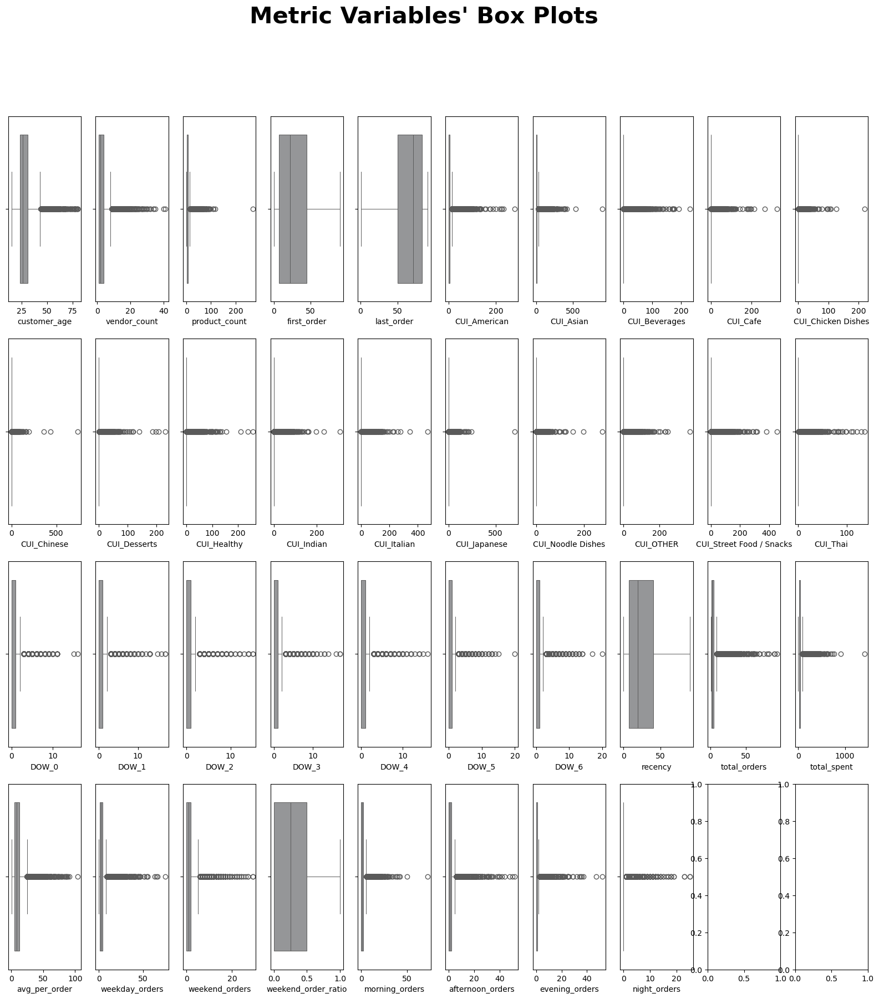

In [62]:
#All Metric Variables' Box Plots in one figure

#Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20,20))
                                      
#Iterate across axes objects and associate each box plot:
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df[feat], ax=ax, color="#949698", linewidth=0.7)

plt.suptitle("Metric Variables' Box Plots", size = 30, fontweight="bold")
plt.show()

In [63]:
df['vendor_count'].describe()

count    31631.000000
mean         3.123234
std          2.772155
min          1.000000
25%          1.000000
50%          2.000000
75%          4.000000
max         41.000000
Name: vendor_count, dtype: float64

### IQR

The Inter Quartile Range (IQR) Method sets up a "fence" outside of quartiles 1 and 3, and any values that fall outside these values are considered outliers. Then, these observations that are outside the box are deleted from the dataset.

Adapted from: https://online.stat.psu.edu/stat200/lesson/3/3.2

In [64]:
# Defining the quantiles range

q25 = df_outliers.quantile(.25)
q75 = df_outliers.quantile(.75)
iqr = (q75 - q25)

# Defining the upper and lower limit

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

# Applying the filters created

filters_1 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters_1.append(df_outliers[metric].between(llim, ulim, inclusive='both'))

# Converting the filters to a pandas series, and applying them to a new dataframe

filters_1 = pd.Series(np.all(filters_1, 0), index = df.index)
df_outliers_IQR = df_outliers[filters_1]

# See the percentage of data kept

print("Percentage of data kept after removing outliers:", np.round(df_outliers_IQR.shape[0] / df_outliers.shape[0] * 100, 2), "%")

Percentage of data kept after removing outliers: 6.75 %


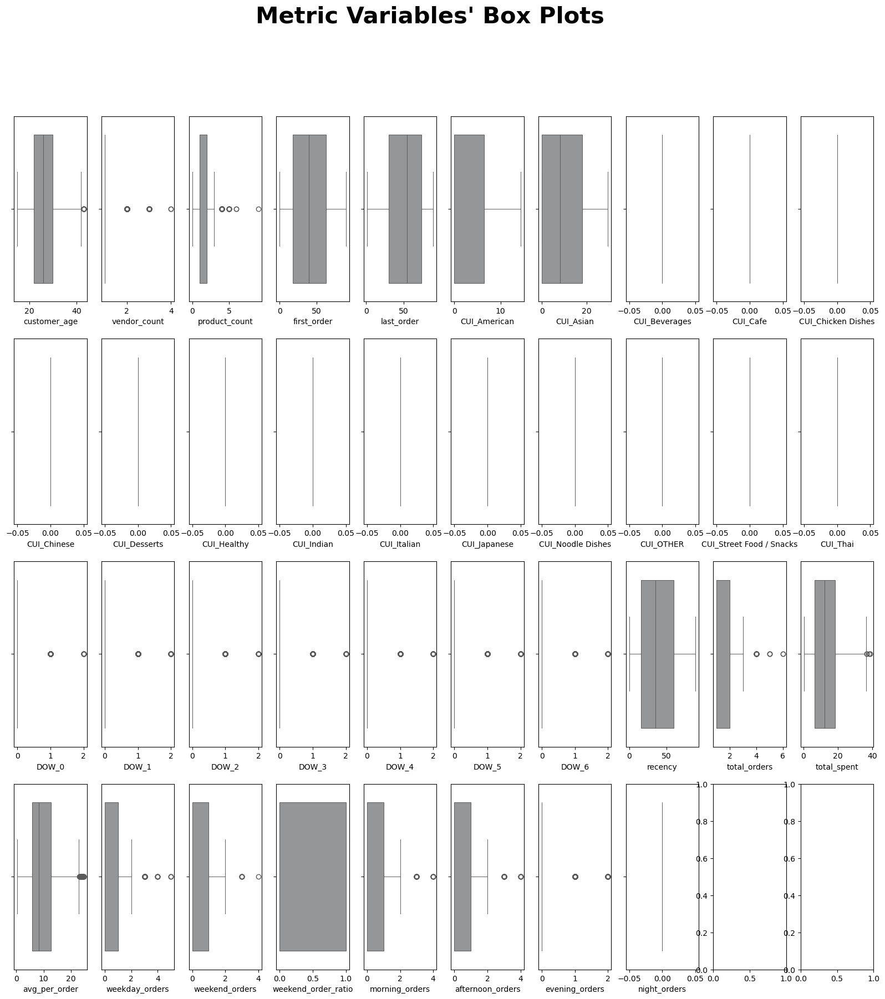

In [65]:
# All Metric Variables' Box Plots in one figure

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20,20))
                                      
# Iterate across axes objects and associate each box plot:
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_outliers_IQR[feat], ax=ax, color="#949698", linewidth=0.7)

plt.suptitle("Metric Variables' Box Plots", size = 30, fontweight='bold')
plt.show()

### Manual Filtering

In [66]:
# Define filters for manual outlier removal
filters = (
    (df_outliers["total_spent"] <= df_outliers["total_spent"].quantile(0.95))  # 95th percentile cap
    # Realistic maximum number of unique vendors per customer
    & (df_outliers["vendor_count"] <= 38)  # Upper threshold for vendor count
    # Cap for the number of products ordered
    & (df_outliers["product_count"] <= 200)  # Upper limit for product count
    # Cap for spending on each cuisine category (set an upper limit for extreme cuisine spenders)
    & (df_outliers["CUI_American"] <= 200)  
    & (df_outliers["CUI_Asian"] <= 500)  
    &(df_outliers["CUI_Beverages"] <= 200) 
    &(df_outliers["CUI_Cafe"] <= 210) 
    &(df_outliers["CUI_Chicken Dishes"] <= 200) 
    &(df_outliers["CUI_Chinese"] <= 500) 
    &(df_outliers["CUI_Desserts"] <= 200) 
    &(df_outliers["CUI_Healthy"] <= 200) 
    &(df_outliers["CUI_Indian"] <= 250) 
    &(df_outliers["CUI_Italian"] <= 400) 
    &(df_outliers["CUI_Japanese"] <= 500) 
    &(df_outliers["CUI_Noodle Dishes"] <= 200) 
    &(df_outliers["CUI_OTHER"] <= 300) 
    &(df_outliers["CUI_Street Food / Snacks"] <= 300) 
    &(df_outliers["CUI_Thai"] <= 130) &

    (df_outliers["total_orders"] <= 60) &
    (df_outliers["avg_per_order"] <= 100) &
    (df_outliers["weekday_orders"] <= 70) &
    (df_outliers["weekend_orders"] <= 29) &
    (df_outliers["morning_orders"] <= 50) &
    (df_outliers["afternoon_orders"] <= 50) &
    (df_outliers["evening_orders"] <= 40) &
    (df_outliers["night_orders"] <= 20) 
)

# Apply the filters to remove outliers
df_manual_filtering = df_outliers[filters]

# Calculate the percentage of data retained after filtering
percentage_retained = (df_manual_filtering.shape[0] / df_outliers.shape[0]) * 100
print(f"Percentage of data kept after removing outliers: {percentage_retained:.2f}%")


Percentage of data kept after removing outliers: 94.99%


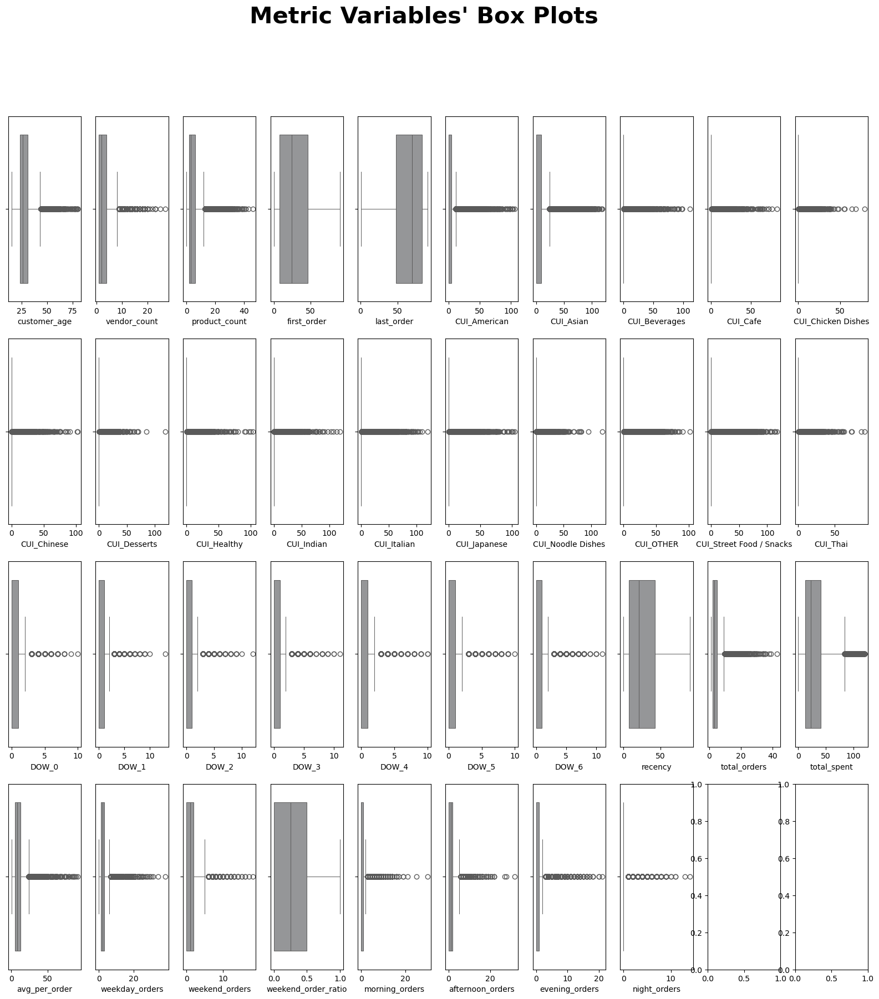

In [67]:
# All Metric Variables' Box Plots in one figure

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20,20))
                                      
# Iterate across axes objects and associate each box plot:
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_manual_filtering[feat], ax=ax, color="#949698", linewidth=0.7)

plt.suptitle("Metric Variables' Box Plots", size = 30, fontweight='bold')
plt.show()

Although this method did not remove all outliers, the extreme ones were removed, keeping around 94.56% of the data.

In [68]:
# So, we'll keep this approach 

# Get the indices of the rows that remain in df_outliers after filtering
filtered_indices = df_manual_filtering.index


df = df.loc[filtered_indices]

## Encoding

In [69]:
df_encoded = df.copy()

In [70]:
count_encoder = ce.CountEncoder()

In [71]:
df_categorical_encoded = count_encoder.fit_transform(df_encoded[non_metric_features])
df_categorical_encoded

,customer_region,is_chain,last_promo,payment_method,favorite_cuisine,favorite_day_of_week,favorite_hour
customer_id,,,,,,,
1b8f824d5e,8635,1,6055,5833,1632,0,18
5d272b9dcb,8768,1,4286,5833,4010,0,10
f6d1b2ba63,9012,1,4286,5357,4010,0,9
180c632ed8,9012,1,6055,5833,1632,1,11
4eb37a6705,9012,0,15592,5833,6422,1,8
...,...,...,...,...,...,...,...
eb13c834e7,8635,1,6055,18857,1117,4,19
f7be3a1a84,1463,1,15592,5357,2947,4,15
fc924e1758,9012,0,6055,5357,3011,4,14


In [72]:
df_categorical_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30047 entries, 1b8f824d5e to d7c7face7e
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   customer_region       30047 non-null  int64
 1   is_chain              30047 non-null  int64
 2   last_promo            30047 non-null  int64
 3   payment_method        30047 non-null  int64
 4   favorite_cuisine      30047 non-null  int64
 5   favorite_day_of_week  30047 non-null  int32
 6   favorite_hour         30047 non-null  int32
dtypes: int32(2), int64(5)
memory usage: 1.6+ MB


In [73]:
df_encoded[non_metric_features] = df_categorical_encoded

In [74]:
# Replace categorical columns explicitly with the encoded versions
for column in df_categorical_encoded.columns:
    df[column] = df_categorical_encoded[column]

In [75]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30047 entries, 1b8f824d5e to d7c7face7e
Data columns (total 45 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_region           30047 non-null  int64  
 1   customer_age              30047 non-null  int32  
 2   vendor_count              30047 non-null  int64  
 3   product_count             30047 non-null  int64  
 4   is_chain                  30047 non-null  int64  
 5   first_order               30047 non-null  float64
 6   last_order                30047 non-null  int64  
 7   last_promo                30047 non-null  int64  
 8   payment_method            30047 non-null  int64  
 9   CUI_American              30047 non-null  float64
 10  CUI_Asian                 30047 non-null  float64
 11  CUI_Beverages             30047 non-null  float64
 12  CUI_Cafe                  30047 non-null  float64
 13  CUI_Chicken Dishes        30047 non-null  float64
 1

## Scaling

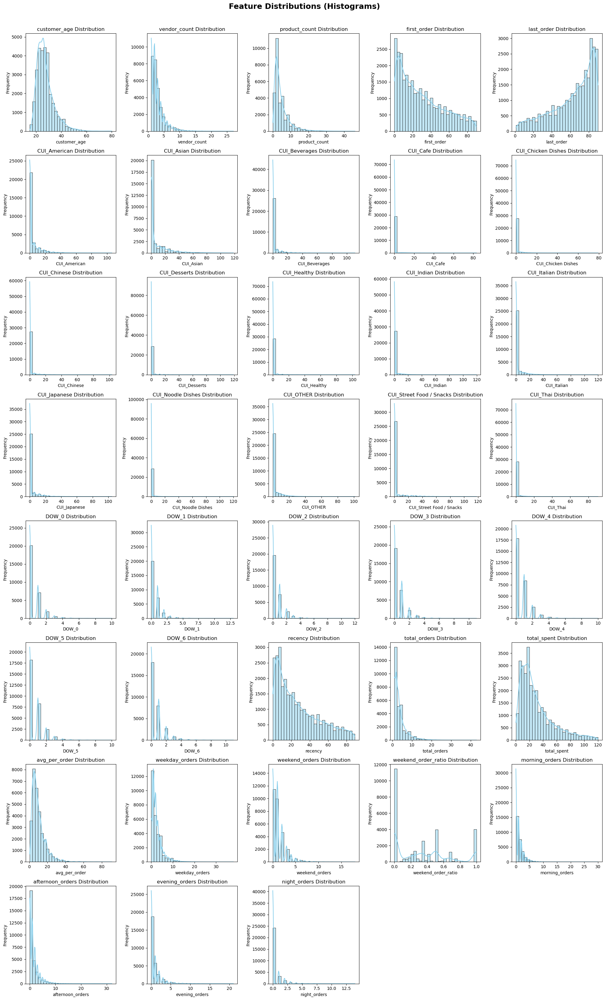

In [76]:
# Set the number of rows and columns for the subplots
n = len(metric_features)
ncols = 5  # You can adjust this depending on the number of features
nrows = np.ceil(n / ncols).astype(int)

# Create the figure and axes for the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, nrows * 4))
axes = axes.flatten()  # Flatten the axes array for easier iteration

# Plot histograms for each feature in metric_features
for i, feature in enumerate(metric_features):
    # Plot histogram, drop NaN values
    sns.histplot(df[feature].dropna(), kde=True, bins=30, ax=axes[i], color='skyblue', edgecolor='black')
    axes[i].set_title(f'{feature} Distribution', fontsize=12)
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

# Remove any extra subplots if the number of features is not a multiple of ncols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust the layout and add a title
plt.tight_layout()
plt.suptitle("Feature Distributions (Histograms)", fontsize=18, fontweight="bold", y=1.02)
plt.show()

### Min-Max Scaler

In [77]:
df_minmax = df_encoded.copy()

In [78]:
df_minmax.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_region,30047.0,7857.129664,2572.791035,12.00,8635.00,8768.00,9012.000,9012.00
customer_age,30047.0,27.448830,7.075771,15.00,23.00,26.00,31.000,80.00
vendor_count,30047.0,2.820914,2.201744,1.00,1.00,2.00,4.000,27.00
product_count,30047.0,4.727494,4.363870,0.00,2.00,3.00,6.000,46.00
is_chain,30047.0,0.803508,0.397352,0.00,1.00,1.00,1.000,1.00
first_order,30047.0,29.373881,24.133311,0.00,8.00,24.00,46.000,90.00
last_order,30047.0,63.004227,23.020140,1.00,48.00,69.00,83.000,90.00
last_promo,30047.0,10485.848204,5341.238482,4114.00,4286.00,15592.00,15592.000,15592.00
payment_method,30047.0,13921.782108,6408.349511,5357.00,5833.00,18857.00,18857.000,18857.00
CUI_American,30047.0,4.108072,9.070385,0.00,0.00,0.00,4.705,106.16


In [79]:
features_to_scale = metric_features

In [80]:
# Defining an instance for the scaler
scaler = MinMaxScaler()
# Fit the data
scaled_feat = scaler.fit_transform(df_minmax)
df_minmax = pd.DataFrame(scaled_feat, columns=df.columns)

In [81]:
# Checking maximum and minimum of 'MinMaxed' variables
df_minmax.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
customer_region,30047.0,0.87,0.29,0.0,0.96,0.97,1.00,1.0
customer_age,30047.0,0.19,0.11,0.0,0.12,0.17,0.25,1.0
vendor_count,30047.0,0.07,0.08,0.0,0.00,0.04,0.12,1.0
product_count,30047.0,0.10,0.09,0.0,0.04,0.07,0.13,1.0
is_chain,30047.0,0.80,0.40,0.0,1.00,1.00,1.00,1.0
first_order,30047.0,0.33,0.27,0.0,0.09,0.27,0.51,1.0
last_order,30047.0,0.70,0.26,0.0,0.53,0.76,0.92,1.0
last_promo,30047.0,0.56,0.47,0.0,0.01,1.00,1.00,1.0
payment_method,30047.0,0.63,0.47,0.0,0.04,1.00,1.00,1.0
CUI_American,30047.0,0.04,0.09,0.0,0.00,0.00,0.04,1.0


### Standard Scaler

In [82]:
# Create a copy of the dataset
df_standard = df_encoded.copy()

In [83]:
# Defining an instance for the scaler
scaler = StandardScaler()
# Fit the data
scaled_feat = scaler.fit_transform(df_standard)
df_standard = pd.DataFrame(scaled_feat, columns=df.columns)

In [84]:
# Checking the mean and variance of standardized variables
df_standard.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
customer_region,30047.0,-0.0,1.0,-3.05,0.30,0.35,0.45,0.45
customer_age,30047.0,0.0,1.0,-1.76,-0.63,-0.20,0.50,7.43
vendor_count,30047.0,0.0,1.0,-0.83,-0.83,-0.37,0.54,10.98
product_count,30047.0,0.0,1.0,-1.08,-0.63,-0.40,0.29,9.46
is_chain,30047.0,-0.0,1.0,-2.02,0.49,0.49,0.49,0.49
first_order,30047.0,0.0,1.0,-1.22,-0.89,-0.22,0.69,2.51
last_order,30047.0,0.0,1.0,-2.69,-0.65,0.26,0.87,1.17
last_promo,30047.0,-0.0,1.0,-1.19,-1.16,0.96,0.96,0.96
payment_method,30047.0,0.0,1.0,-1.34,-1.26,0.77,0.77,0.77
CUI_American,30047.0,-0.0,1.0,-0.45,-0.45,-0.45,0.07,11.25


### Final Insights

Since our features don't follow a normal distribution we use the MinMax Scaler since it is the most appropriate in cases like ours 

In [85]:
# Apply the chosen scaler to the dataset
df_scaled = df_minmax.copy()

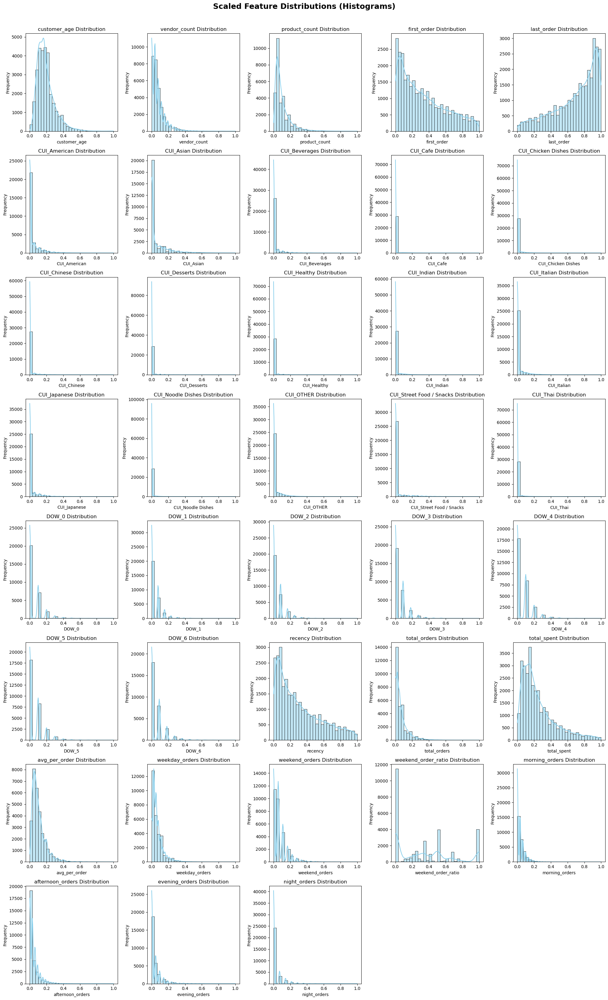

In [86]:
# Set the number of rows and columns for the subplots
n = len(metric_features)
ncols = 5  # You can adjust this depending on the number of features
nrows = np.ceil(n / ncols).astype(int)

# Create the figure and axes for the subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, nrows * 4))
axes = axes.flatten()  # Flatten the axes array for easier iteration

# Plot histograms for each feature in metric_features
for i, feature in enumerate(metric_features):
    # Plot histogram, drop NaN values
    sns.histplot(df_scaled[feature].dropna(), kde=True, bins=30, ax=axes[i], color='skyblue', edgecolor='black')
    axes[i].set_title(f'{feature} Distribution', fontsize=12)
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

# Remove any extra subplots if the number of features is not a multiple of ncols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust the layout and add a title
plt.tight_layout()
plt.suptitle("Scaled Feature Distributions (Histograms)", fontsize=18, fontweight="bold", y=1.02)
plt.show()

## Feature Selection

In [87]:
df_selection = df_scaled.copy()

In [88]:
df_selection

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,favorite_cuisine,weekday_orders,weekend_orders,weekend_order_ratio,favorite_day_of_week,morning_orders,afternoon_orders,evening_orders,night_orders,favorite_hour
0,0.958111,0.046154,0.038462,0.108696,1.0,0.000000,0.000000,0.169106,0.035259,0.000000,...,0.199933,0.026316,0.055556,0.5,0.000000,0.000000,0.00000,0.095238,0.0,0.772727
1,0.972889,0.030769,0.038462,0.043478,1.0,0.000000,0.000000,0.014985,0.035259,0.120761,...,0.597127,0.026316,0.055556,0.5,0.000000,0.066667,0.00000,0.000000,0.0,0.409091
2,1.000000,0.353846,0.000000,0.043478,1.0,0.000000,0.000000,0.014985,0.000000,0.086662,...,0.597127,0.026316,0.055556,0.5,0.000000,0.066667,0.00000,0.000000,0.0,0.363636
3,1.000000,0.169231,0.038462,0.065217,1.0,0.000000,0.011236,0.169106,0.035259,0.000000,...,0.199933,0.026316,0.055556,0.5,0.166667,0.033333,0.03125,0.000000,0.0,0.454545
4,1.000000,0.076923,0.038462,0.108696,0.0,0.000000,0.011236,1.000000,0.035259,0.137246,...,1.000000,0.026316,0.055556,0.5,0.166667,0.066667,0.00000,0.000000,0.0,0.318182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30042,0.958111,0.907692,0.000000,0.021739,1.0,0.988889,0.988764,0.169106,1.000000,0.000000,...,0.113913,0.026316,0.000000,0.0,0.666667,0.000000,0.00000,0.047619,0.0,0.818182
30043,0.161222,0.169231,0.000000,0.021739,1.0,0.988889,0.988764,1.000000,0.000000,0.000000,...,0.419576,0.026316,0.000000,0.0,0.666667,0.000000,0.03125,0.000000,0.0,0.636364
30044,1.000000,0.076923,0.000000,0.043478,0.0,0.988889,0.988764,0.169106,0.000000,0.000000,...,0.430266,0.026316,0.000000,0.0,0.666667,0.000000,0.03125,0.000000,0.0,0.590909
30045,1.000000,0.107692,0.000000,0.065217,1.0,0.988889,0.988764,0.014985,1.000000,0.000000,...,0.430266,0.026316,0.000000,0.0,0.666667,0.000000,0.03125,0.000000,0.0,0.727273


##### **UNIVARIATE VARIABLES**   

In [89]:
df_selection[metric_features].var()

customer_age                0.011850
vendor_count                0.007171
product_count               0.009000
first_order                 0.071903
last_order                  0.066902
CUI_American                0.007300
CUI_Asian                   0.015941
CUI_Beverages               0.003510
CUI_Cafe                    0.001689
CUI_Chicken Dishes          0.001425
CUI_Chinese                 0.002245
CUI_Desserts                0.000999
CUI_Healthy                 0.001602
CUI_Indian                  0.002328
CUI_Italian                 0.004831
CUI_Japanese                0.004746
CUI_Noodle Dishes           0.000930
CUI_OTHER                   0.004663
CUI_Street Food / Snacks    0.007043
CUI_Thai                    0.001508
DOW_0                       0.006681
DOW_1                       0.004143
DOW_2                       0.005021
DOW_3                       0.006185
DOW_4                       0.008082
DOW_5                       0.008131
DOW_6                       0.007643
r

In [90]:
low_variance_features = df_selection[metric_features].var()[df_selection[metric_features].var() < 0.01].index
low_variance_features

Index(['vendor_count', 'product_count', 'CUI_American', 'CUI_Beverages',
       'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts',
       'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese',
       'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks',
       'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5',
       'DOW_6', 'total_orders', 'avg_per_order', 'weekday_orders',
       'weekend_orders', 'morning_orders', 'afternoon_orders',
       'evening_orders', 'night_orders'],
      dtype='object')

Since our dataset is "big" (in dimensionality and number of rows), we think a threshold of 0.01 is good to understand which variables are irrelevant or if they have enough information to be worthwhile to keep. <br>
Later we will decide whether to keep this variables or not since we don't want to have too many variables in the final model. This can affect negatively the performance of our program and too many variables can introduce noise, which is not beneficial, but at the same time we can't afford to lose important information.

##### **REDUNDANCY VS RELEVANCY**

We choose `Spearman` because our data doesn't follow a normal distribution. Also, the variables have monotonic relationship. It is also more robust when there are outliers that skew the data.

In [91]:
def corr_matrix(data, correlation):
    """ 
    function to plot the correlation matrix in a heat map
    """
    
    # preparing the figure
    fig = plt.figure(figsize = (10, 8))

    # obtaining the correlation matrix, each correlation is rounded to 2 decimal cases
    corr = data.corr(correlation).round(2)

    # building annotation matrix (values above |0.5| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= 0.5
    annot = np.where(mask_annot, corr.values, np.full(corr.shape, ''))
    
    # generate a mask for the upper triangle
    mask_upper = np.triu(np.ones_like(corr, dtype=bool))

    # plotting heatmap of the correlation matrix
    sns.heatmap(data = corr, annot = annot, cmap = sns.diverging_palette(220, 10, as_cmap = True), fmt = 's', vmin = -1, 
                vmax = 1, center = 0, square = True, linewidths = .5, annot_kws = {'size': 7}, mask = mask_upper)

    # layout
    fig.subplots_adjust(top = 0.95)
    fig.suptitle(correlation + ' correlation matrix')

    # showing the plot
    plt.show()

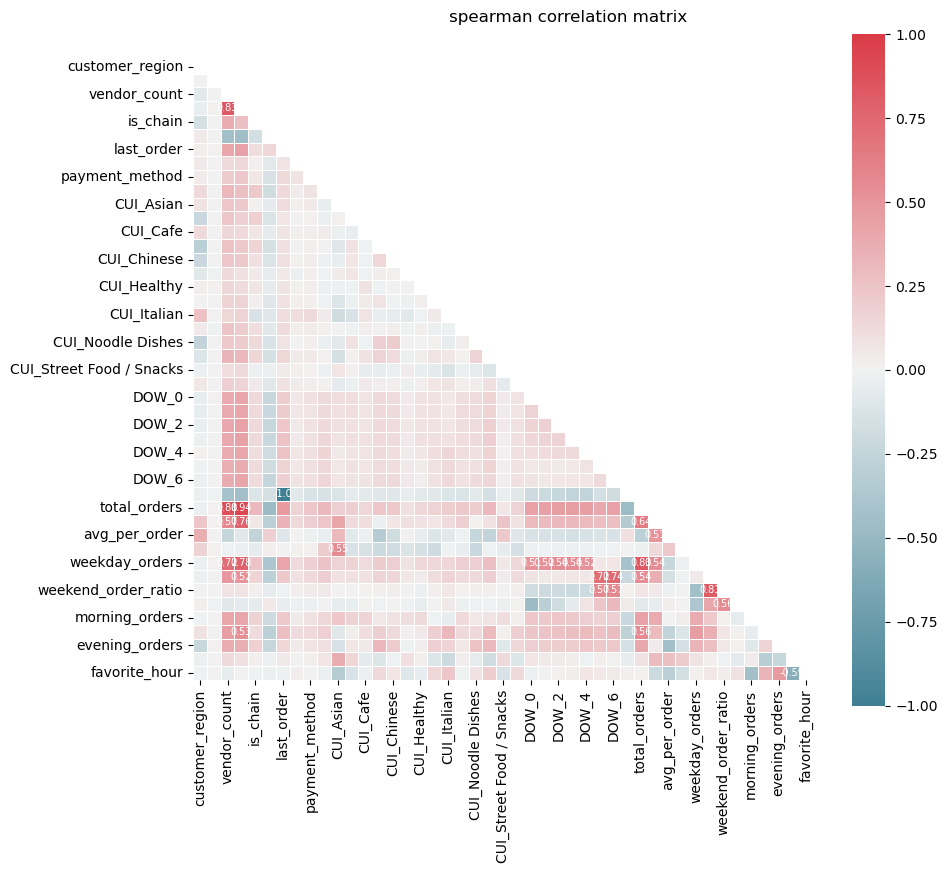

In [92]:
corr_matrix(df_selection, 'spearman')

In [93]:
# Calculate the correlation matrix using Spearman method
correlation_matrix = df_selection.corr(method="spearman")

# Create a DataFrame for correlations
correlation_pairs = (
    correlation_matrix
    .stack()  # Flatten the correlation matrix
    .reset_index()  # Convert it to a DataFrame
    .rename(columns={0: "correlation", "level_0": "feature_1", "level_1": "feature_2"})
)

# Filter correlations (absolute correlation > 0.5 and exclude self-correlation)
threshold = 0.5
correlation_pairs = correlation_pairs[
    (correlation_pairs["correlation"].abs() > threshold) &  # Include both positive and negative correlations
    (correlation_pairs["feature_1"] != correlation_pairs["feature_2"])
]

# Remove duplicate pairs by keeping only one direction (lexicographical order)
correlation_pairs = correlation_pairs[
    correlation_pairs["feature_1"] < correlation_pairs["feature_2"]
]

# Sort by absolute correlation value for better readability
correlation_pairs = correlation_pairs.sort_values(by="correlation", ascending=False, key=abs)

# Display the result
correlation_pairs

,feature_1,feature_2,correlation
301,last_order,recency,-1.000000
167,product_count,total_orders,0.940861
1442,total_orders,vendor_count,0.876896
137,product_count,vendor_count,0.826842
1476,total_orders,weekday_orders,0.826372
1747,weekend_order_ratio,weekend_orders,0.806560
171,product_count,weekday_orders,0.775216
168,product_count,total_spent,0.763807
1387,DOW_6,weekend_orders,0.741110
126,vendor_count,weekday_orders,0.720675


Insights from the Correlation Matrix:
- The pair `recency` and `last_order`, have a perfect correlation among each other, so we might keep the variable that is easier to interpret (`last_order`)

In [94]:
spearman_variables = ['recency', "total_orders", "vendor_count", "weekend_orders", 
                        "DOW_0", "DOW_1", "DOW_2", "DOW_3", "DOW_4", "DOW_5", "DOW_6"]

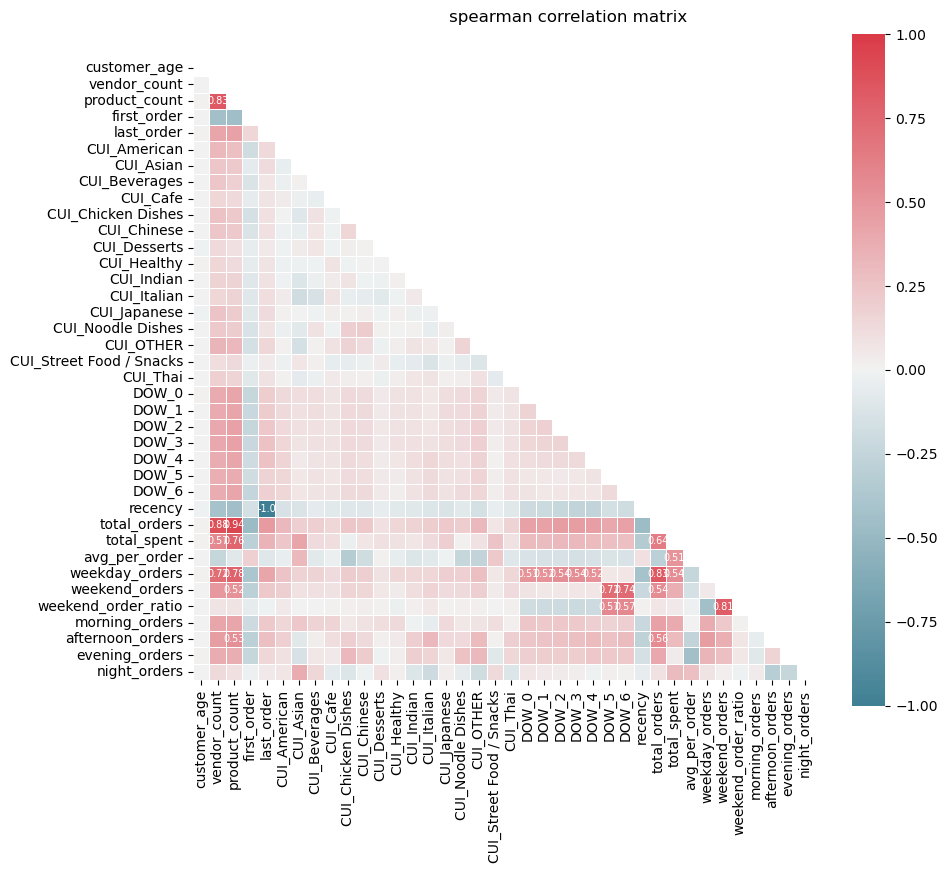

In [95]:
corr_matrix(df_selection[metric_features], 'spearman')

## PCA

`PCA` is great to determine which variables explain the most variance in the dataset and it is also very usefull to reduce dimensionality. We will use this method to try to determine the most important features to keep for the clustering problem.

Since we are working with too many variables at this point, we want to reduce dimensionality to avoid noise and keep an equilibrium between information and performance. <br>
Therefore we will be happy with an explained variance between `80% and 90%`. <br>
*If this was a classification problem we should aim for an higher value*

*Testing for 95% variance explained just in case we are lucky and not many variables are needed*

In [96]:
pca = PCA(n_components=0.95)  # Retain 95% of variance
pca_data = pca.fit_transform(df_standard[metric_features])

df_pca = pd.DataFrame(pca_data, columns=[f'PC{i+1}' for i in range(pca_data.shape[1])])

print(f"Original number of variables: {df_standard[metric_features].shape[1]}")
print(f"Number of variables after PCA: {df_pca.shape[1]}")

Original number of variables: 38
Number of variables after PCA: 26


In [97]:
pca = PCA(n_components=0.90)  # Retain 90% of variance
pca_data = pca.fit_transform(df_standard[metric_features])

df_pca = pd.DataFrame(pca_data, columns=[f'PC{i+1}' for i in range(pca_data.shape[1])])

print(f"Original number of variables: {df_standard[metric_features].shape[1]}")
print(f"Number of variables after PCA: {df_pca.shape[1]}")

Original number of variables: 38
Number of variables after PCA: 24


In [98]:
pca = PCA(n_components=0.80)  # Retain 80% of variance
pca_data = pca.fit_transform(df_standard[metric_features])

df_pca = pd.DataFrame(pca_data, columns=[f'PC{i+1}' for i in range(pca_data.shape[1])])

print(f"Original number of variables: {df_standard[metric_features].shape[1]}")
print(f"Number of variables after PCA: {df_pca.shape[1]}")

Original number of variables: 38
Number of variables after PCA: 19


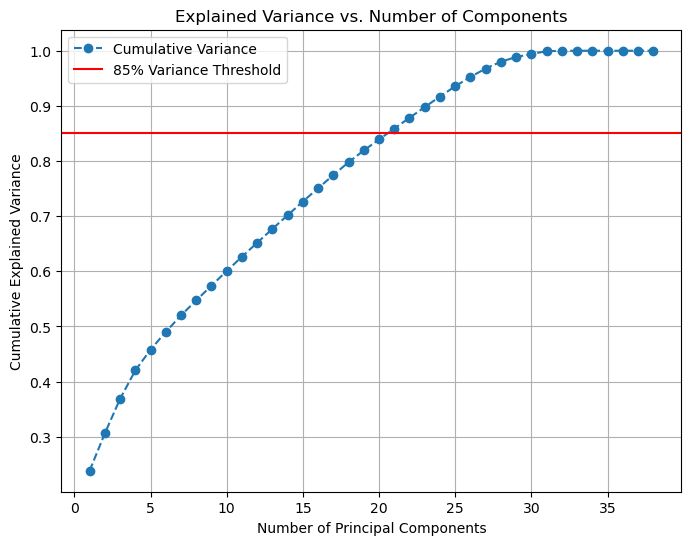

In [99]:
# Apply PCA without specifying n_components
pca = PCA()
pca.fit(df_standard[metric_features])

# Cumulative explained variance
cumulative_variance = pca.explained_variance_ratio_.cumsum()

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--', label='Cumulative Variance')
plt.axhline(y=0.85, color='r', linestyle='-', label='85% Variance Threshold')  # Add horizontal line at 85%
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.legend()
plt.show()

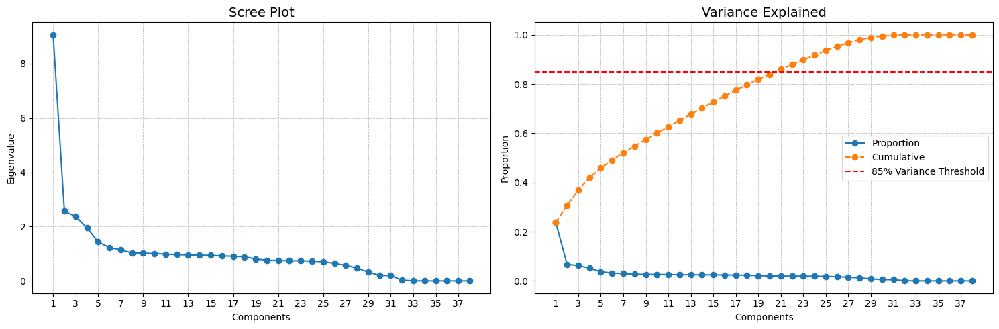

In [100]:
# Figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# Add a horizontal line at 0.85 in the variance plot
ax2.axhline(y=0.85, color='r', linestyle='--', label="85% Variance Threshold")

# Add grids
ax1.grid(True, linestyle='--', linewidth=0.5)
ax2.grid(True, linestyle='--', linewidth=0.5)

# Customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.tight_layout()
plt.show()


In [101]:
pca_table = pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

pca_table

,Eigenvalue,Difference,Proportion,Cumulative
1,9.063074e+00,0.000000e+00,2.384940e-01,0.238494
2,2.567945e+00,-6.495129e+00,6.757525e-02,0.306069
3,2.378573e+00,-1.893717e-01,6.259195e-02,0.368661
4,1.960024e+00,-4.185491e-01,5.157787e-02,0.420239
5,1.432484e+00,-5.275405e-01,3.769569e-02,0.457935
6,1.225364e+00,-2.071197e-01,3.224535e-02,0.490180
7,1.140688e+00,-8.467570e-02,3.001711e-02,0.520197
8,1.030125e+00,-1.105628e-01,2.710766e-02,0.547305
9,1.017071e+00,-1.305396e-02,2.676415e-02,0.574069
10,1.006638e+00,-1.043332e-02,2.648960e-02,0.600559


### PCA Final Insights

We think 24 is the right number of variables to keep from PCA:
- 24 variables is just below the 90% value, which is between the 80-90% interval we set
- the eigenvalues stabilizes a little before 24 but it goes down quickly after this number

In [102]:
pca = PCA(n_components=24)  # We are selecting 20 principal components
pca.fit(df_standard[metric_features])

loading_matrix = pd.DataFrame(
    pca.components_, 
    columns=df_selection[metric_features].columns
)

variable_contributions = loading_matrix.abs().sum(axis=0)
pca_variables = variable_contributions.sort_values(ascending=False).head(24).index.tolist()

pca_variables

['CUI_Chicken Dishes',
 'CUI_American',
 'CUI_Cafe',
 'CUI_Street Food / Snacks',
 'CUI_Chinese',
 'CUI_Healthy',
 'CUI_Italian',
 'CUI_Beverages',
 'CUI_Desserts',
 'CUI_Thai',
 'CUI_Indian',
 'CUI_Asian',
 'CUI_Noodle Dishes',
 'CUI_Japanese',
 'CUI_OTHER',
 'DOW_4',
 'night_orders',
 'morning_orders',
 'DOW_0',
 'DOW_5',
 'avg_per_order',
 'DOW_6',
 'customer_age',
 'DOW_3']

## Final Feature Selection

In [103]:
table = {'Feature': df[metric_features].columns}

table['Variance'] = ['Keep' if feature not in low_variance_features else 'Discard' for feature in df[metric_features].columns]
table['Spearman'] = ['Keep' if feature not in spearman_variables else 'Discard' for feature in df[metric_features].columns]
table['PCA'] = ['Keep' if feature not in pca_variables else 'Discard' for feature in df[metric_features].columns]

fs_table = pd.DataFrame(table)
fs_table['Result'] = fs_table.iloc[:, 1:].apply(
    lambda x: 'Keep' if list(x).count('Keep') > len(x) / 2 else 'Discard',
    axis=1
)

selected_features = fs_table[fs_table['Result'] == 'Keep']['Feature'].tolist()

def color_cells(val):
    if val == 'Keep':
        return 'background-color: green'
    elif val == 'Discard':
        return 'background-color: coral'
    else:
        return ''

styled_fs_table = fs_table.style.applymap(color_cells, subset=fs_table.columns[1:])

styled_fs_table

,Feature,Variance,Spearman,PCA,Result
0,customer_age,Keep,Keep,Discard,Keep
1,vendor_count,Discard,Discard,Keep,Discard
2,product_count,Discard,Keep,Keep,Keep
3,first_order,Keep,Keep,Keep,Keep
4,last_order,Keep,Keep,Keep,Keep
5,CUI_American,Discard,Keep,Discard,Discard
6,CUI_Asian,Keep,Keep,Discard,Keep
7,CUI_Beverages,Discard,Keep,Discard,Discard
8,CUI_Cafe,Discard,Keep,Discard,Discard
9,CUI_Chicken Dishes,Discard,Keep,Discard,Discard


In [104]:
selected_features

['customer_age',
 'product_count',
 'first_order',
 'last_order',
 'CUI_Asian',
 'recency',
 'total_spent',
 'weekday_orders',
 'weekend_order_ratio',
 'afternoon_orders',
 'evening_orders']

Since all cuisine related variables have been discarded, we don't think it is benefitial to keep `CUI_Asian` alone, therefore we will drop it. <br>
We will reintroduce `morning_orders` and `night_orders` since the other 2 schedules were maintained.
We will reintroduce `weekend_orders` since weekday_orders was kept.

In [105]:
selected_features = ['customer_age',
                    'product_count',
                    'first_order',
                    'last_order',
                    'recency',
                    'total_spent',
                    'weekday_orders',
                    'weekend_orders',
                    'weekend_order_ratio',
                    'morning_orders',
                    'afternoon_orders',
                    'evening_orders',
                    'night_orders']

# Perspectives

In [106]:
demographic_variables = [
    'customer_region',
    'customer_age',
    'first_order',
    'payment_method'
]

metric_dem = ['customer_age', 'first_order']
non_metric_dem = ['customer_region', 'payment_method']

df_demographic = df_selection[demographic_variables].copy()


product_variables = [
    'is_chain',
    'product_count',
    'last_order',
    'recency',
    'total_spent',
    'weekday_orders',
    'weekend_orders',
    'weekend_order_ratio',
    'morning_orders',
    'afternoon_orders',
    'evening_orders'
]

metric_prod = [
    'product_count',
    'last_order',
    'recency',
    'total_spent',
    'weekday_orders',
    'weekend_orders',
    'weekend_order_ratio',
    'morning_orders',
    'afternoon_orders',
    'evening_orders'
]
non_metric_prod = ['is_chain']

df_product = df_selection[product_variables].copy()

# Clustering

Table with all the results to keep track with clustering technique best fits our data

In [107]:
results_prod = pd.DataFrame(columns=["Method", "Clusters", "R2", "Silhouette"])

In [108]:
results_dem = pd.DataFrame(columns=["Method", "Clusters", "R2", "Silhouette"])

In [109]:
def get_ss(df):

    ss = np.sum(df.var() * (df.count() - 1))
    return ss 

In [110]:
def get_r2(df, label_col):

    sst = get_ss(df)                                    # sum of squared errors
    ssw = np.sum(df.groupby(label_col).apply(get_ss))

    return (sst - ssw) / sst

In [111]:
def get_r2_hc(df, linkage, min_k = 1, max_k = 5, dist = "euclidian"):
    
    r2_clust = {}

    for n in range(min_k, max_k + 1):
        cluster = AgglomerativeClustering(n_clusters= i, metric= dist, linkage= linkage)
        labels = cluster.fit_predict(df)
        r2_clust[n] = get_r2(df, labels)
    return r2_clust

In [112]:
def plot_r2_scores(df):
    
    hc_methods = ["ward", "complete", "average", "single"]
    max_k = 10

    # Calculate R2 scores for each linkage method
    r2_hc = np.array([
        [
            get_r2(
                df.assign(labels=AgglomerativeClustering(
                    n_clusters=k, linkage=link, metric="euclidean"
                ).fit_predict(df)),
                "labels"
            )
            for k in range(1, max_k + 1)
        ]
        for link in hc_methods
    ])

    # Create DataFrame for R2 scores
    r2_hc_methods = pd.DataFrame(
        r2_hc.T,  # Transpose to match clusters along rows and methods along columns
        index=range(1, max_k + 1),  # Cluster counts
        columns=hc_methods  # Linkage methods
    )

    # Plot R2 scores
    sns.set()
    fig = plt.figure(figsize=(11, 5))
    sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"] * len(hc_methods))

    # Finalize the plot
    plt.legend(title="HC methods", title_fontsize=11)
    plt.xticks(range(1, max_k + 1))
    plt.xlabel("Number of clusters", fontsize=13)
    plt.ylabel("R2 metric", fontsize=13)
    plt.title("$R^2$ Plot for Various Hierarchical Methods", fontsize=15)
    plt.show()


In [113]:
def silhouette(data, labels):

    return silhouette_score(data, labels)

In [114]:
def avg_silhouette(data, labels):

    scores = [silhouette(data, label) for label in labels]
    return sum(scores) / len(scores)

In [115]:
def cluster_variable_distributions(n_clusters, data, labels_name):

    # Get the list of variables (excluding the labels column)
    variables = [col for col in data.columns if col != labels_name]
    
    # Set up the grid of subplots
    n_cols = 5  # Number of plots per row
    n_rows = (len(variables) + n_cols - 1) // n_cols  # Calculate required rows
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows), constrained_layout=True)
    axs = axs.flatten()  # Flatten the 2D array of axes for easier iteration
    
    # Palette for clusters
    palette = sns.color_palette('pastel', n_colors=n_clusters).as_hex()
    
    for i, variable in enumerate(variables):
        ax = axs[i]
        
        # Aggregate data: count occurrences for each cluster
        cluster_counts = data.groupby(labels_name)[variable].value_counts().unstack(fill_value=0)
        
        # Plot the bar chart
        cluster_counts.T.plot(kind='bar', ax=ax, color=palette, alpha=0.7)
        
        ax.set_title(variable, fontsize=12)
        ax.set_xlabel('Clusters')
        ax.set_ylabel('Number of Occurrences')
        ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Remove any unused subplots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])
    
    plt.show()


In [116]:
def plot_dendrogram(name_method, clusters, linkage, y_threshold):
    
    # Adapted from:
    # https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

    # create the counts of samples under each node (number of points being merged)
    counts = np.zeros(clusters.children_.shape[0])
    n_samples = len(clusters.labels_)

    # clusters.children_ contains the observation ids that are being merged together
    # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
    for i, merge in enumerate(clusters.children_):
        # track the number of observations in the current cluster being formed
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                # If this is True, then we are merging an observation
                current_count += 1  # leaf node
            else:
                # Otherwise, we are merging a previously formed cluster
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # the clusters.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
    # the clusters.distances_ indicates the distance between the two points/clusters (height of the u-joins)
    # the counts indicate the number of points being merged (dendrogram's x-axis)
    linkage_matrix = np.column_stack(
        [clusters.children_, clusters.distances_, counts]
    ).astype(float)
    
    sns.set()
    fig = plt.figure(figsize=(11,5))
    
    # The Dendrogram parameters need to be tuned
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.title(f'Hierarchical Clustering Dendrogram: {linkage.title()} Linkage', fontsize=21)
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(f'{name_method.title()} Distance', fontsize=13)
    plt.show()

In [117]:
def test_n_clusters_hc(n_clusters, data, linkage = "ward", distance = "euclidean"):

    hc_clust = AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=n_clusters)
    hc_labels = hc_clust.fit_predict(data)

    df_aux = pd.concat([data, 
                        pd.Series(hc_labels, 
                                    name='labels', 
                                    index=data.index)], 
                        axis=1)

    fig, axes = plt.subplots(1,2, figsize=(12,5), width_ratios=[.6,.4], tight_layout=True)

    hc_aux = df_aux.groupby('labels').mean().T

    sns.heatmap(hc_aux,
                center=0, annot=True, cmap="BrBG", fmt=".2f",
                ax=axes[0]
                )
    axes[0].set_xlabel("Cluster Labels")
    axes[0].set_title("Heatmap of Cluster Means")


    sns.countplot(df_aux, x='labels', ax=axes[1])
    axes[1].set_title("Cluster Sizes")
    axes[1].set_xlabel("Cluster Labels")

    fig.suptitle(f"Cluster Profiling:\nHierarchical Clustering with {n_clusters} Clusters")
    plt.show()
    
    return data, hc_labels

In [118]:
def test_n_clusters_kmean(n_clusters, data, linkage = "ward"):

    kmeans_clust = KMeans(n_clusters=n_clusters, init='k-means++', n_init=15, random_state=1)
    kmeans_labels = kmeans_clust.fit_predict(data)
    
    centroids = kmeans_clust.cluster_centers_

    df_aux = pd.concat((data, pd.Series(kmeans_labels, name='labels', index=data.index)), axis=1)

    fig, axes = plt.subplots(1,2, figsize=(12,5), width_ratios=[.6,.4], tight_layout=True)

    hc_profile = df_aux.groupby('labels').mean().T

    sns.heatmap(hc_profile,
                center=0, annot=True, cmap="BrBG", fmt=".2f",
                ax=axes[0]
                )
    axes[0].set_xlabel("Cluster Labels")
    axes[0].set_title("Heatmap of Cluster Means")


    sns.countplot(df_aux, x='labels', ax=axes[1])
    axes[1].set_title("Cluster Sizes")
    axes[1].set_xlabel("Cluster Labels")

    fig.suptitle(f"Cluster Profiling:\nHierarchical Clustering with {n_clusters} Clusters")
    plt.show()
    
    return data, kmeans_labels, centroids

## Hierarchical Clustering

### Product View

#### Find the best linkage method

We will test which linkage method shows the best results for our dataset. We will be testing for 4 different linkage methods:
- Single Linkage
- Average Linkage
- Complete Linkage
- Ward Linkage

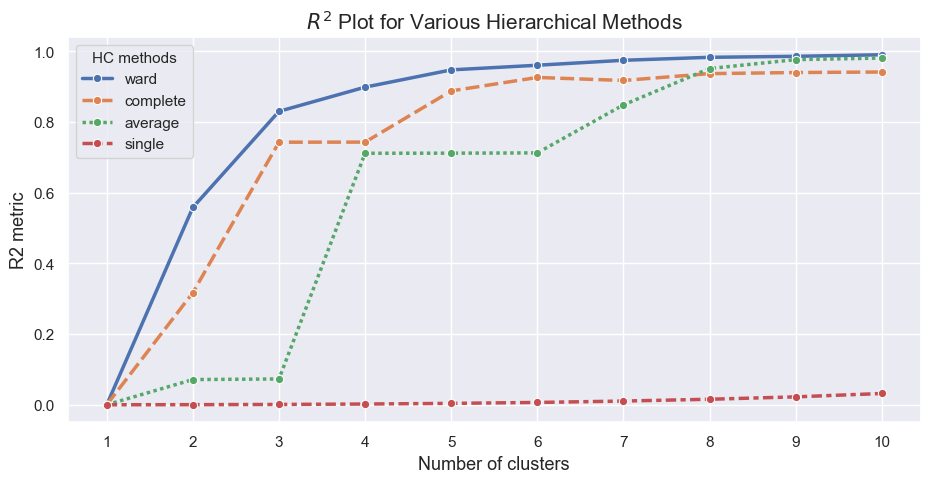

In [119]:
plot_r2_scores(df_product[metric_prod])

Since `Ward Linkage` appears to have the best result, even if it is still close to Complete Linkage and Average Linkage, we think it is the best to continue with the Ward Linkage

#### Defining the best number of clusters

Here we are trying to discover which is the best number of clusters to our problem. To do so, we are computing the entire tree by defining `distance_treshold` and `n_clusters` to 0.

In [120]:
linkage = 'ward'
distance = 'euclidean'

hc = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hc.fit_predict(df_product[metric_prod])

array([20851, 22771, 15317, ...,     3,     1,     0], dtype=int64)

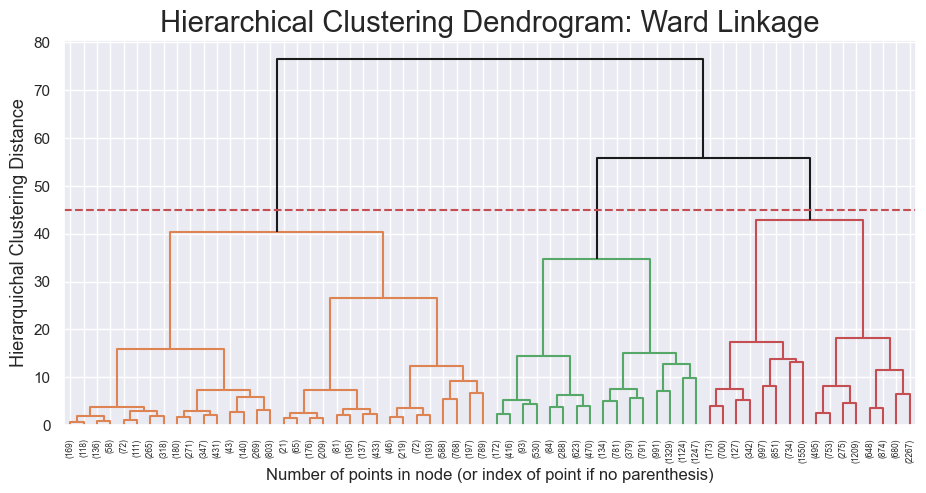

In [121]:
plot_dendrogram("Hierarquichal Clustering", hc, "ward", 45)

From the dendrogram we can see that the optimal number of clusters is either 3, 4 or 5.

#### Test Clusters

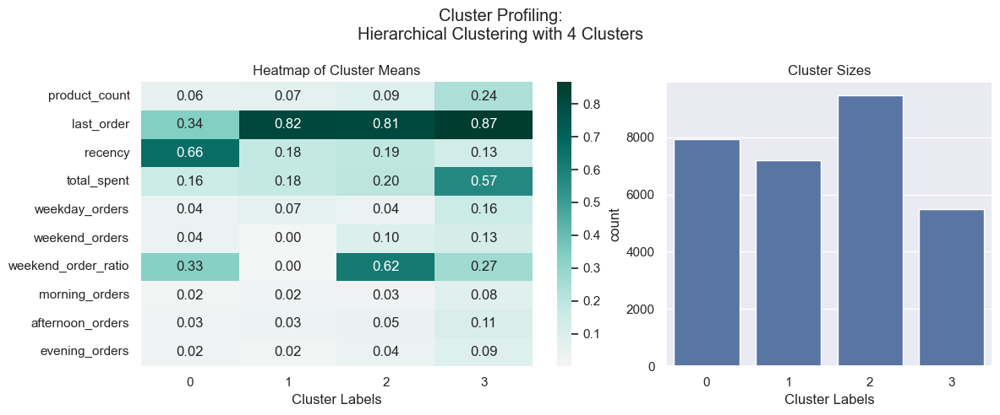

In [122]:
df_hc4, labels_hc4 = test_n_clusters_hc(4, df_product[metric_prod])

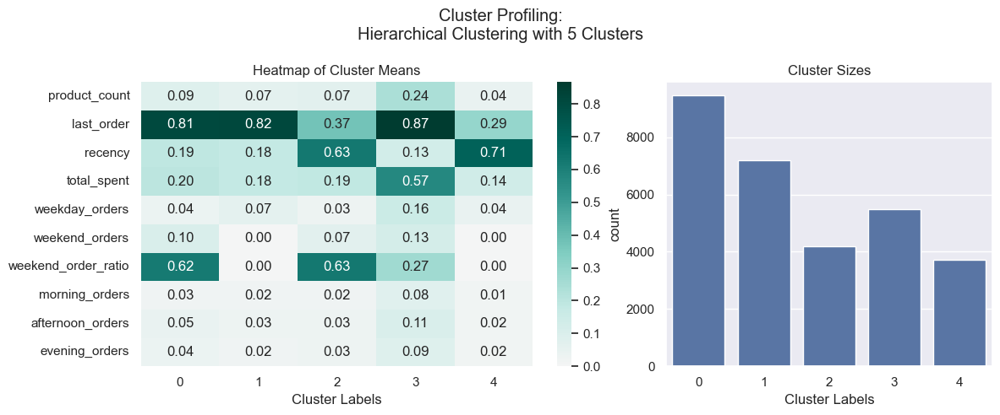

In [123]:
df_hc5, labels_hc5 = test_n_clusters_hc(5, df_product[metric_prod])

In [124]:
r2_hc_4 = get_r2(df_hc4, labels_hc4)
r2_hc_4

0.5493947436324954

In [125]:
r2_hc_5 = get_r2(df_hc5, labels_hc5)
r2_hc_5

0.6318265411192666

In [126]:
silh_hc_4 = silhouette(df_hc4, labels_hc4)
silh_hc_4

0.2607797501998963

In [127]:
silh_hc_5 = silhouette(df_hc5, labels_hc5)
silh_hc_5

0.27600843718839

From this we can tell that the 5 cluster solutions provides more detail and better segmentation. <br>
Also the *R2* is higher in 5 cluster solutions. <br>
*(A big portion of Cluster0 in 4 cluster solution splits into other clusters)*

#### Final Hierarchical Clustering solution

In [128]:
new_row = pd.DataFrame({
    "Method": ["Hierarchical"], "Clusters": [5], "R2": [r2_hc_5], "Silhouette": [silh_hc_5]
})

results_prod = pd.concat([results_prod, new_row], ignore_index=True)
results_prod

,Method,Clusters,R2,Silhouette
0,Hierarchical,5,0.631827,0.276008


### Demographic Perspective

#### Find the best linkage method

We will test which linkage method shows the best results for our dataset. We will be testing for 4 different linkage methods:
- Single Linkage
- Average Linkage
- Complete Linkage
- Ward Linkage

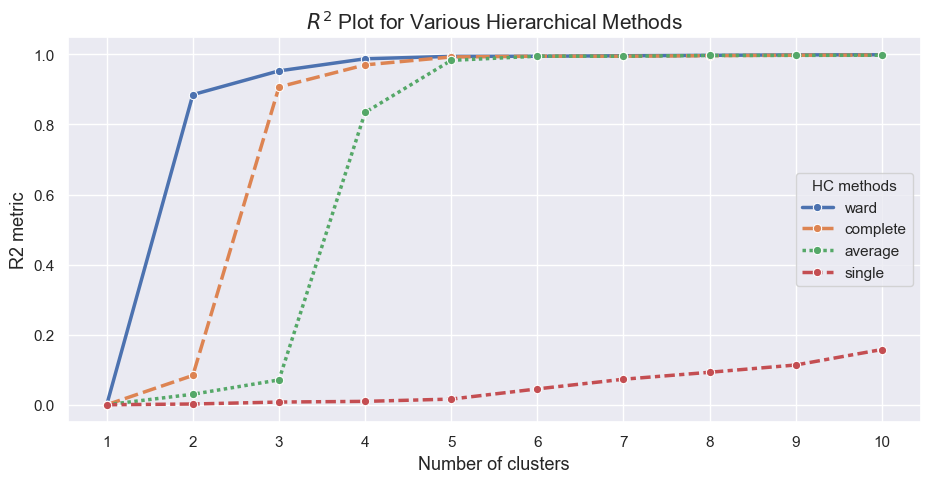

In [129]:
plot_r2_scores(df_demographic[metric_dem])

Since `Ward Linkage` appears to have the best result. This time our data set is much smaller so every method eventually converges, but with less clusters it is definitely the best performer.

#### Defining the best number of clusters

Here we are trying to discover which is the best number of clusters to our problem. To do so, we are computing the entire tree by defining `distance_treshold` and `n_clusters` to 0.

In [130]:
linkage = 'ward'
distance = 'euclidean'

hc = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hc.fit_predict(df_demographic[metric_dem])

array([30046, 30045, 30044, ...,     1,     2,     0], dtype=int64)

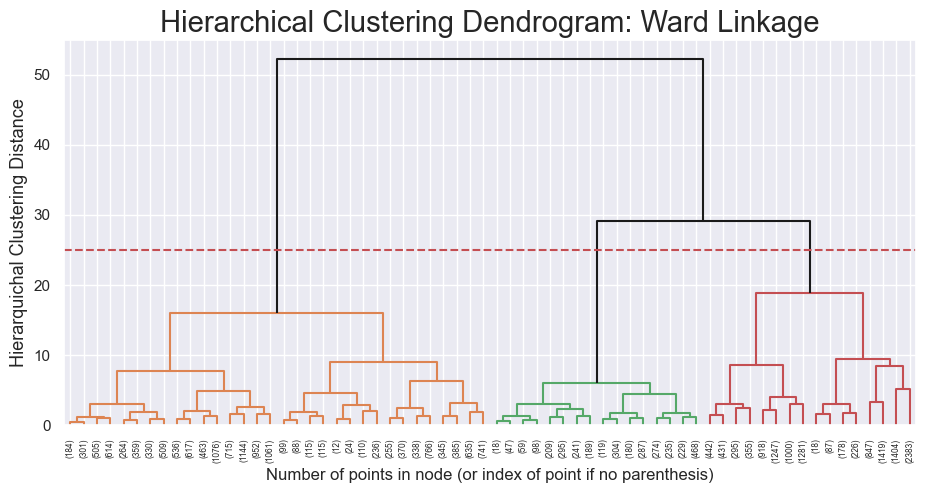

In [131]:
plot_dendrogram("Hierarquichal Clustering", hc, "ward", 25)

From the dendrogram we can see that the optimal number of clusters is either 2 or 3.

#### Test Clusters

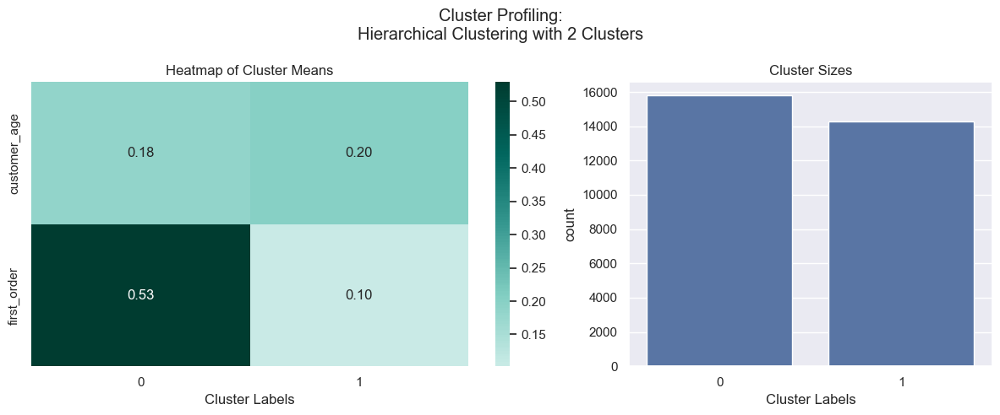

In [132]:
df_dem_hc2, labels_dem_hc2 = test_n_clusters_hc(2, df_demographic[metric_dem])

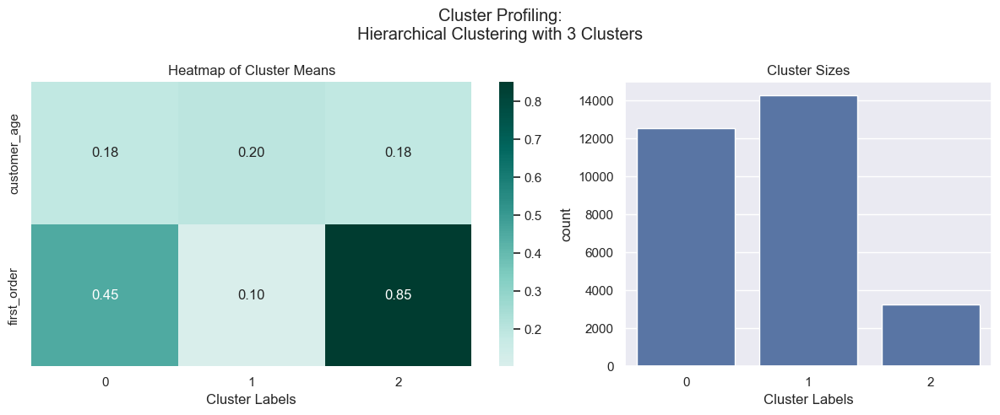

In [133]:
df_dem_hc3, labels_dem_hc3 = test_n_clusters_hc(3, df_demographic[metric_dem])

In [134]:
r2_hc_dem_2 = get_r2(df_dem_hc2, labels_dem_hc2)
r2_hc_dem_2

0.5433832476393095

In [135]:
r2_hc_dem_3 = get_r2(df_dem_hc3, labels_dem_hc3)
r2_hc_dem_3

0.7117314168156831

In [136]:
silh_hc_dem_2 = silhouette(df_dem_hc2, labels_dem_hc2)
silh_hc_dem_2

0.4516880767829985

In [137]:
silh_hc_dem_3 = silhouette(df_dem_hc3, labels_dem_hc3)
silh_hc_dem_3

0.41839097158134564

The best result is with 3 clusters.

#### Final Hierarchical Clustering solution

In [138]:
new_row = pd.DataFrame({
    "Method": ["Hierarchical"], "Clusters": [3], "R2": [r2_hc_dem_3], "Silhouette": [silh_hc_dem_3]
})

results_dem = pd.concat([results_dem, new_row], ignore_index=True)
results_dem

,Method,Clusters,R2,Silhouette
0,Hierarchical,3,0.711731,0.418391


## K-Means Clustering

### Product Perspective

In [139]:
# Better initialization method and provide more n_init
kmclust = KMeans(n_clusters=10, init='k-means++', n_init=15, random_state=1)
kmclust.fit(df_product[metric_prod])

KMeans(n_clusters=10, n_init=15, random_state=1)

In [140]:
kmclust.predict(df_product[metric_prod])

array([9, 9, 9, ..., 8, 8, 3])

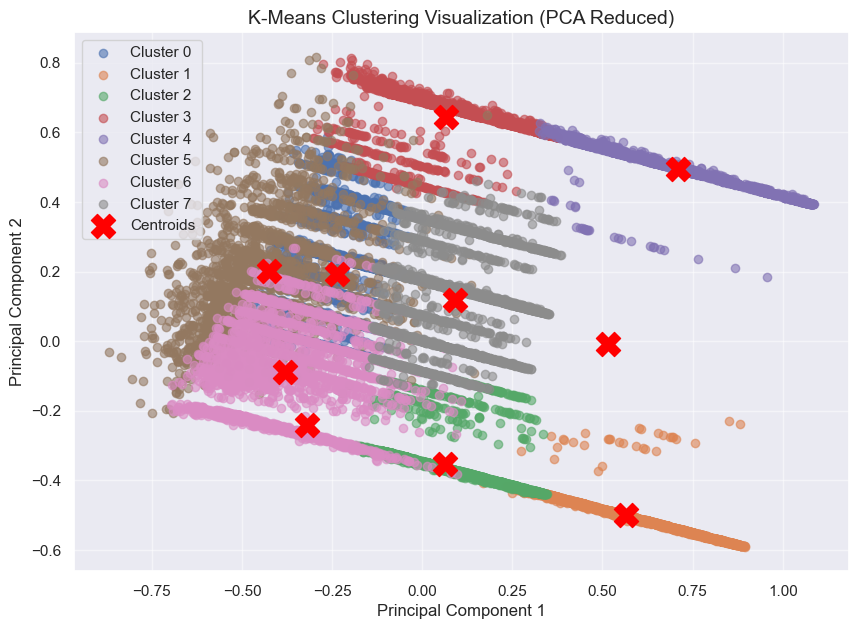

In [141]:
# Apply PCA to reduce dimensions for visualization (2D)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_product[metric_prod])

# Scatter plot of the clusters
plt.figure(figsize=(10, 7))
for cluster in range(8):  # Assuming n_clusters=8
    cluster_points = reduced_data[kmclust.labels_ == cluster]
    plt.scatter(
        cluster_points[:, 0], 
        cluster_points[:, 1], 
        label=f'Cluster {cluster}', 
        alpha=0.6
    )

# Add cluster centers
cluster_centers = pca.transform(kmclust.cluster_centers_)
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], s=300, c='red', marker='X', label='Centroids')

# Add titles and legend
plt.title('K-Means Clustering Visualization (PCA Reduced)', fontsize=14)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(alpha=0.5)
plt.show()

#### Defining the best number of clusters

In [142]:
range_clusters = range(1, 11)

In [143]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_product[metric_prod])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

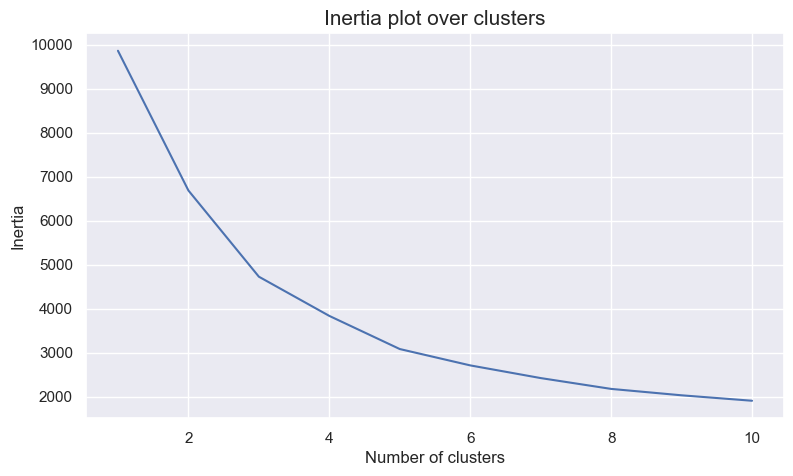

In [144]:
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia)
plt.ylabel("Inertia")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

The best solution would be between 2 and 4 clusters.

For n_clusters = 2, the average silhouette_score is : 0.33051345427964873
For n_clusters = 3, the average silhouette_score is : 0.338667869663006
For n_clusters = 4, the average silhouette_score is : 0.31530164667696525
For n_clusters = 5, the average silhouette_score is : 0.3291008851979369
For n_clusters = 6, the average silhouette_score is : 0.32470426218929604
For n_clusters = 7, the average silhouette_score is : 0.30364189476997216
For n_clusters = 8, the average silhouette_score is : 0.3140482191056937
For n_clusters = 9, the average silhouette_score is : 0.3108702248357081
For n_clusters = 10, the average silhouette_score is : 0.3056774660189573


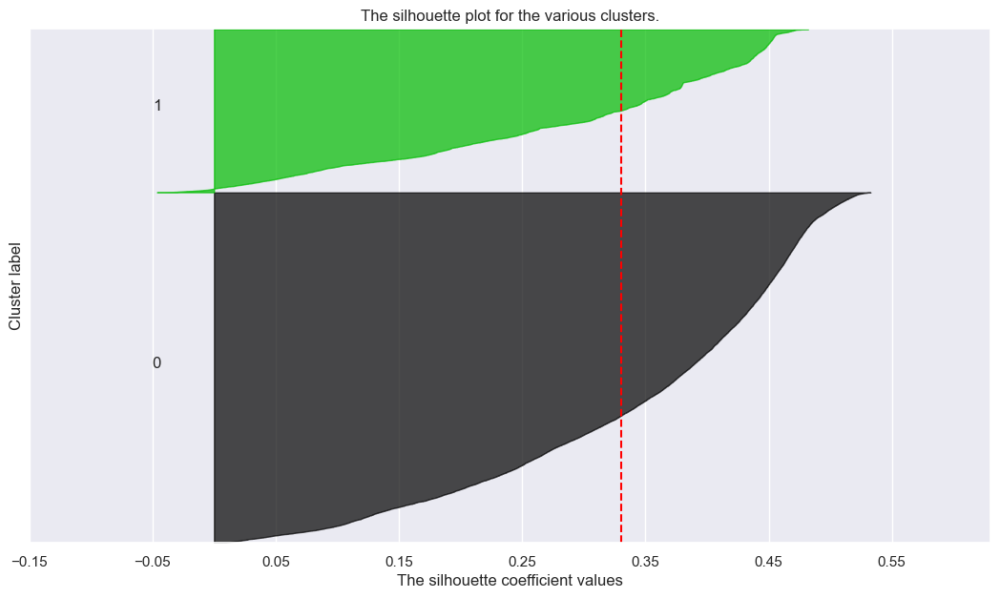

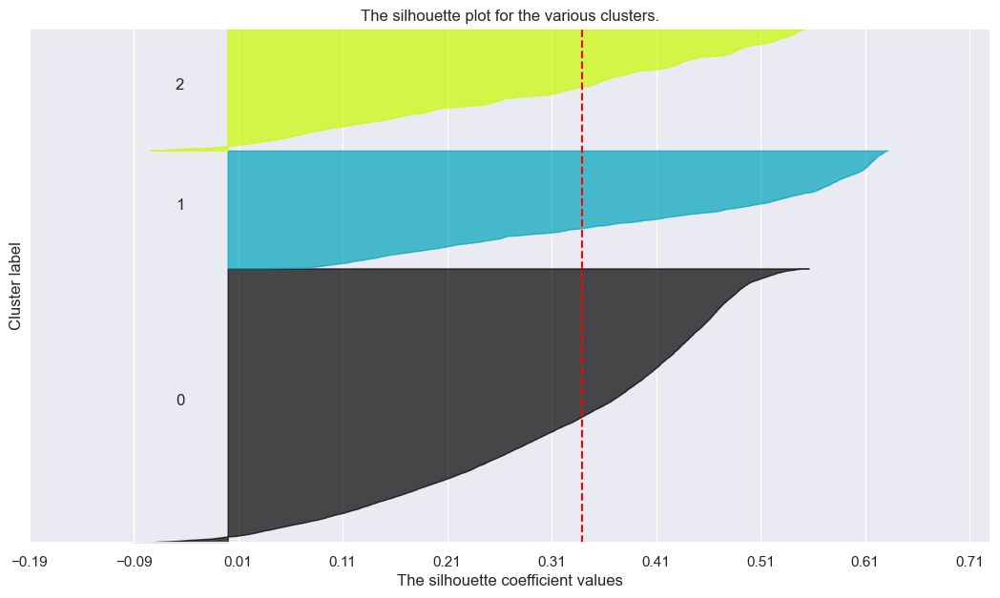

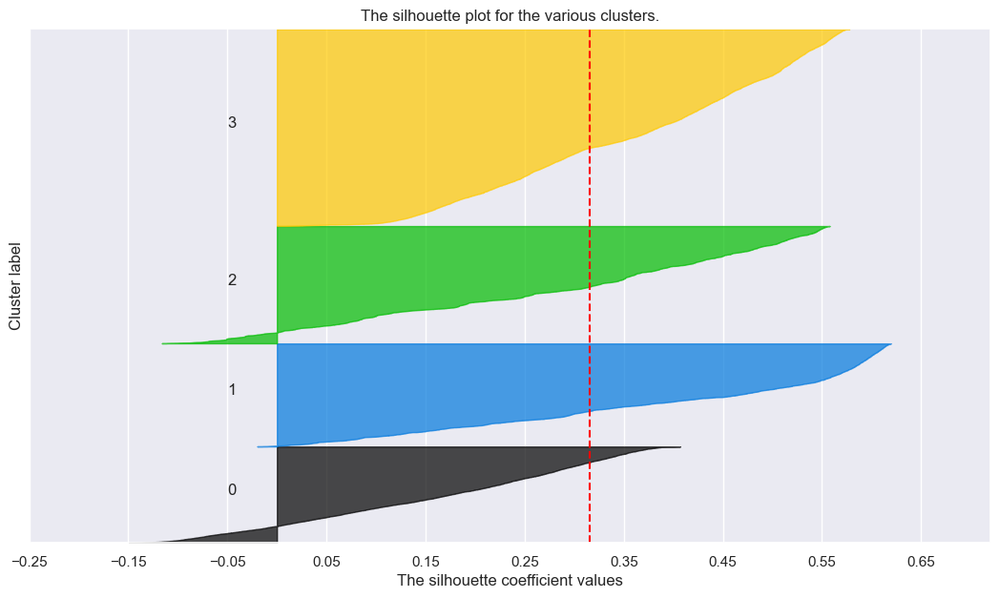

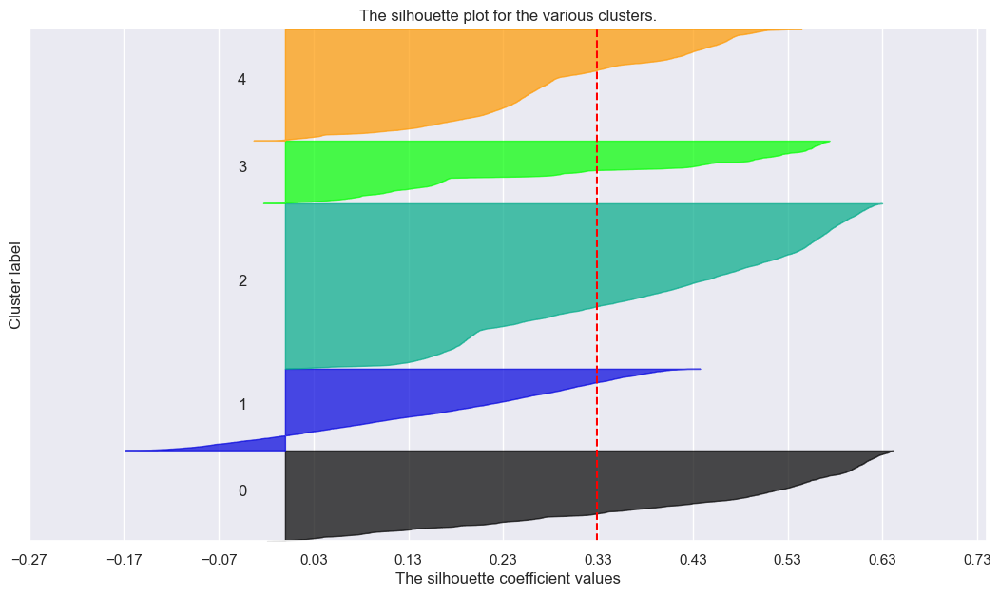

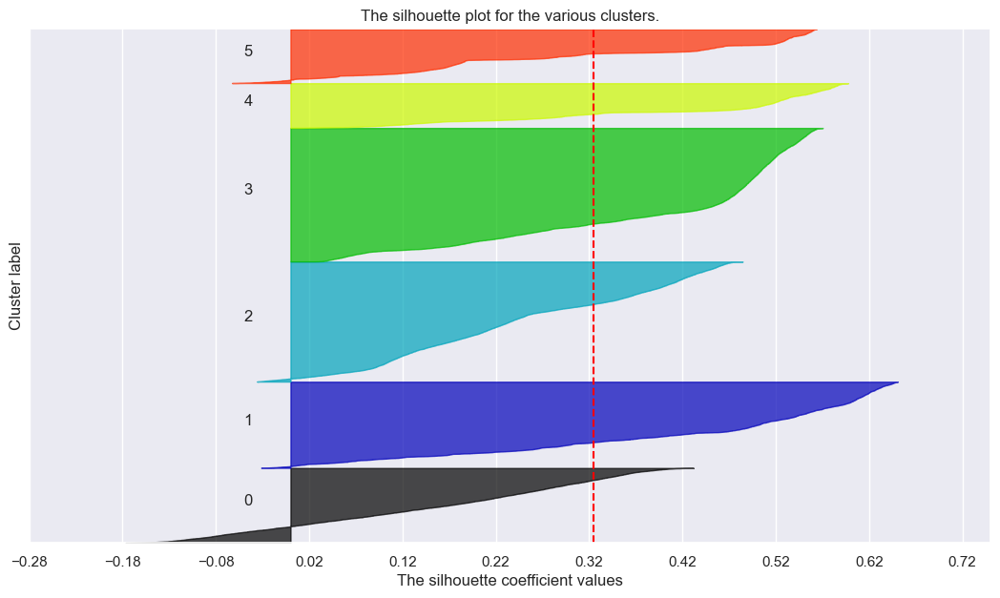

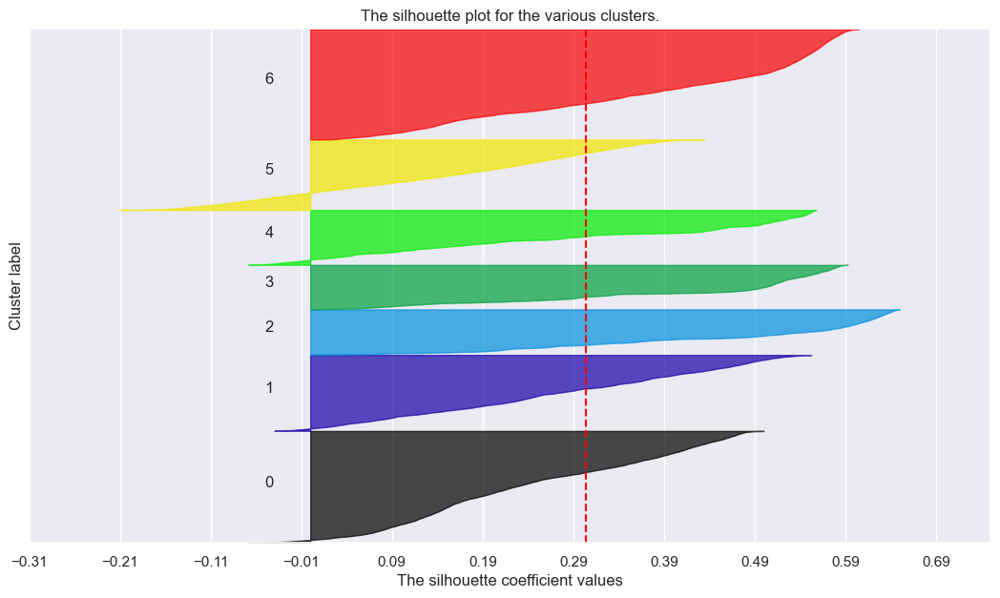

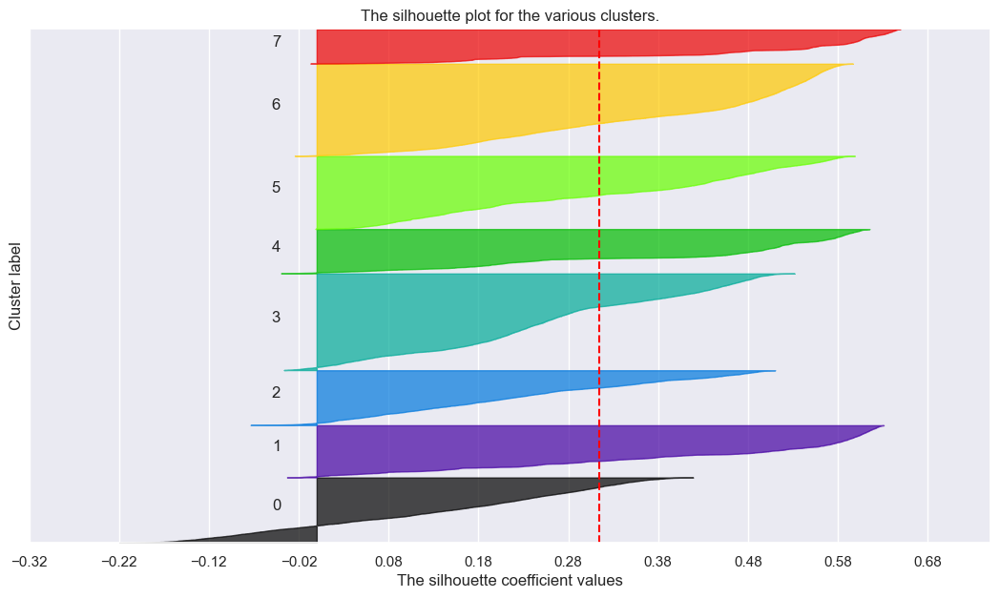

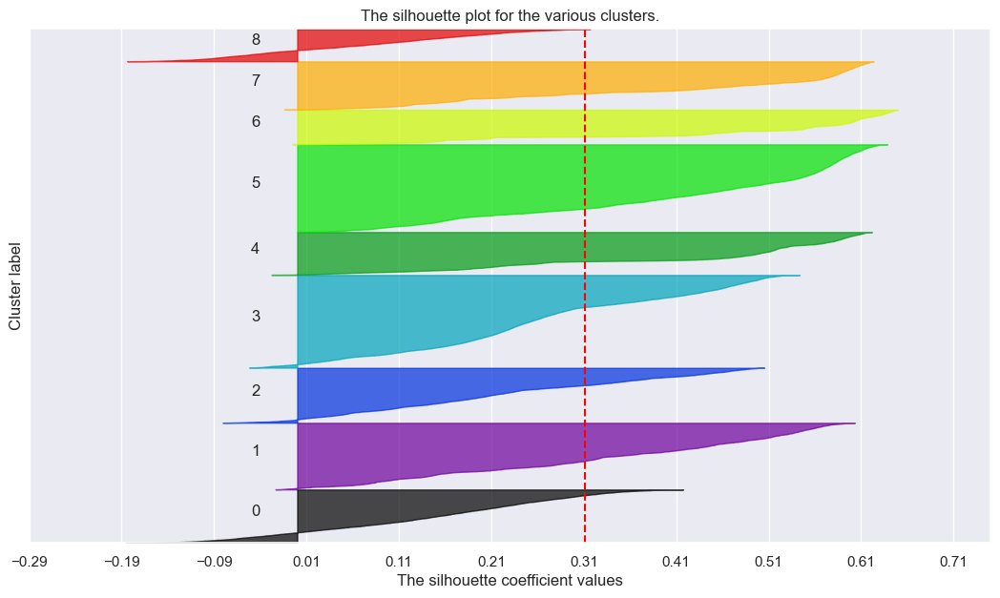

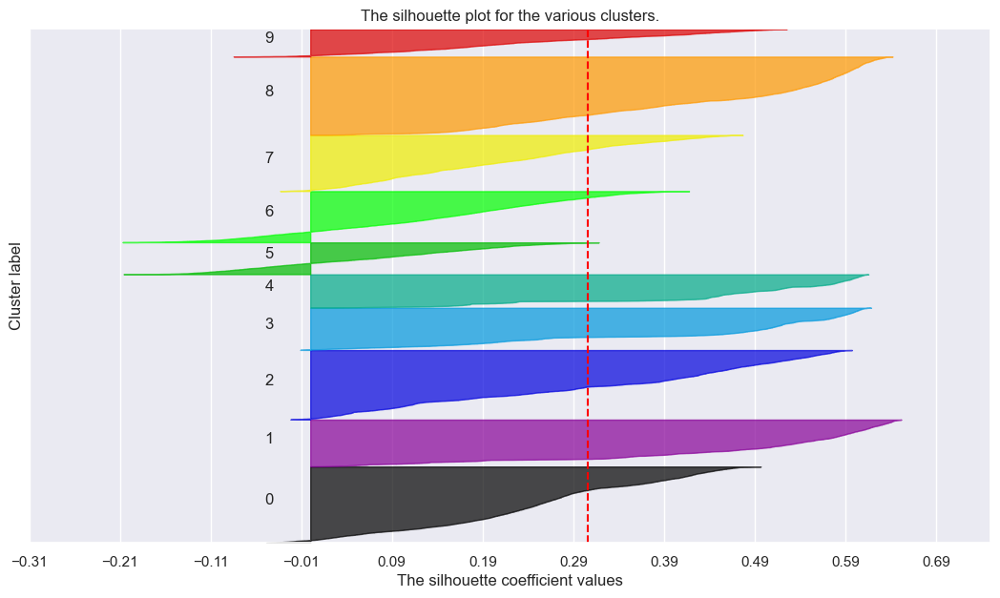

In [145]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_product[metric_prod])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_product[metric_prod], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_product[metric_prod], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_product[metric_prod]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

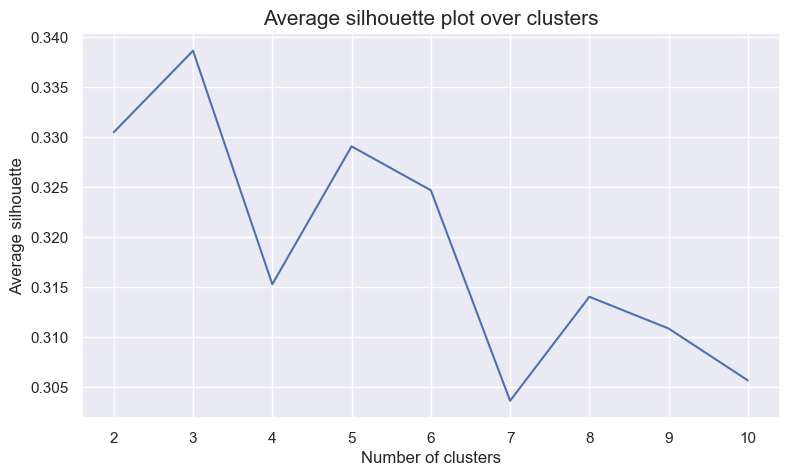

In [146]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters[1:], ## Plot X-axis; Why range_clusters[1:] ? Remember we skipped k=1 in the cell above
         avg_silhouette)     ## Plot Y-axis

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

The best solution would be either 2 or 3.

#### Test Clusters

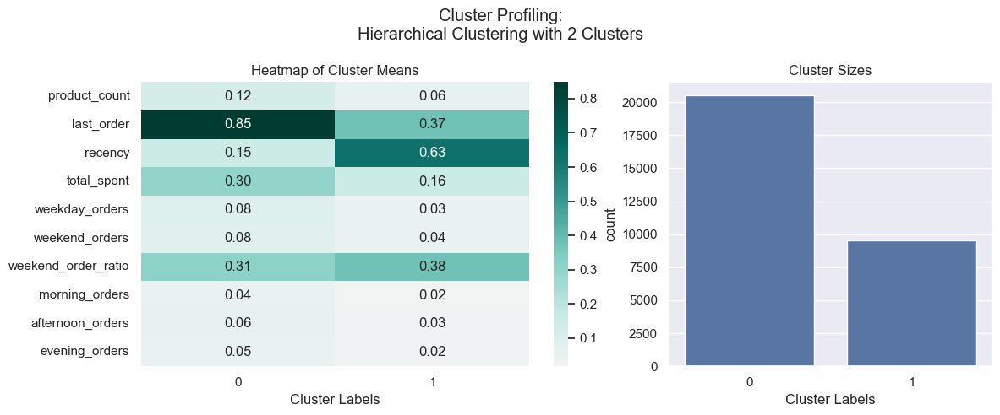

In [147]:
df_kmeans2, labels_kmeans2, centroids2 = test_n_clusters_kmean(2, df_product[metric_prod])

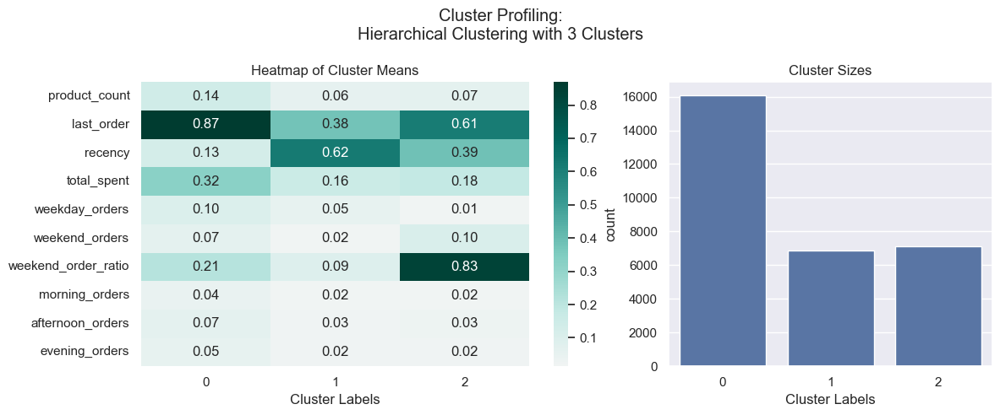

In [148]:
df_kmeans3, labels_kmeans3, centroids3 = test_n_clusters_kmean(3, df_product[metric_prod])

In [149]:
kmeans2_prod_r2 = get_r2(df_kmeans2, labels_kmeans2)
kmeans2_prod_r2

0.32203046722662293

In [150]:
kmeans3_prod_r2 = get_r2(df_kmeans3, labels_kmeans3)
kmeans3_prod_r2

0.5207044133263692

In [151]:
kmeans2_prod_silh = silhouette(df_kmeans2, labels_kmeans2)
kmeans2_prod_silh

0.33051345427964873

In [152]:
kmeans3_prod_silh = silhouette(df_kmeans3, labels_kmeans3)
kmeans3_prod_silh

0.338667869663006

The solution with 3 clusters is the best solution.

#### Final KMeans clustering solution

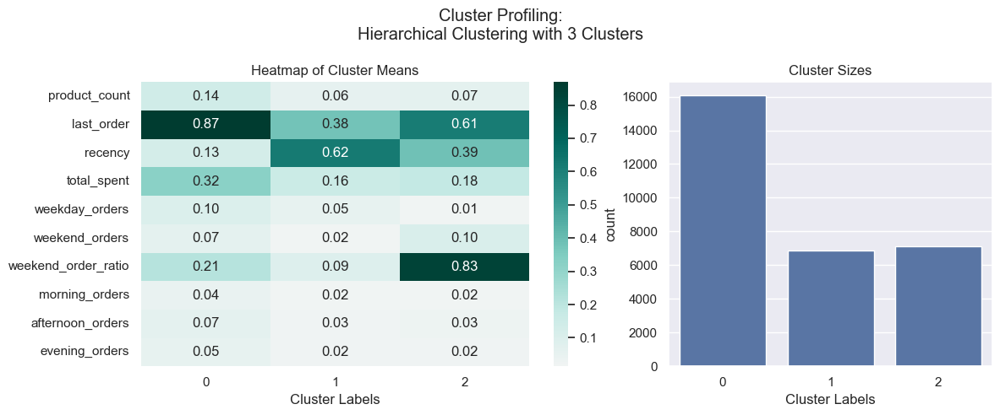

In [153]:
df_kmeans3, labels_kmeans3, centroid3 = test_n_clusters_kmean(3, df_product[metric_prod])

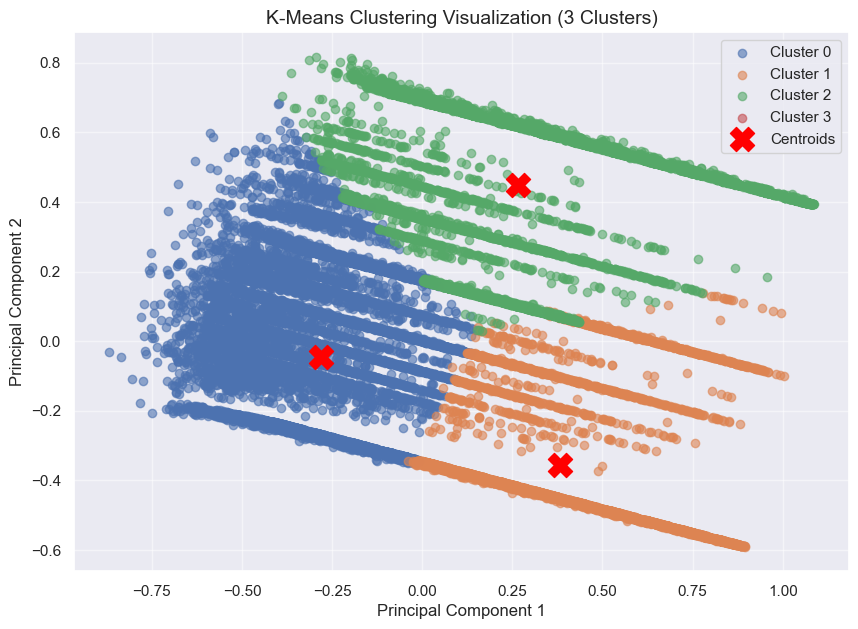

In [154]:
# Apply PCA to reduce data to 2D for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_product[metric_prod])

# Scatter plot for the clusters
plt.figure(figsize=(10, 7))
for cluster in range(4):
    cluster_points = reduced_data[labels_kmeans3 == cluster]
    plt.scatter(
        cluster_points[:, 0], 
        cluster_points[:, 1], 
        label=f'Cluster {cluster}', 
        alpha=0.6
    )

# Plot the centroids
centroids = pca.transform(centroids3)
plt.scatter(
    centroids[:, 0], 
    centroids[:, 1], 
    s=300, 
    c='red', 
    marker='X', 
    label='Centroids'
)

# Add titles and legend
plt.title('K-Means Clustering Visualization (3 Clusters)', fontsize=14)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(alpha=0.5)
plt.show()

In [155]:
new_row = pd.DataFrame({
    "Method": ["K-Means"], "Clusters": [3], "R2": [kmeans3_prod_r2], "Silhouette": [kmeans3_prod_silh]
})

results_prod = pd.concat([results_prod, new_row], ignore_index=True)
results_prod

,Method,Clusters,R2,Silhouette
0,Hierarchical,5,0.631827,0.276008
1,K-Means,3,0.520704,0.338668


### Demografic Perspective

In [156]:
# Better initialization method and provide more n_init
kmclust = KMeans(n_clusters=10, init='k-means++', n_init=15, random_state=1)
kmclust.fit(df_demographic[metric_dem])

KMeans(n_clusters=10, n_init=15, random_state=1)

In [157]:
kmclust.predict(df_demographic[metric_dem])

array([6, 6, 9, ..., 4, 4, 4])

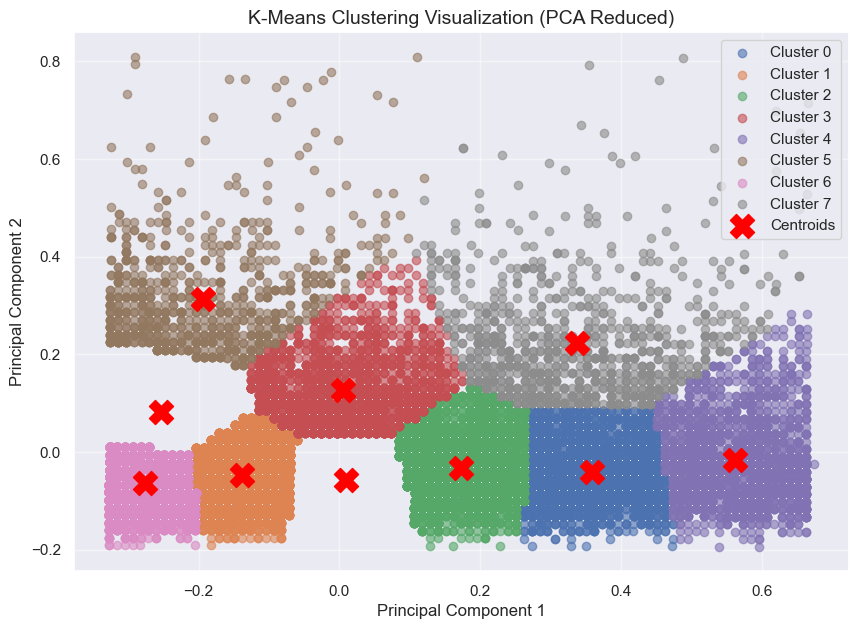

In [158]:
# Apply PCA to reduce dimensions for visualization (2D)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_demographic[metric_dem])

# Scatter plot of the clusters
plt.figure(figsize=(10, 7))
for cluster in range(8):  # Assuming n_clusters=8
    cluster_points = reduced_data[kmclust.labels_ == cluster]
    plt.scatter(
        cluster_points[:, 0], 
        cluster_points[:, 1], 
        label=f'Cluster {cluster}', 
        alpha=0.6
    )

# Add cluster centers
cluster_centers = pca.transform(kmclust.cluster_centers_)
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], s=300, c='red', marker='X', label='Centroids')

# Add titles and legend
plt.title('K-Means Clustering Visualization (PCA Reduced)', fontsize=14)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(alpha=0.5)
plt.show()

#### Defining the best number of clusters

In [159]:
range_clusters = range(1, 11)

In [160]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_demographic[metric_dem])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

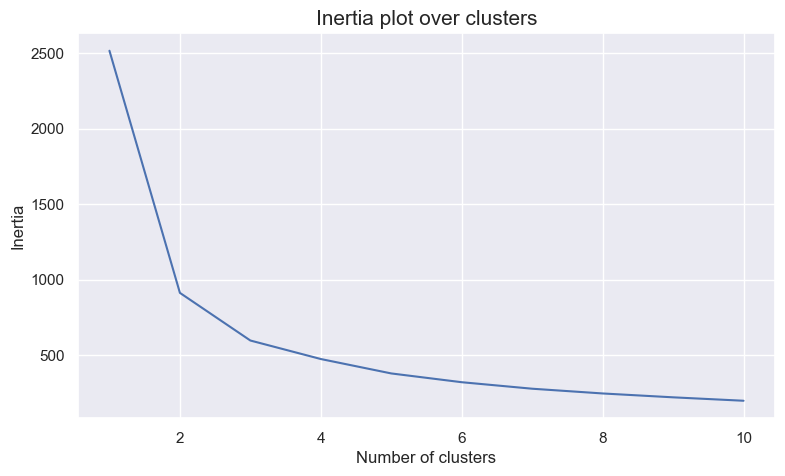

In [161]:
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia)
plt.ylabel("Inertia")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

The best solution would be between 2 and 4.

For n_clusters = 2, the average silhouette_score is : 0.552479279883221
For n_clusters = 3, the average silhouette_score is : 0.456980417114634
For n_clusters = 4, the average silhouette_score is : 0.4362327319384768
For n_clusters = 5, the average silhouette_score is : 0.404135968301892
For n_clusters = 6, the average silhouette_score is : 0.405884650693638
For n_clusters = 7, the average silhouette_score is : 0.3769762052818136
For n_clusters = 8, the average silhouette_score is : 0.3812828415577119
For n_clusters = 9, the average silhouette_score is : 0.3737774562647294
For n_clusters = 10, the average silhouette_score is : 0.36212328321445625


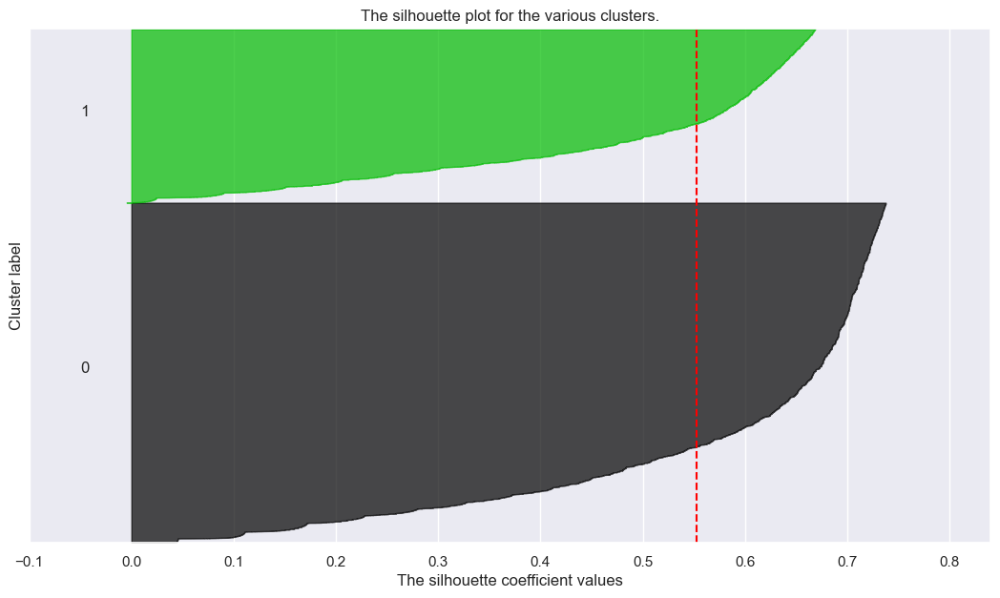

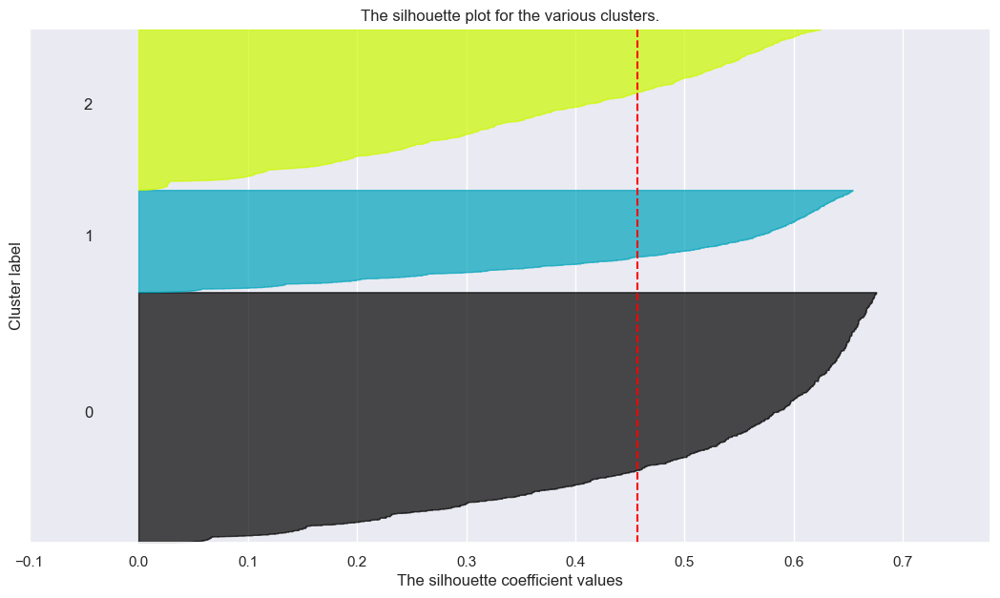

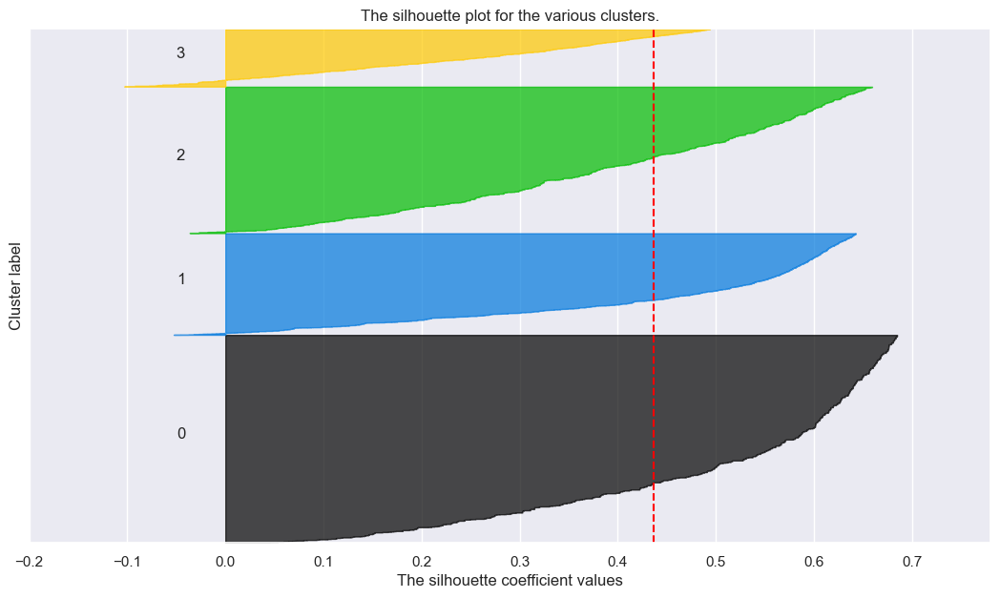

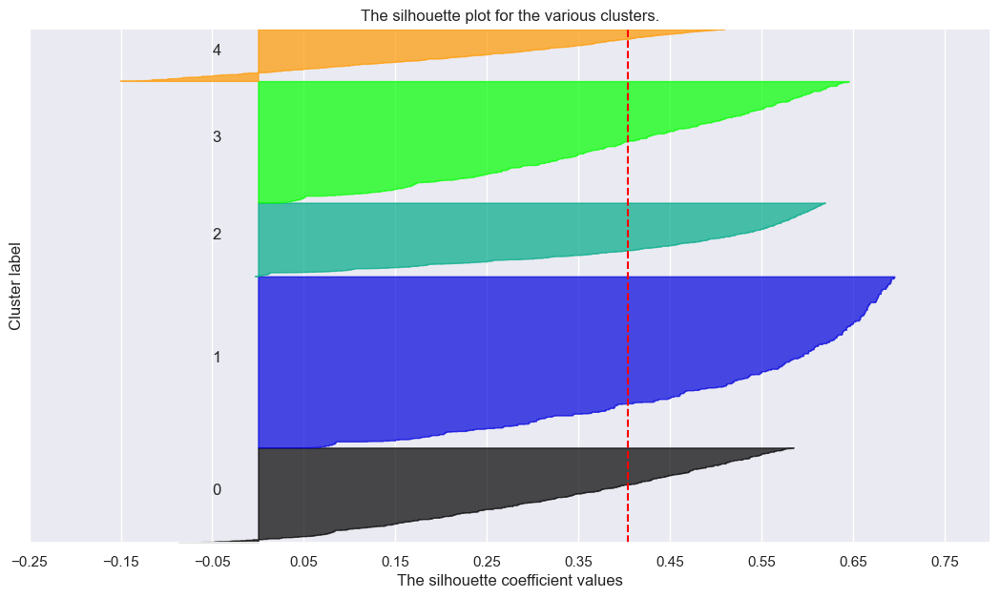

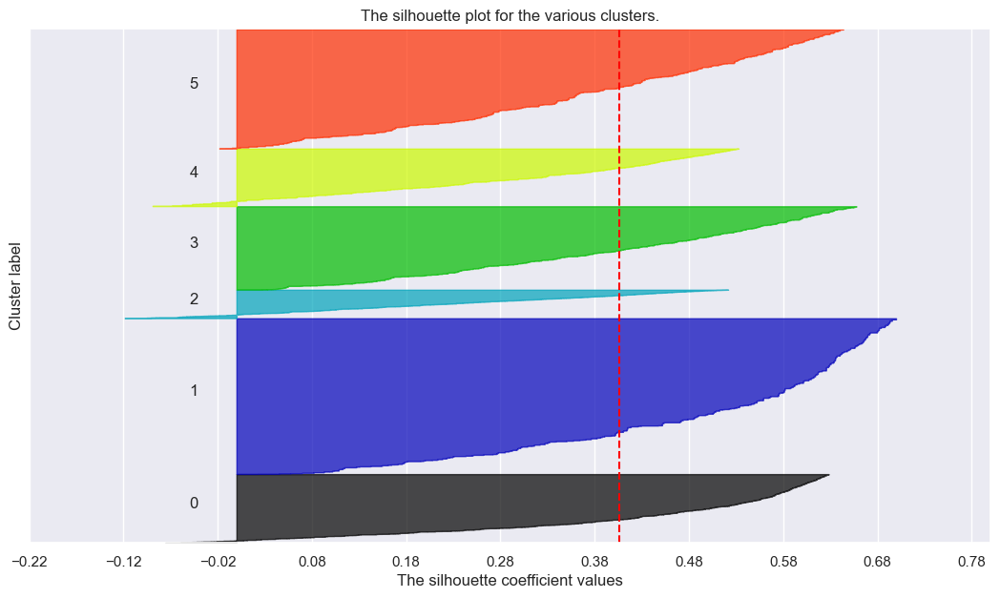

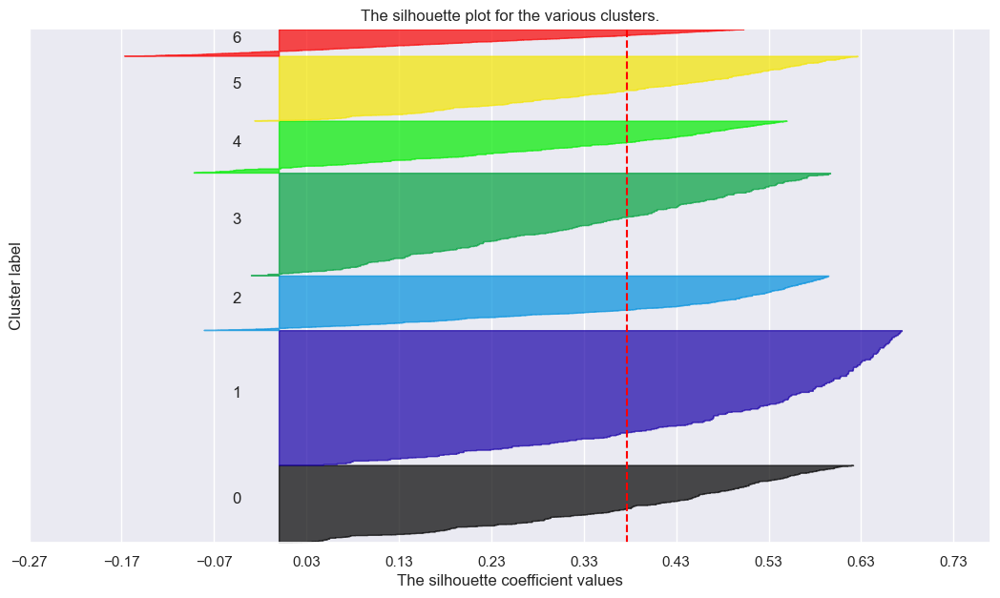

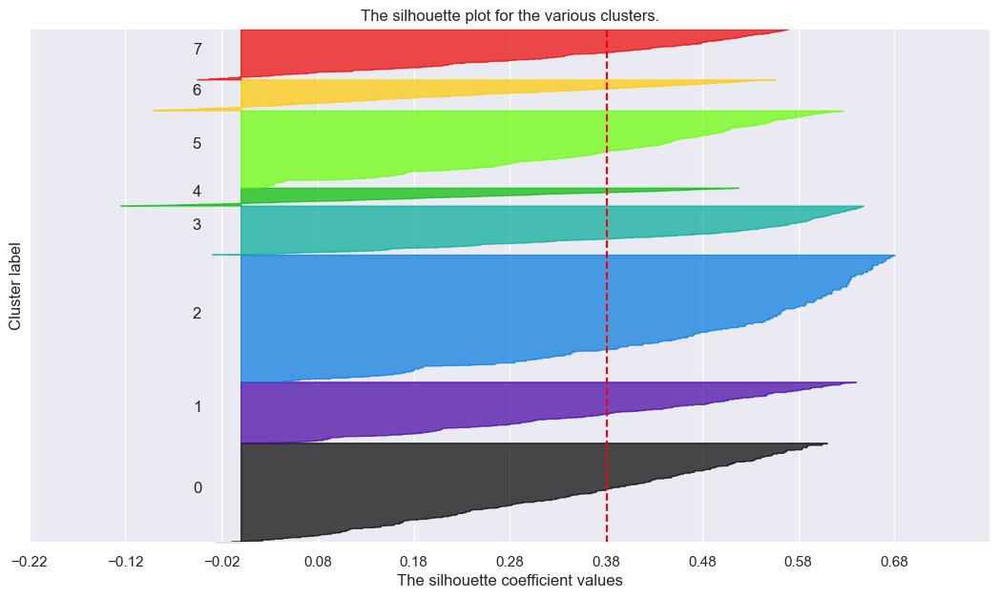

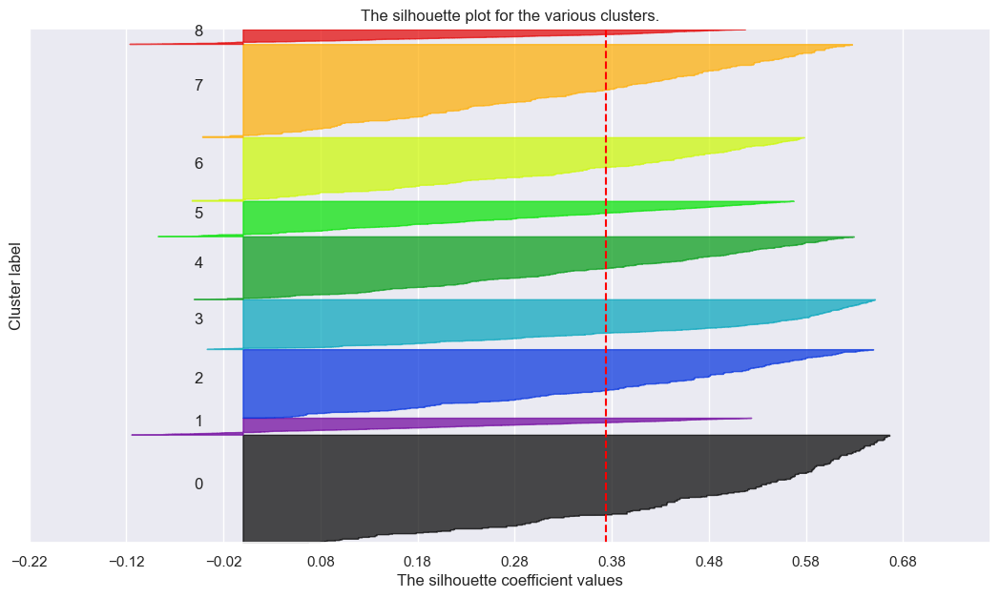

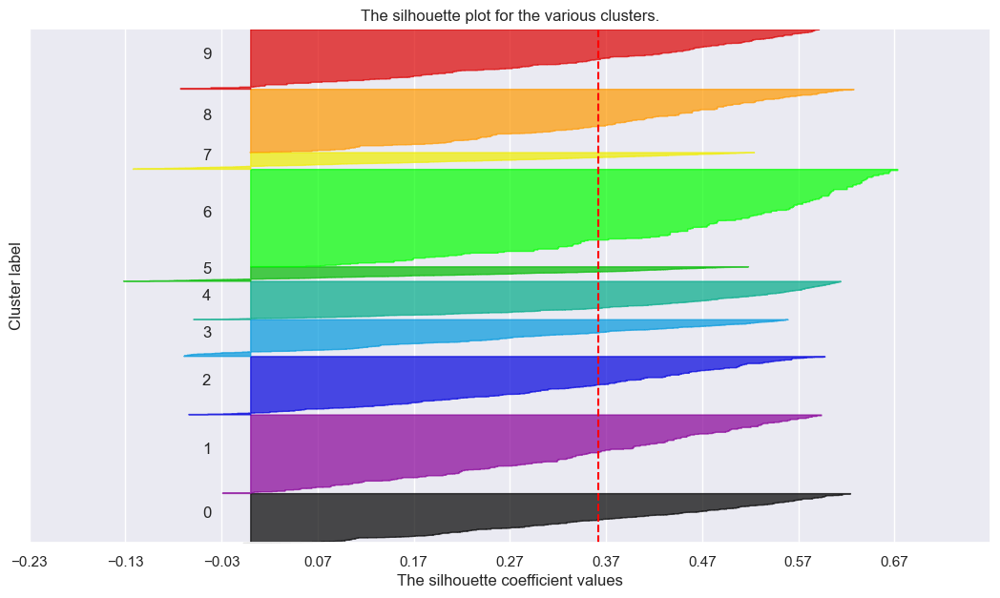

In [162]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_demographic[metric_dem])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_demographic[metric_dem], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_demographic[metric_dem], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_demographic[metric_dem]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

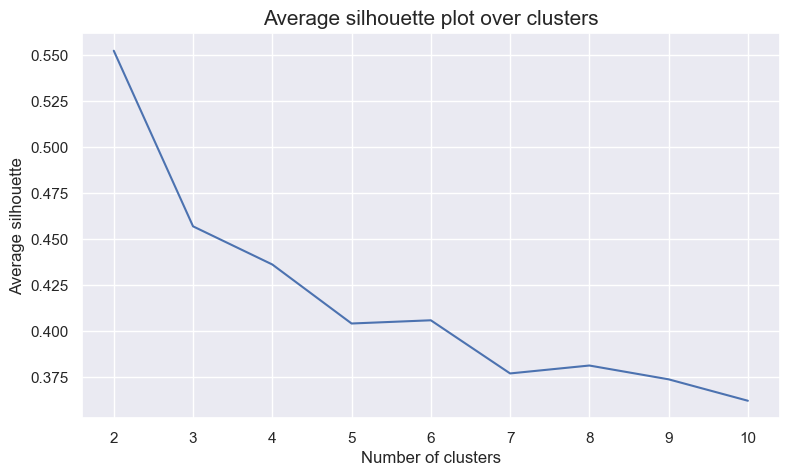

In [163]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters[1:], ## Plot X-axis; Why range_clusters[1:] ? Remember we skipped k=1 in the cell above
         avg_silhouette)     ## Plot Y-axis

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

The best solution would be 3 or 4.

#### Test Clusters

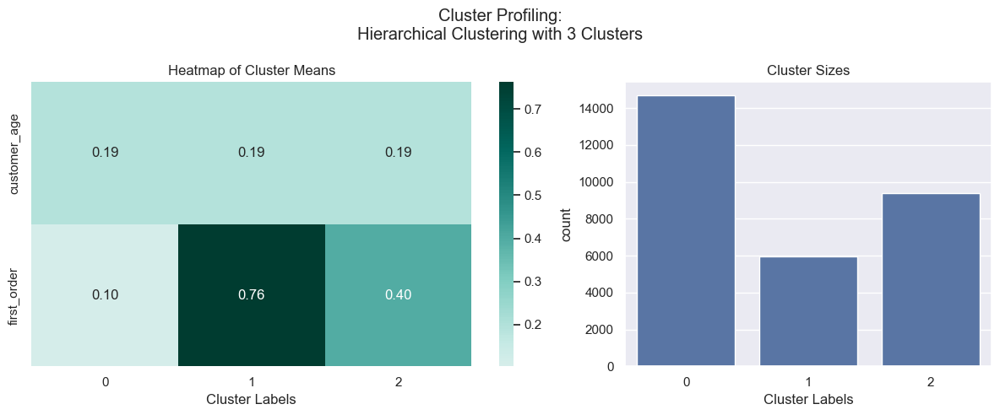

In [164]:
df_kmeans3, labels_kmeans3, centroids3 = test_n_clusters_kmean(3, df_demographic[metric_dem])

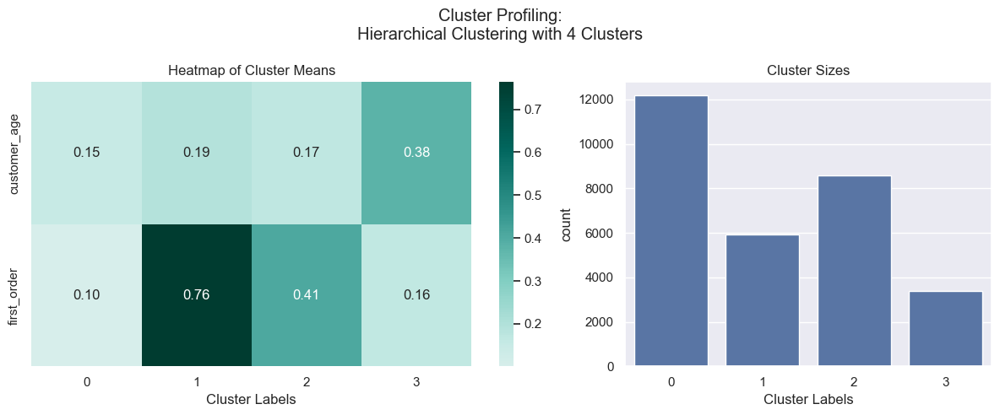

In [165]:
df_kmeans4, labels_kmeans4, centroids4 = test_n_clusters_kmean(4, df_demographic[metric_dem])

In [166]:
kmeans3_dem_r2 = get_r2(df_kmeans3, labels_kmeans3)
kmeans3_dem_r2

0.7620829197525899

In [167]:
kmeans4_dem_r2 = get_r2(df_kmeans4, labels_kmeans4)
kmeans4_dem_r2

0.8107565763649818

In [168]:
kmeans3_dem_silh = silhouette(df_kmeans3, labels_kmeans3)
kmeans3_dem_silh

0.456980417114634

In [169]:
kmeans4_dem_silh = silhouette(df_kmeans4, labels_kmeans4)
kmeans4_dem_silh

0.4362327319384768

The best result is with 4 clusters.

#### Final KMeans clustering solution

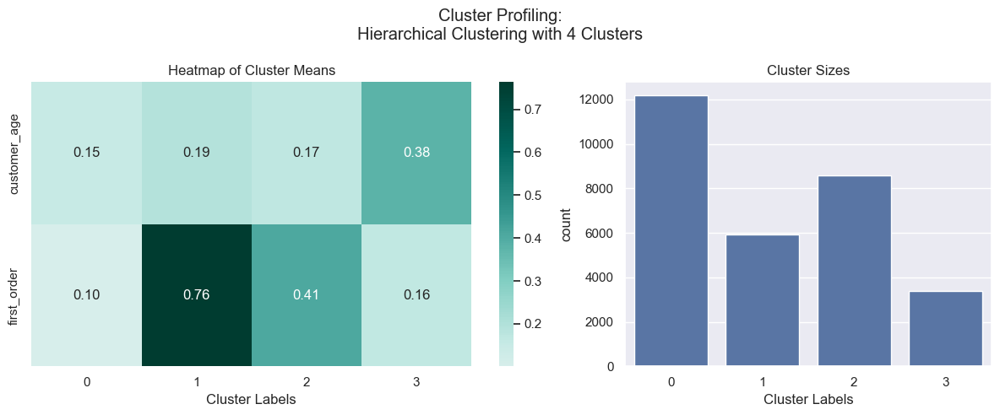

In [170]:
df_kmeans4, labels_kmeans4, centroids4 = test_n_clusters_kmean(4, df_demographic[metric_dem])

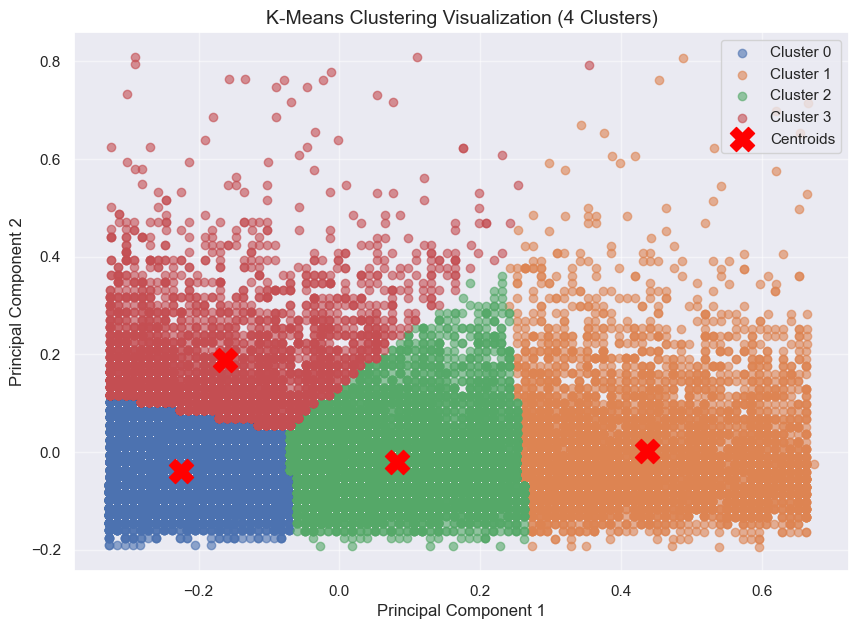

In [171]:
# Apply PCA to reduce data to 2D for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_demographic[metric_dem])

# Scatter plot for the clusters
plt.figure(figsize=(10, 7))
for cluster in range(4):
    cluster_points = reduced_data[labels_kmeans4 == cluster]
    plt.scatter(
        cluster_points[:, 0], 
        cluster_points[:, 1], 
        label=f'Cluster {cluster}', 
        alpha=0.6
    )

# Plot the centroids
centroids = pca.transform(centroids4)
plt.scatter(
    centroids[:, 0], 
    centroids[:, 1], 
    s=300, 
    c='red', 
    marker='X', 
    label='Centroids'
)

# Add titles and legend
plt.title('K-Means Clustering Visualization (4 Clusters)', fontsize=14)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(alpha=0.5)
plt.show()

In [172]:
new_row = pd.DataFrame({
    "Method": ["K-Means"], "Clusters": [4], "R2": [kmeans4_dem_r2], "Silhouette": [kmeans4_dem_silh]
})

results_dem = pd.concat([results_dem, new_row], ignore_index=True)
results_dem

,Method,Clusters,R2,Silhouette
0,Hierarchical,3,0.711731,0.418391
1,K-Means,4,0.810757,0.436233


## K-Means + Hierarchical Clustering 

### Product Perspective

Combining these two methods usually goes like this:
- Use K-Means to pre-cluster the data
- Apply Hierarchical Clustering on the centroids obtained before

We could use the best solution of KMeans that we just determined, however we have to make sure that the number os clusters combining both methods still remain 5. After that, we will see which linkage method is the best to then apply to the Hierarchical Clustering.

In [173]:
km = KMeans(n_clusters=50, init='k-means++', n_init=15, random_state=1)
km_labels = km.fit_predict(df_product[metric_prod])
centroids = km.cluster_centers_

In [174]:
df_concat = pd.concat((df_product[metric_prod], pd.Series(km_labels, name='labels', index=df_product[metric_prod].index)), axis=1)
df_concat.groupby('labels').mean().head()

,product_count,last_order,recency,total_spent,weekday_orders,weekend_orders,weekend_order_ratio,morning_orders,afternoon_orders,evening_orders
labels,,,,,,,,,,
0,0.119093,0.482658,0.517342,0.458592,0.013873,0.153080,0.870600,0.033152,0.041270,0.014493
1,0.087083,0.936100,0.063900,0.248814,0.084036,0.000000,0.000000,0.035159,0.039212,0.020233
2,0.083123,0.328163,0.671837,0.336466,0.062840,0.001259,0.003386,0.022586,0.027944,0.013074
3,0.101592,0.773564,0.226436,0.174563,0.077179,0.065876,0.295776,0.030083,0.055171,0.056842
4,0.348735,0.909751,0.090249,0.506694,0.203334,0.269739,0.389524,0.078671,0.188706,0.185576


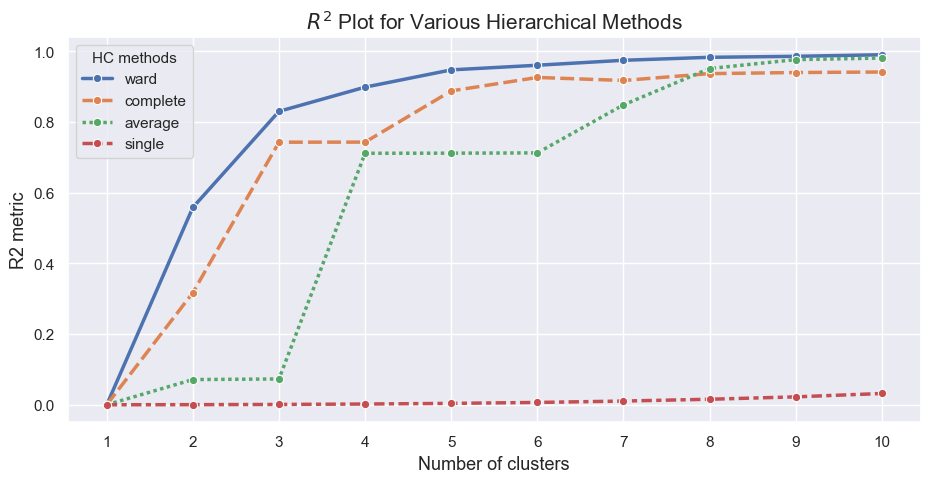

In [175]:
plot_r2_scores(df_concat[metric_prod])

`Ward Linkage` is cleary the best, therefore we will proceed with it.

In [176]:
hc = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hc.fit_predict(df_concat[metric_prod])

array([20851, 22771, 15317, ...,     3,     1,     0], dtype=int64)

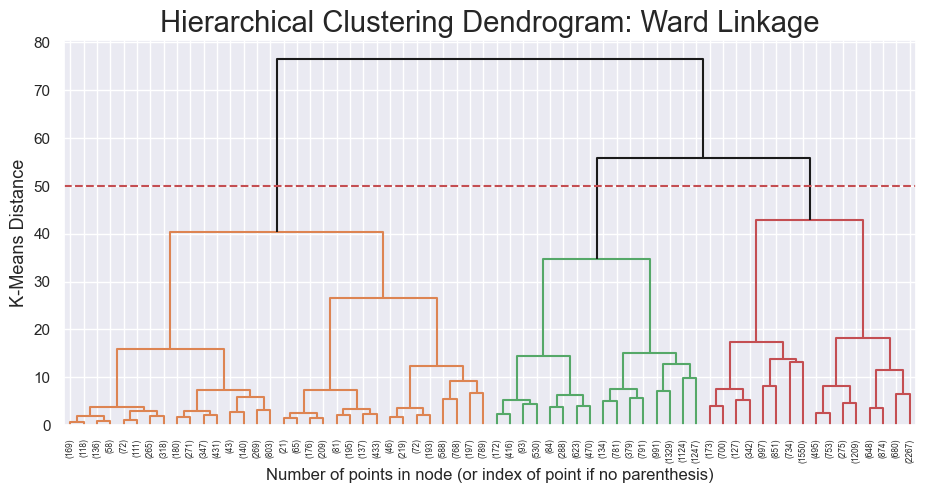

In [177]:
plot_dendrogram("K-Means", hc, "ward", 50)

We can see that 3 or 4 clusters are possible.

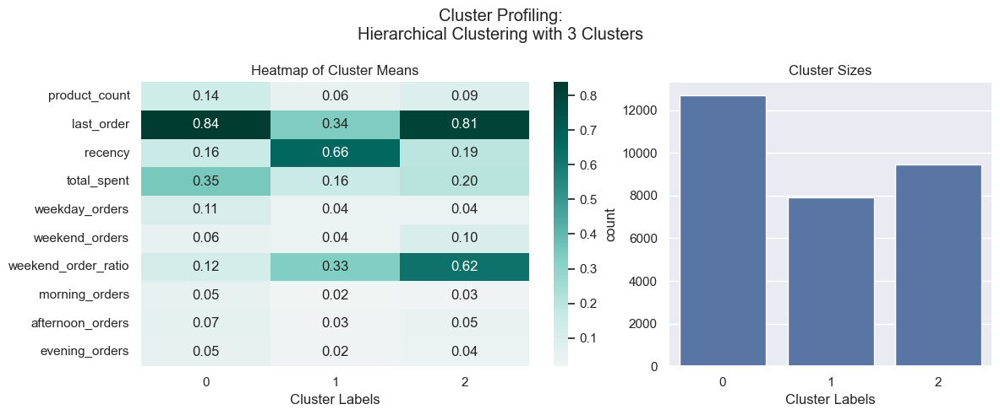

In [178]:
df_km_hc3, labels_hm_hc3 = test_n_clusters_hc(3, df_concat[metric_prod])

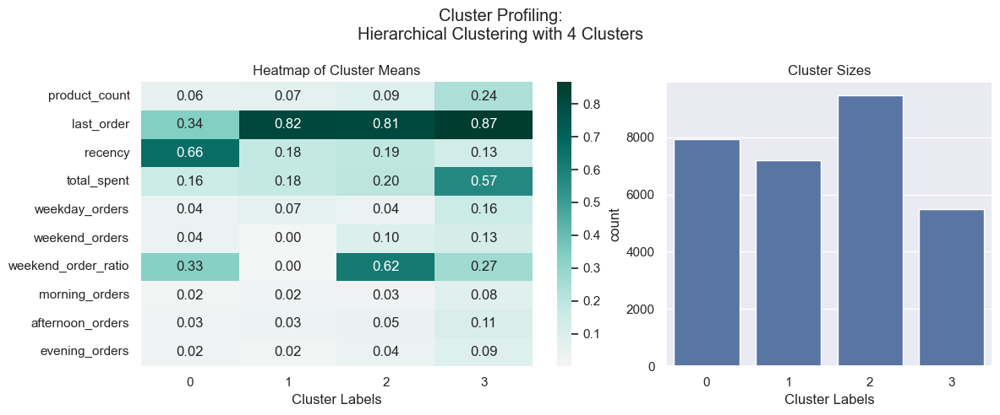

In [179]:
df_km_hc4, labels_hm_hc4 = test_n_clusters_hc(4, df_concat[metric_prod])

In [180]:
km_hc3_r2 = get_r2(df_km_hc3, labels_hm_hc3)
km_hc3_r2

0.455900769076195

In [181]:
km_hc4_r2 = get_r2(df_km_hc4, labels_hm_hc4)
km_hc4_r2

0.5493947436324954

In [182]:
km_hc3_silh = silhouette(df_km_hc3, labels_hm_hc3)
km_hc3_silh

0.25473613830530656

In [183]:
km_hc4_silh = silhouette(df_km_hc4, labels_hm_hc4)
km_hc4_silh

0.2607797501998963

The best results happen with 4 clusters, so that is what we will keep.

#### Best K-Means + Hierarchical Clustering

In [184]:
new_row = pd.DataFrame({
    "Method": ["K-Means + HC"], "Clusters": [4], "R2": [km_hc4_r2], "Silhouette": [km_hc4_silh]
})

results_prod = pd.concat([results_prod, new_row], ignore_index=True)
results_prod

,Method,Clusters,R2,Silhouette
0,Hierarchical,5,0.631827,0.276008
1,K-Means,3,0.520704,0.338668
2,K-Means + HC,4,0.549395,0.260780


### Demografic Perspective

In [185]:
km = KMeans(n_clusters=50, init='k-means++', n_init=15, random_state=1)
km_labels = km.fit_predict(df_demographic[metric_dem])
centroids = km.cluster_centers_

In [186]:
df_concat = pd.concat((df_demographic[metric_dem], pd.Series(km_labels, name='labels', index=df_demographic[metric_dem].index)), axis=1)
df_concat.groupby('labels').mean().head()

,customer_age,first_order
labels,,
0,0.140858,0.073597
1,0.269789,0.549180
2,0.183402,0.292324
3,0.090307,0.932729
4,0.637203,0.088788


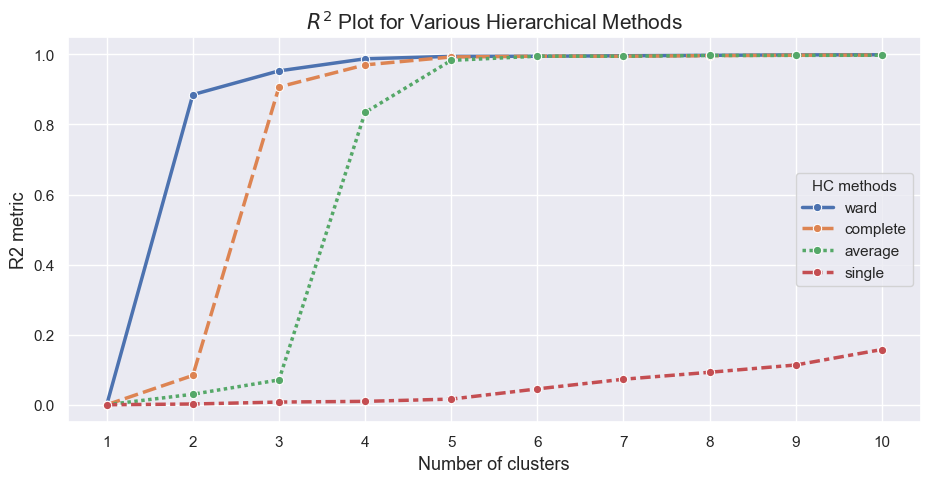

In [187]:
plot_r2_scores(df_demographic[metric_dem])

`Ward Linkage` is cleary the best, therefore we will proceed with it.

In [188]:
hc = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hc.fit_predict(df_demographic[metric_dem])

array([30046, 30045, 30044, ...,     1,     2,     0], dtype=int64)

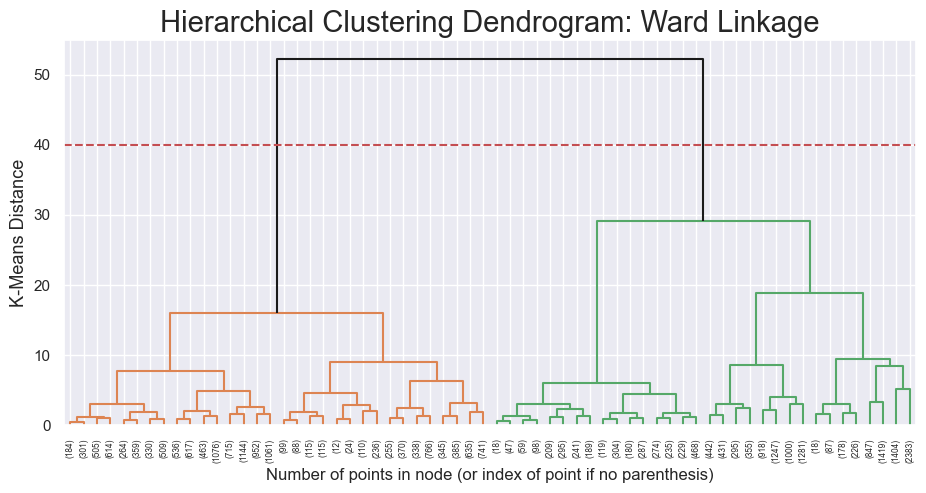

In [189]:
plot_dendrogram("K-Means", hc, "ward", 40)

We can see that 2 or 3 clusters are possible.

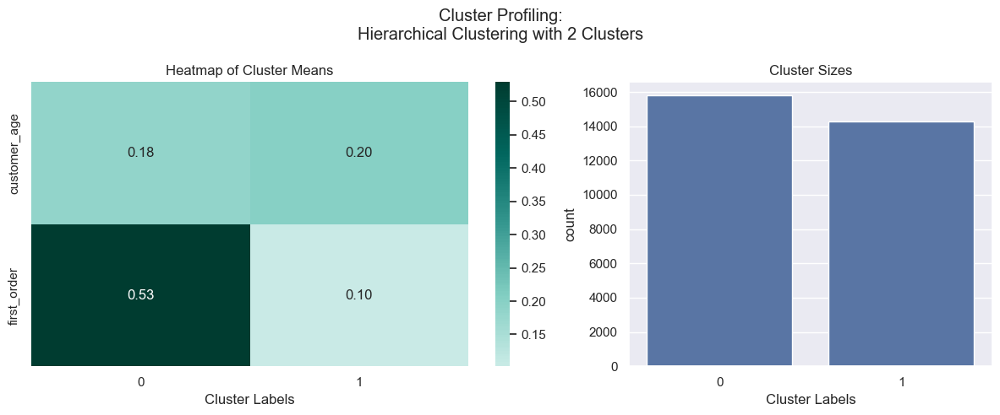

In [190]:
df_km_hc2, labels_hm_hc2 = test_n_clusters_hc(2, df_concat[metric_dem])

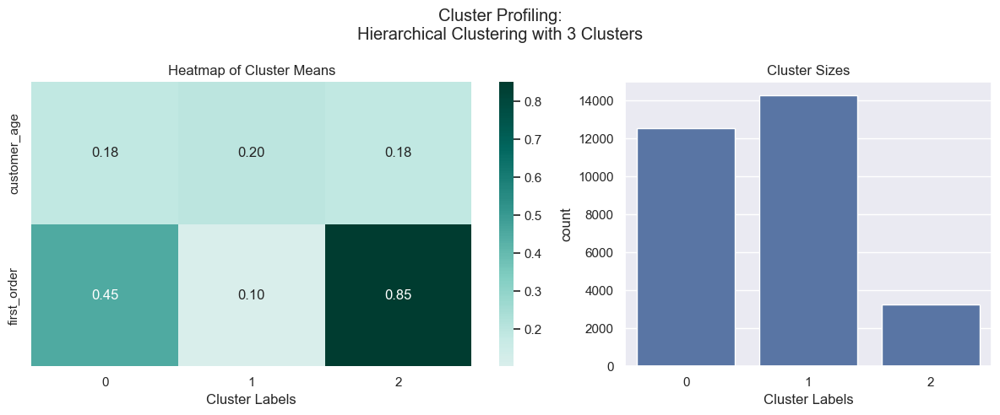

In [191]:
df_km_hc3, labels_hm_hc3 = test_n_clusters_hc(3, df_concat[metric_dem])

In [192]:
km_hc_r2 = get_r2(df_km_hc2, labels_hm_hc2)
km_hc_r2

0.5433832476393095

In [193]:
km_hc_r3 = get_r2(df_km_hc3, labels_hm_hc3)
km_hc_r3

0.7117314168156831

In [194]:
km_hc_silh2 = silhouette(df_km_hc2, labels_hm_hc2)
km_hc_silh2

0.4516880767829985

In [195]:
km_hc_silh3 = silhouette(df_km_hc3, labels_hm_hc3)
km_hc_silh3

0.41839097158134564

#### Best K-Means + Hierarchical Clustering

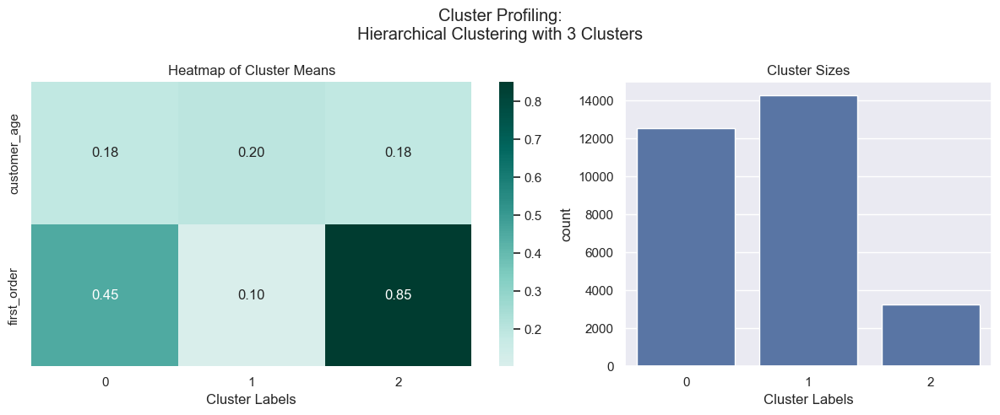

In [196]:
df_km_hc3, labels_hm_hc3 = test_n_clusters_hc(3, df_concat[metric_dem])

The best results happen with 3 clusters, so that is what we will keep.

In [197]:
new_row = pd.DataFrame({
    "Method": ["K-Means + HC"], "Clusters": [4], "R2": [km_hc_r3], "Silhouette": [km_hc_silh3]
})

results_dem = pd.concat([results_dem, new_row], ignore_index=True)
results_dem

,Method,Clusters,R2,Silhouette
0,Hierarchical,3,0.711731,0.418391
1,K-Means,4,0.810757,0.436233
2,K-Means + HC,4,0.711731,0.418391


## DBSCAN

### Product Perspective

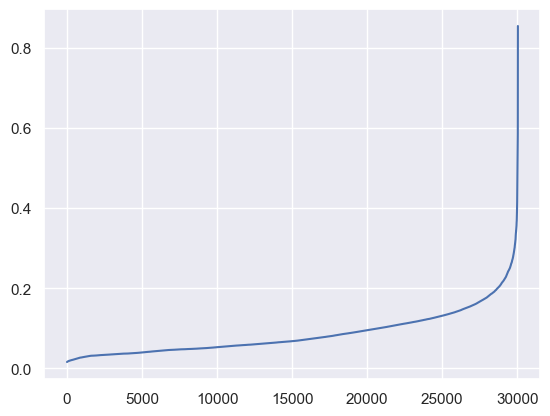

In [198]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df_product[metric_prod])
distances, _ = neigh.kneighbors(df_product[metric_prod])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [199]:
dbscan = DBSCAN(eps=0.15, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_product[metric_prod])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 3


In [200]:
# Concatenating the labels to df
df_concat = pd.concat([df_product[metric_prod], pd.Series(dbscan_labels, index=df_product[metric_prod].index, name="dbscan_labels")], axis=1)
df_concat.head()

# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

,product_count,last_order,recency,total_spent,weekday_orders,weekend_orders,weekend_order_ratio,morning_orders,afternoon_orders,evening_orders,dbscan_labels
4,0.108696,0.011236,0.988764,0.459836,0.026316,0.055556,0.500000,0.066667,0.00000,0.000000,-1
8,0.086957,0.022472,0.977528,0.117485,0.026316,0.111111,0.666667,0.000000,0.03125,0.095238,-1
21,0.130435,0.044944,0.955056,0.602538,0.052632,0.111111,0.500000,0.033333,0.06250,0.000000,-1
23,0.130435,0.056180,0.943820,0.507682,0.052632,0.166667,0.600000,0.100000,0.03125,0.000000,-1
25,0.065217,0.056180,0.943820,0.052605,0.026316,0.111111,0.666667,0.033333,0.06250,0.000000,-1
...,...,...,...,...,...,...,...,...,...,...,...
25993,0.108696,0.685393,0.314607,0.705077,0.000000,0.055556,1.000000,0.000000,0.03125,0.000000,-1
26236,0.152174,0.696629,0.303371,0.828741,0.000000,0.111111,1.000000,0.033333,0.03125,0.000000,-1
27386,0.173913,0.820225,0.179775,0.853457,0.078947,0.055556,0.250000,0.000000,0.00000,0.190476,-1
27437,0.130435,0.932584,0.067416,0.715013,0.000000,0.111111,1.000000,0.033333,0.00000,0.000000,-1


In [201]:
df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
sst = get_ss(df_product[metric_prod])  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3496


### Demographic Perspective

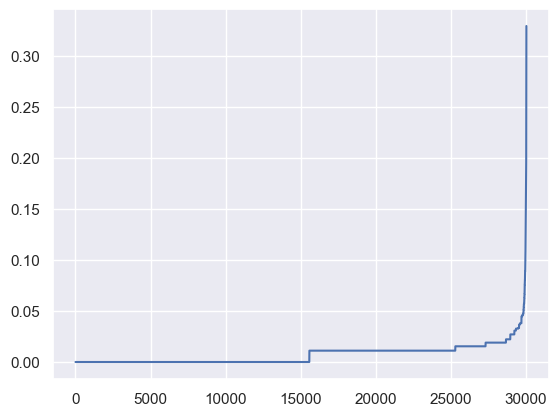

In [202]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df_demographic[metric_dem])
distances, _ = neigh.kneighbors(df_demographic[metric_dem])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [203]:
dbscan = DBSCAN(eps=0.03, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_demographic[metric_dem])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 4


In [204]:
# Concatenating the labels to df
df_concat = pd.concat([df_demographic[metric_dem], pd.Series(dbscan_labels, index=df_demographic[metric_dem].index, name="dbscan_labels")], axis=1)
df_concat.head()

# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

,customer_age,first_order,dbscan_labels
478,0.646154,0.000000,-1
787,0.815385,0.000000,-1
814,0.630769,0.000000,-1
875,0.630769,0.000000,-1
973,0.692308,0.000000,-1
...,...,...,...
29970,0.415385,0.988889,-1
29982,0.430769,0.988889,-1
29994,0.476923,0.988889,-1
30021,0.446154,0.988889,-1


In [205]:
df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
sst = get_ss(df_demographic[metric_dem])  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0622


## Self Organazing Maps

In [206]:
def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    
    axs = sf.subplots(1,1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            wx, wy = som.convert_map_to_euclidean((i,j)) 

            hex = RegularPolygon((wx, wy), 
                                numVertices=6, 
                                radius= np.sqrt(1/3),
                                facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                alpha=1, 
                                edgecolor='white',
                                linewidth=.5)
            axs.add_patch(hex)
            if annot==True:
                annot_val = np.round(matrix_vals[i,j],2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx,wy, annot_val, 
                        ha='center', va='center', 
                        fontsize='x-small')


    ## Remove axes for hex plot
    axs.margins(.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    

    # ## Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    ## Create a Mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    ## Create custom colorbar 
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm
                            )
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar to plot
    sf.add_axes(ax_cb)

    return sf 

### Product Perspective

#### SOMs

In [207]:
M = 10
N = 10
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(metric_prod)
learning_rate = .7

som_data = df_product[metric_prod].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42
             )

# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print("Before training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))

# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 20000)

print("After training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))

Before training:
QE 0.1545
TE 0.9265
After training:
QE 0.1648
TE 0.41


In [208]:
weights = sm.get_weights()
weights.shape

(10, 10, 10)

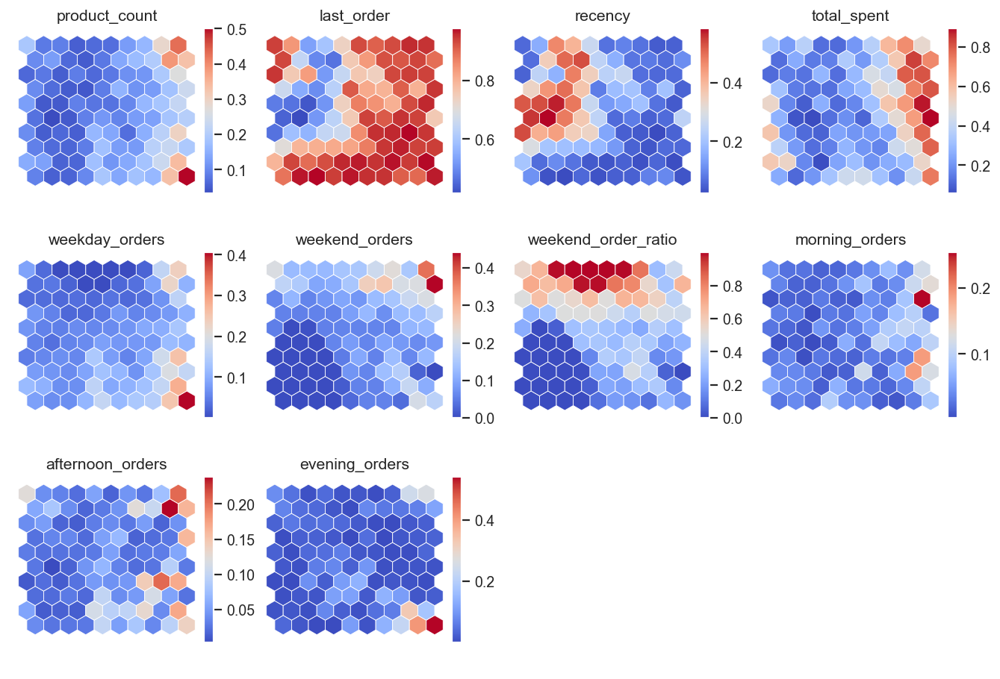

In [209]:
figsize=(10,7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(3,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(metric_prod)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))

    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=metric_prod[cpi],
                    cmap=cm.coolwarm,
                    )

#### U-Matrix

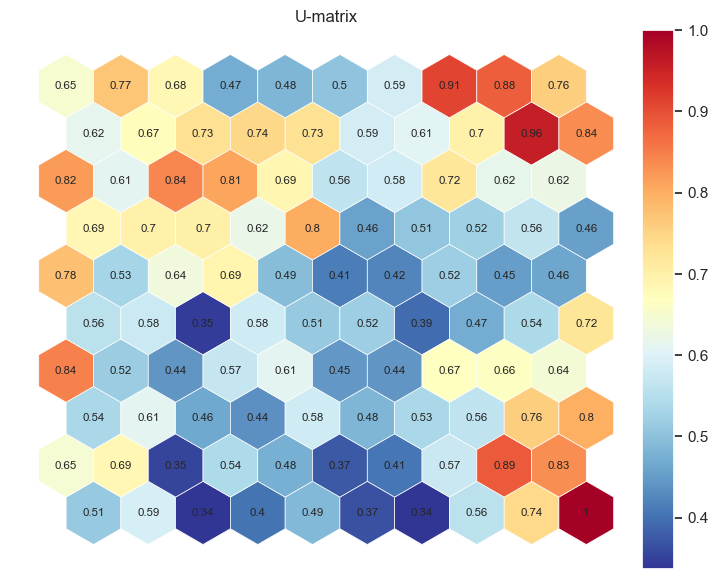

In [210]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    annot=True
                    )

#### Hit-Map

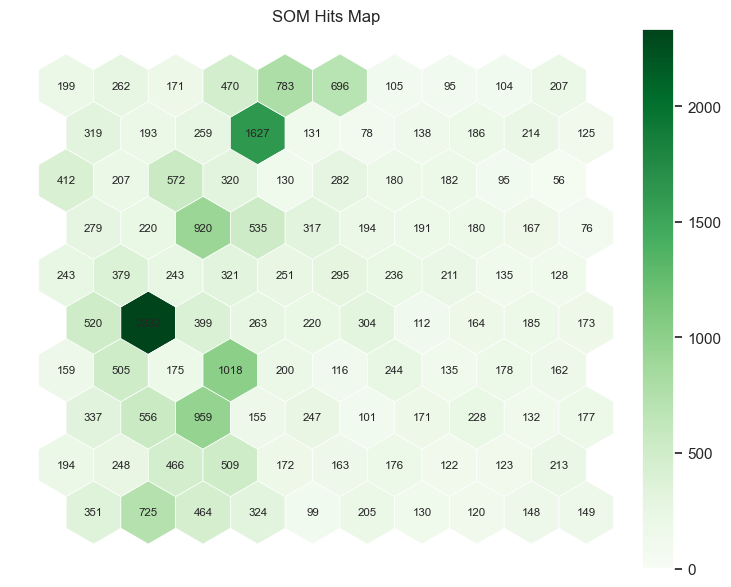

In [211]:
hitsmatrix = sm.activation_response(df_product[metric_prod].values)

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    annot=True
                    )

#### Hierarchical Clustering on top of SOMs

In [212]:
M = 50
N = 50
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(metric_prod)
learning_rate = .7


som_data = df_product[metric_prod].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42
             )


som_data = df_product[metric_prod].values
# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print(np.round(sm.quantization_error(som_data),4), "Starting QE")
print(np.round(sm.topographic_error(som_data),4), "Starting TE")


# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 500000)
print(np.round(sm.quantization_error(som_data),4),"Ending QE")
print(np.round(sm.topographic_error(som_data),4),"Ending TE")

0.0651 Starting QE
0.9968 Starting TE
0.0641 Ending QE
0.5293 Ending TE


In [213]:
weights_flat = sm.get_weights().reshape((M*N),len(metric_prod))
weights_flat.shape

(2500, 10)

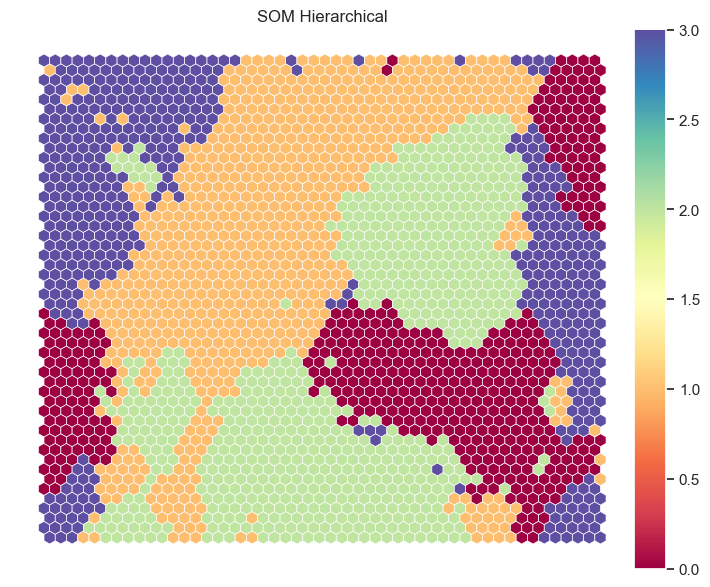

In [214]:
# Perform Hierarchical clustering on top of the MxN units 

hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

#### K-Means on top of SOMs

In [215]:
# Perform K-Means clustering on top of the MxN units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)
nodeclus_labels

array([0, 0, 0, ..., 3, 3, 3])

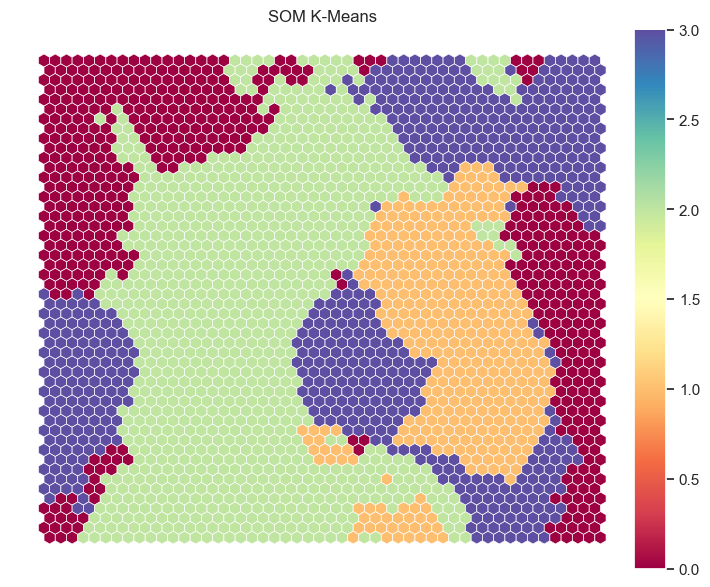

In [216]:
kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )

#### Final SOM Clustering Solution

In [217]:
nodes = weights_flat

df_nodes = pd.DataFrame(nodes, columns=metric_prod)
df_nodes['label'] = nodeclus_labels
df_nodes

,product_count,last_order,recency,total_spent,weekday_orders,weekend_orders,weekend_order_ratio,morning_orders,afternoon_orders,evening_orders,label
0,0.265033,0.858967,0.141033,0.657247,0.144174,0.198584,0.397774,0.039455,0.113751,0.187904,0
1,0.245187,0.842973,0.157027,0.618154,0.135396,0.197671,0.411858,0.035777,0.198685,0.059548,0
2,0.230372,0.881647,0.118353,0.695847,0.098934,0.220547,0.513236,0.064695,0.145425,0.025006,0
3,0.252118,0.958646,0.041354,0.658623,0.120370,0.269447,0.513941,0.207843,0.043142,0.030808,0
4,0.201296,0.925546,0.074454,0.572066,0.078105,0.280608,0.626865,0.093571,0.058835,0.042347,3
...,...,...,...,...,...,...,...,...,...,...,...
2495,0.103124,0.927298,0.072702,0.137188,0.026883,0.185684,0.762499,0.001786,0.011487,0.174131,3
2496,0.167852,0.964301,0.035699,0.206035,0.052237,0.251802,0.692556,0.043076,0.042487,0.179427,3
2497,0.225905,0.931238,0.068762,0.291974,0.046310,0.324682,0.767573,0.010151,0.083647,0.214194,3
2498,0.260020,0.900299,0.099701,0.311578,0.011571,0.534644,0.956130,0.132191,0.151807,0.057556,3


In [218]:
bmu_index = np.array([sm.winner(x) for x in df_product[metric_prod].values])

print(bmu_index.shape)

bmu_index

(30047, 2)


array([[38, 24],
       [37, 24],
       [37, 24],
       ...,
       [15, 27],
       [15, 27],
       [ 2, 14]], dtype=int64)

In [219]:
som_final_labels = [hclust_matrix[i[0]][i[1]] for i in bmu_index]

In [220]:
df_final = pd.concat([
                df_product[metric_prod],
                pd.Series(som_final_labels, name='label', index=df_product[metric_prod].index)
            ], axis=1
            )

df_final

,product_count,last_order,recency,total_spent,weekday_orders,weekend_orders,weekend_order_ratio,morning_orders,afternoon_orders,evening_orders,label
0,0.108696,0.000000,1.000000,0.238059,0.026316,0.055556,0.5,0.000000,0.00000,0.095238,2
1,0.043478,0.000000,1.000000,0.157315,0.026316,0.055556,0.5,0.066667,0.00000,0.000000,2
2,0.043478,0.000000,1.000000,0.073731,0.026316,0.055556,0.5,0.066667,0.00000,0.000000,2
3,0.065217,0.011236,0.988764,0.260438,0.026316,0.055556,0.5,0.033333,0.03125,0.000000,2
4,0.108696,0.011236,0.988764,0.459836,0.026316,0.055556,0.5,0.066667,0.00000,0.000000,2
...,...,...,...,...,...,...,...,...,...,...,...
30042,0.021739,0.988764,0.011236,0.011523,0.026316,0.000000,0.0,0.000000,0.00000,0.047619,1
30043,0.021739,0.988764,0.011236,0.012442,0.026316,0.000000,0.0,0.000000,0.03125,0.000000,1
30044,0.043478,0.988764,0.011236,0.190214,0.026316,0.000000,0.0,0.000000,0.03125,0.000000,1
30045,0.065217,0.988764,0.011236,0.180695,0.026316,0.000000,0.0,0.000000,0.03125,0.000000,1


In [221]:
df_final[metric_prod+['label']].groupby('label').mean()

,product_count,last_order,recency,total_spent,weekday_orders,weekend_orders,weekend_order_ratio,morning_orders,afternoon_orders,evening_orders
label,,,,,,,,,,
0,0.074908,0.639789,0.360211,0.187455,0.015655,0.117917,0.892116,0.022416,0.037058,0.028642
1,0.104706,0.908325,0.091675,0.216149,0.083690,0.045677,0.186491,0.031450,0.054604,0.047926
2,0.066685,0.511709,0.488291,0.175130,0.051692,0.028870,0.165136,0.021438,0.030894,0.026555
3,0.244350,0.889797,0.110203,0.643779,0.155748,0.139578,0.303334,0.085328,0.107044,0.070791


In [222]:
som_r2_prod = get_r2(df_final[metric_prod], som_final_labels)
som_r2_prod

0.530154120108008

In [223]:
som_silh_prod = silhouette(df_final[metric_prod], som_final_labels)
som_silh_prod

0.23956962591286832

In [224]:
new_row = pd.DataFrame({
    "Method": ["Self Organizing Maps"], "Clusters": [4], "R2": [som_r2_prod], "Silhouette": [som_silh_prod]
})

results_prod = pd.concat([results_prod, new_row], ignore_index=True)
results_prod

,Method,Clusters,R2,Silhouette
0,Hierarchical,5,0.631827,0.276008
1,K-Means,3,0.520704,0.338668
2,K-Means + HC,4,0.549395,0.260780
3,Self Organizing Maps,4,0.530154,0.239570


### Demographic Perspective

#### SOMs

In [225]:
M = 10
N = 10
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(metric_dem)
learning_rate = .7

som_data = df_demographic[metric_dem].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42
             )

# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print("Before training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))

# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 20000)

print("After training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))

Before training:
QE 0.0319
TE 0.9146
After training:
QE 0.1089
TE 0.4247


In [226]:
weights = sm.get_weights()
weights.shape

(10, 10, 2)

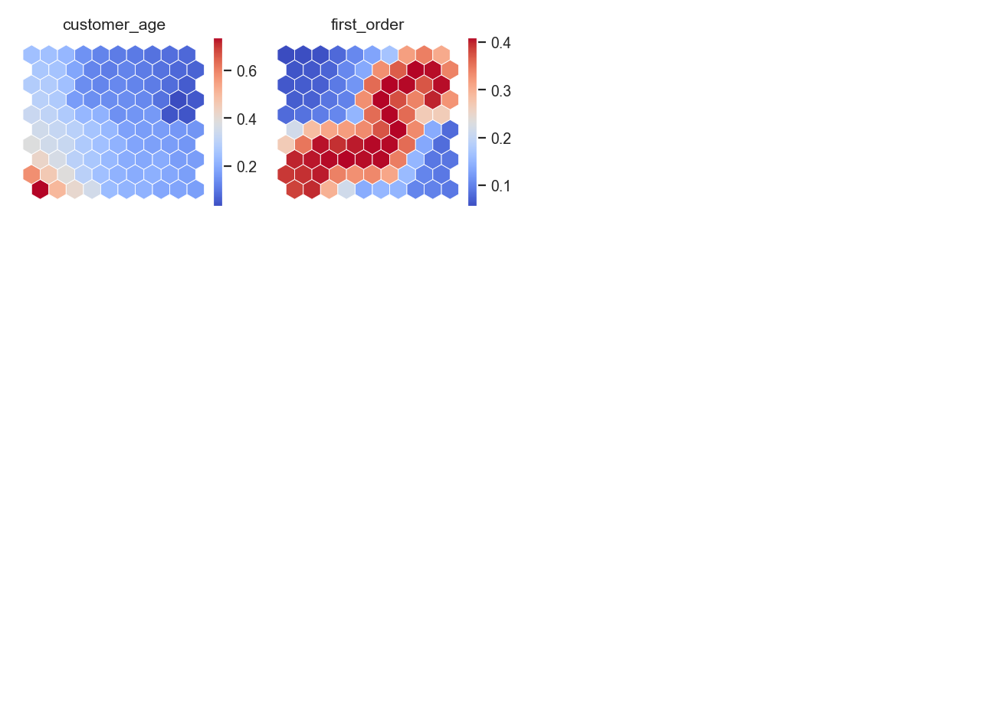

In [227]:
figsize=(10,7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(3,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(metric_dem)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))

    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=metric_dem[cpi],
                    cmap=cm.coolwarm,
                    )

#### U-Matrix

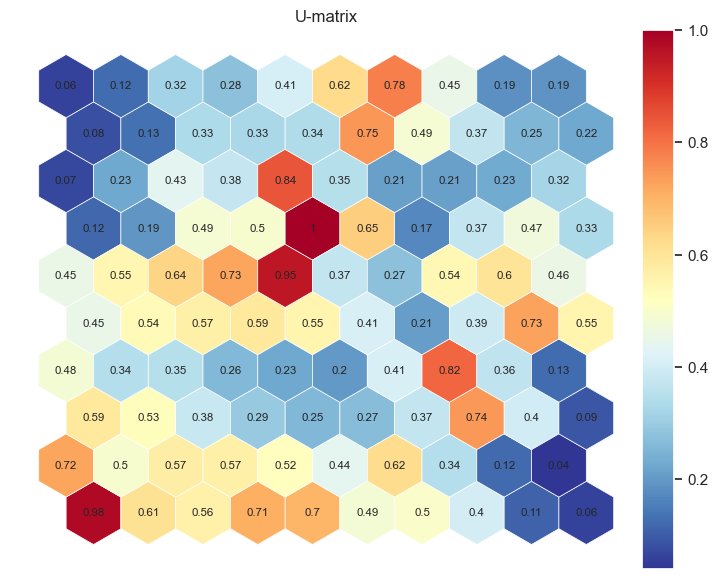

In [228]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    annot=True
                    )

#### Hit-Map

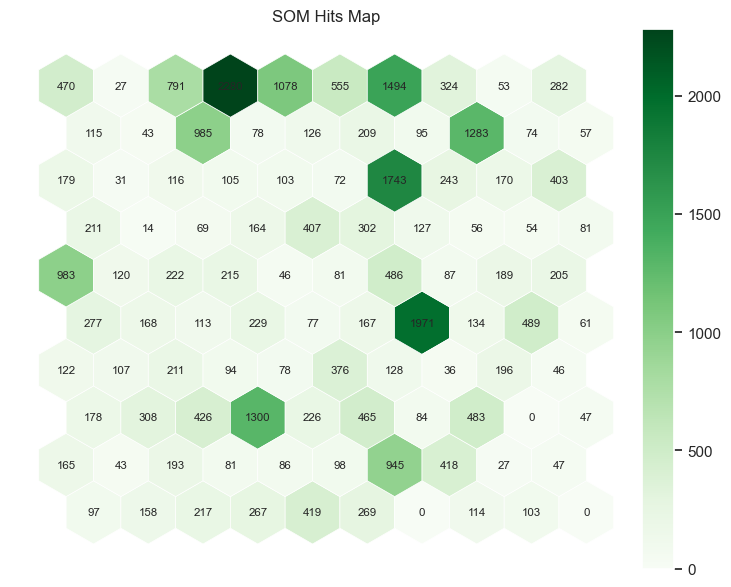

In [229]:
hitsmatrix = sm.activation_response(df_demographic[metric_dem].values)

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    annot=True
                    )

#### Hierarchical Clustering on top of SOMs

In [230]:
M = 50
N = 50
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(metric_dem)
learning_rate = .7


som_data = df_demographic[metric_dem].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42
             )


som_data = df_demographic[metric_dem].values
# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print(np.round(sm.quantization_error(som_data),4), "Starting QE")
print(np.round(sm.topographic_error(som_data),4), "Starting TE")


# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 500000)
print(np.round(sm.quantization_error(som_data),4),"Ending QE")
print(np.round(sm.topographic_error(som_data),4),"Ending TE")

0.0041 Starting QE
0.9982 Starting TE
0.0064 Ending QE
0.4092 Ending TE


In [231]:
weights_flat = sm.get_weights().reshape((M*N),len(metric_dem))
weights_flat.shape

(2500, 2)

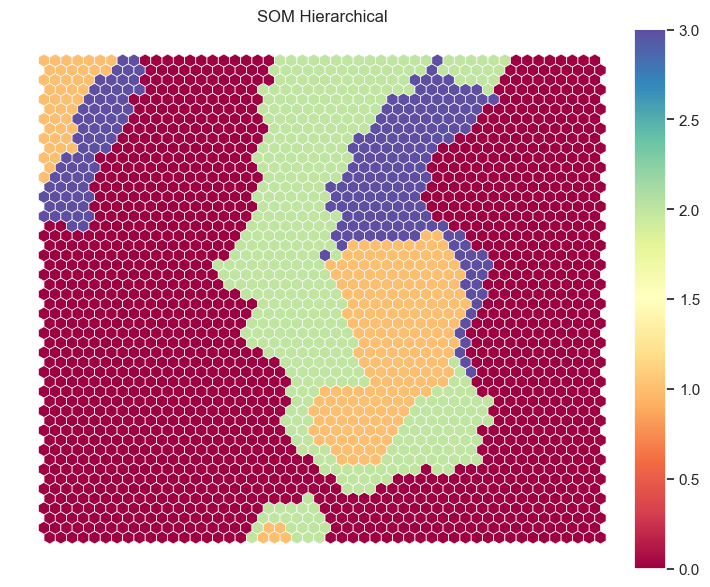

In [232]:
# Perform Hierarchical clustering on top of the MxN units 

hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

#### K-Means on top of SOMs

In [233]:
# Perform K-Means clustering on top of the MxN units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)
nodeclus_labels

array([0, 0, 0, ..., 2, 2, 2])

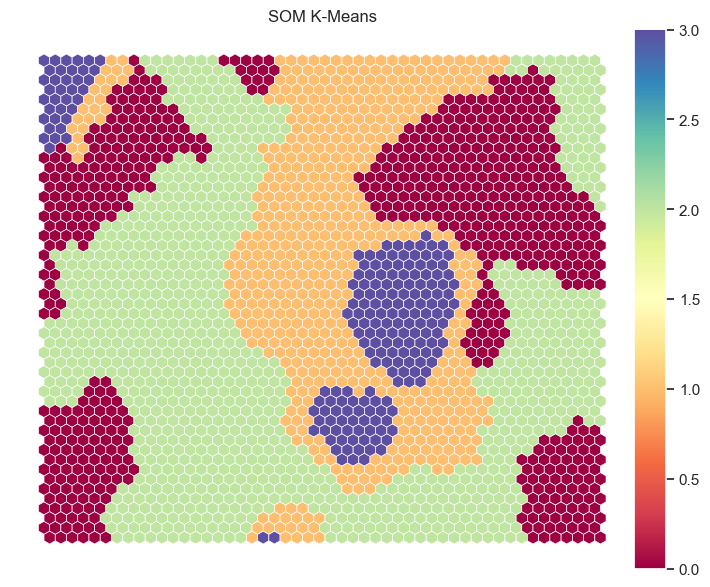

In [234]:
kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )

#### Final SOM Clustering Solution

In [235]:
nodes = weights_flat

df_nodes = pd.DataFrame(nodes, columns=metric_dem)
df_nodes['label'] = nodeclus_labels
df_nodes

,customer_age,first_order,label
0,0.246154,0.122222,0
1,0.246154,0.122556,0
2,0.246154,0.144367,0
3,0.246154,0.144444,0
4,0.246172,0.144370,0
...,...,...,...
2495,0.123084,0.095625,2
2496,0.123077,0.099988,2
2497,0.123081,0.100003,2
2498,0.125216,0.101545,2


In [236]:
bmu_index = np.array([sm.winner(x) for x in df_demographic[metric_dem].values])

print(bmu_index.shape)

bmu_index

(30047, 2)


array([[15,  0],
       [16,  1],
       [ 4, 32],
       ...,
       [27, 11],
       [28, 11],
       [31, 23]], dtype=int64)

In [237]:
som_final_labels = [hclust_matrix[i[0]][i[1]] for i in bmu_index]

In [238]:
df_final = pd.concat([
                df_demographic[metric_dem],
                pd.Series(som_final_labels, name='label', index=df_demographic[metric_dem].index)
            ], axis=1
            )

df_final

,customer_age,first_order,label
0,0.046154,0.000000,0
1,0.030769,0.000000,0
2,0.353846,0.000000,0
3,0.169231,0.000000,0
4,0.076923,0.000000,0
...,...,...,...
30042,0.907692,0.988889,1
30043,0.169231,0.988889,1
30044,0.076923,0.988889,1
30045,0.107692,0.988889,1


In [239]:
df_final[metric_dem+['label']].groupby('label').mean()

,customer_age,first_order
label,,
0,0.171461,0.084122
1,0.203112,0.686687
2,0.143799,0.334584
3,0.380989,0.242481


In [240]:
som_r2_dem = get_r2(df_final[metric_dem], som_final_labels)
som_r2_dem

0.7758231478517907

In [241]:
som_silh_dem = silhouette(df_final[metric_dem], som_final_labels)
som_silh_dem

0.4030624047572989

In [242]:
new_row = pd.DataFrame({
    "Method": ["Self Organizing Maps"], "Clusters": [4], "R2": [som_r2_dem], "Silhouette": [som_silh_dem]
})

results_dem = pd.concat([results_dem, new_row], ignore_index=True)
results_dem

,Method,Clusters,R2,Silhouette
0,Hierarchical,3,0.711731,0.418391
1,K-Means,4,0.810757,0.436233
2,K-Means + HC,4,0.711731,0.418391
3,Self Organizing Maps,4,0.775823,0.403062


# Results

In [243]:
def plot_cluster_distributions(data, labels_name, n_clusters):

    # Extract the list of variables, excluding the cluster labels column
    variables = [col for col in data.columns if col != labels_name]

    palette = sns.color_palette('pastel', n_colors=n_clusters)  # Define a color palette for clusters

    for variable in variables:
        # Set up the grid of subplots for the current variable
        fig, axs = plt.subplots(1, n_clusters, figsize=(5 * n_clusters, 4), constrained_layout=True)
        
        for cluster in range(n_clusters):
            # Filter data for the current cluster
            cluster_data = data[data[labels_name] == cluster]

            ax = axs[cluster]
            # Plot histogram or KDE plot for the current cluster
            sns.histplot(
                cluster_data[variable], kde=False, bins=10, ax=ax, color=palette[cluster],
                label=f'Cluster {cluster}', alpha=0.6, element="step"
            )
            ax.set_title(f'{variable} for Cluster {cluster}')
            ax.set_xlabel(f'{variable}')
            ax.set_ylabel('Count')
            ax.grid(axis='y', linestyle='--', alpha=0.7)

        # Set the title for the variable row
        fig.suptitle(f'Distribution of {variable} by Cluster', fontsize=16)
        plt.show()

## Product Perspective

The best clustering method for the Product Perspective is the `Hierarchical Clustering`. We achieved the best results with it, considering the R2 score and the silhouette (second best score).

In [244]:
df_product = df[metric_prod]

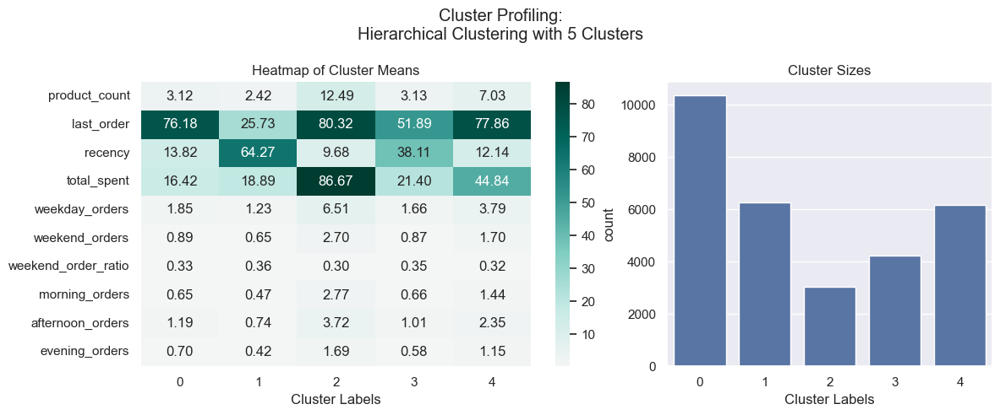

In [245]:
df_hc5, labels_hc5 = test_n_clusters_hc(5, df_product[metric_prod])

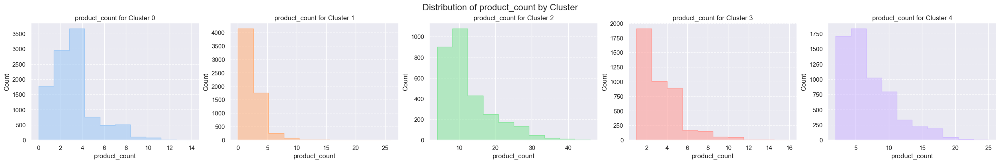

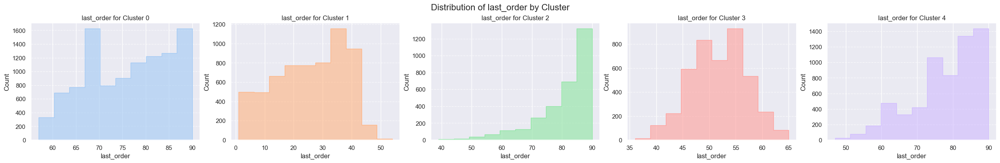

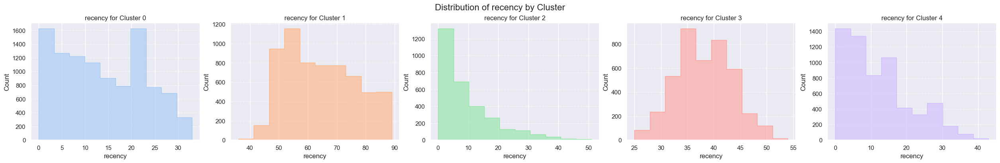

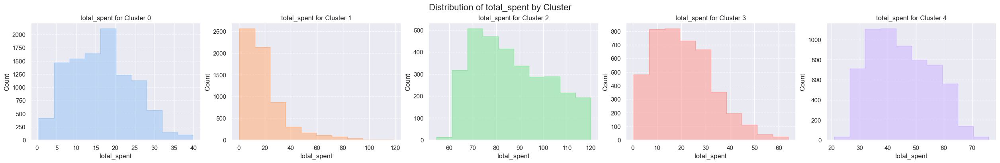

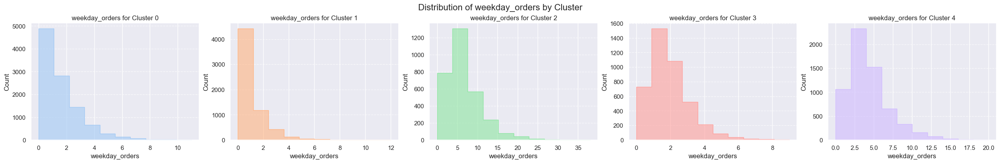

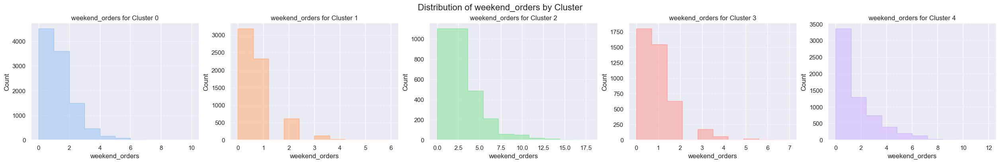

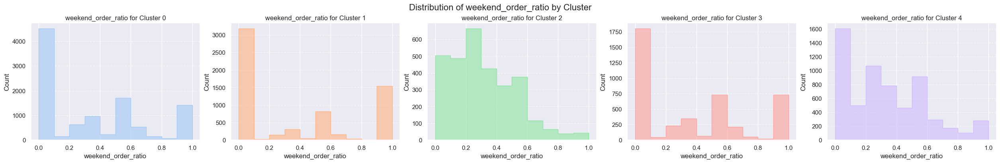

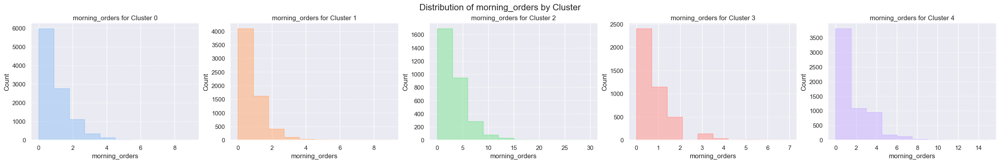

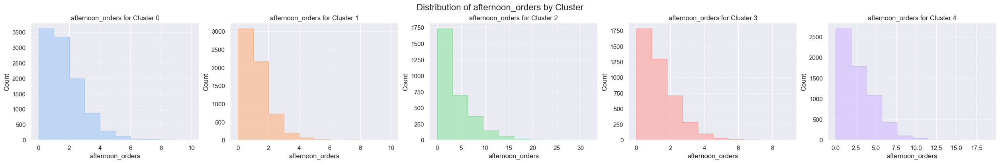

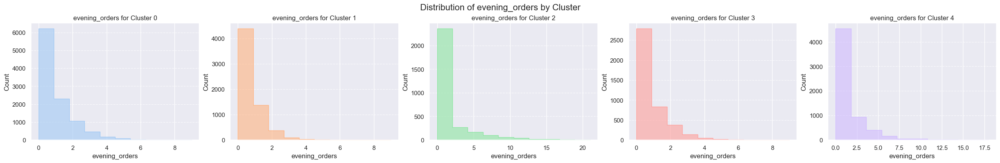

In [246]:
df_hc5['labels'] = labels_hc5
plot_cluster_distributions(df_hc5, 'labels', 5)

## Demographic Perspective

The best clustering method for the Product Perspective is the `K-Means`. We achieved the best results with it, considering the R2 score and the silhouette (both are the best).

In [247]:
df_demographic = df[metric_dem]

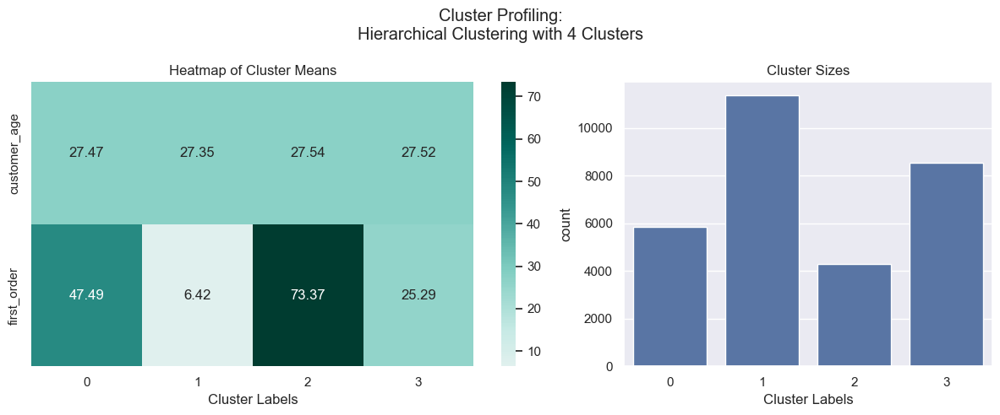

In [248]:
df_kmeans4, labels_kmeans4, centroids4 = test_n_clusters_kmean(4, df_demographic[metric_dem])

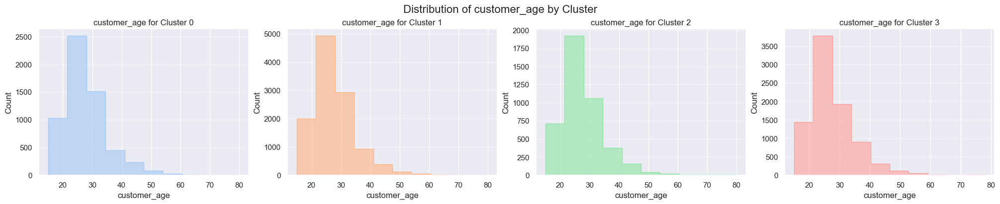

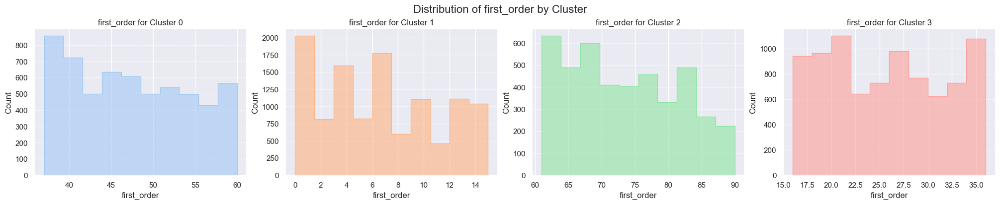

In [249]:
df_kmeans4['labels'] = labels_kmeans4
plot_cluster_distributions(df_kmeans4, 'labels', 4)